In [1]:
from gurobipy import *
from gurobipy import tupledict

import numpy as np
import pandas as pd
import scipy
import timeit
import time
import random
import math

import pdb

from pandas import ExcelWriter

from IPython import display

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def intersection(lst1, lst2):
    return [value for value in lst1 if value in lst2]

def diff_set(lst1, lst2):
    return [value for value in lst1 if value not in lst2]

def simulate_dynamic(low_Td=2, max_Td=10, eta_v = 0.9, eta_DC_v= 0.9, Trans_P=100, low_dl =0.75, high_dl=0.95, S=1, 
                             gamma_v=1, delta=0.05, delta1=1, delta3=1, NumberOfDays=1,Day_of_Month=15, plan_int = 1, p=1, 
                             NumberOfVehicles=100, delta2=0, MipGap=2e-2, timelim=200, intervalTime=0.25):

    low_Td = low_Td/intervalTime ## convert to delta t
    max_Td = max_Td/intervalTime
    N = NumberOfVehicles*NumberOfDays
    num_interval = int(1/intervalTime)     ### number of intervals in one hour
    T = int(NumberOfDays*24*num_interval)
    Onehour_interval = NumberOfDays*24
    plan_interval = NumberOfDays*24*plan_int

    ##Setting number
    global l

    ## Determine the vehicles in discharge mode vs only charge mode
    np.random.seed(101)
    array= np.arange(1,N+1)
    random.shuffle(array)
    V2G_EV= list(array[:int(len(array)*p)])
    G2V_EV = [i for i in range(1,N+1) if i not in V2G_EV]

    ##### General EV data
    #####
    df= pd.read_excel('OptimizationEV.xlsx', sheet_name= 'Opt100_2')
    EV_data= df[['EV', 'Ta', 'Td', 'BC', "IS", 'DL', 'pc', 'AR']].iloc[0:100]
    wind_data= df[['Price', 'Time','Time2', 'Wind prod']].iloc[0:96]

    wind_data.set_index('Time2', inplace=True)
    EV_data.set_index('EV', inplace=True)

    ######## EV arrivals
    ########
    trip_df = pd.read_csv('TripStartTime_TripReason.csv')
    trip_df2= trip_df.iloc[31:, :]
    trip_df2.columns = trip_df.iloc[30]
    trip_df2.reset_index(inplace=True)
    trip_df2[['Home', 'Work']] = trip_df2[['Home', 'Work']].astype('int32', inplace=True)

    prob_home= list(trip_df2.iloc[:-1]['Home']/trip_df2.iloc[-1]['Home'])
    prob_work =list(trip_df2.iloc[:-1]['Work']/trip_df2.iloc[-1]['Work'])

    np.random.seed(3)
    elems = range(1, NumberOfDays*24+1)
    probabilities = [(x+y)/(NumberOfDays*2) for x,y in zip(prob_home, prob_work)]*NumberOfDays
    trips = list(np.random.choice(elems, int(N), p=probabilities))

    np.random.seed(2)
    ######### Wind data
    #########
    df_results = pd.read_csv("results_power.csv")

    Apr_wind = df_results[df_results['Time stamp'].str.find('Apr '+ str(Day_of_Month)) != -1]
    May_wind = df_results[df_results['Time stamp'].str.find('May '+ str(Day_of_Month)) != -1]
    Jun_wind = df_results[df_results['Time stamp'].str.find('Jun '+ str(Day_of_Month)) != -1]
    Jul_wind = df_results[df_results['Time stamp'].str.find('Jul '+ str(Day_of_Month)) != -1]
    Aug_wind = df_results[df_results['Time stamp'].str.find('Aug '+ str(Day_of_Month)) != -1]

    Oct_wind = df_results[df_results['Time stamp'].str.find('Oct '+ str(Day_of_Month)) != -1]
    Dec_wind = df_results[df_results['Time stamp'].str.find('Dec '+ str(Day_of_Month)) != -1]
    Jan_wind = df_results[df_results['Time stamp'].str.find('Jan '+ str(Day_of_Month)) != -1]
    Feb_wind = df_results[df_results['Time stamp'].str.find('Feb '+ str(Day_of_Month)) != -1]
    Nov_wind = df_results[df_results['Time stamp'].str.find('Nov '+ str(Day_of_Month)) != -1]

    if NumberOfDays>1:
        for i in range(1,NumberOfDays):
            Apr_wind = Apr_wind.append(df_results[df_results['Time stamp'].str.find('Apr ' +str(Day_of_Month+i)) != -1])
            May_wind = May_wind.append(df_results[df_results['Time stamp'].str.find('May ' +str(Day_of_Month+i)) != -1])
            Jun_wind = Jun_wind.append(df_results[df_results['Time stamp'].str.find('Jun ' +str(Day_of_Month+i)) != -1])
            Jul_wind = Jul_wind.append(df_results[df_results['Time stamp'].str.find('Jul ' +str(Day_of_Month+i)) != -1])
            Aug_wind = Aug_wind.append(df_results[df_results['Time stamp'].str.find('Aug ' +str(Day_of_Month+i)) != -1])

            Oct_wind = Oct_wind.append(df_results[df_results['Time stamp'].str.find('Oct ' +str(Day_of_Month+i)) != -1])
            Dec_wind = Dec_wind.append(df_results[df_results['Time stamp'].str.find('Dec ' +str(Day_of_Month+i)) != -1])
            Jan_wind = Jan_wind.append(df_results[df_results['Time stamp'].str.find('Jan ' +str(Day_of_Month+i)) != -1])
            Feb_wind = Feb_wind.append(df_results[df_results['Time stamp'].str.find('Feb ' +str(Day_of_Month+i)) != -1])
            Nov_wind = Nov_wind.append(df_results[df_results['Time stamp'].str.find('Nov ' +str(Day_of_Month+i)) != -1])

    Summer_wind = [Apr_wind, May_wind, Jun_wind, Jul_wind, Aug_wind]
    Winter_wind = [Oct_wind, Dec_wind, Jan_wind, Feb_wind, Nov_wind]

    wind_summer = []
    for month in Summer_wind:
        month= [month.iloc[k//num_interval]['System power generated | (kW)']/num_interval for k in range(T)] 
        month = pd.Series(month, index= range(T))
        wind_summer.append(month)

    wind_winter = []
    for month in Winter_wind:
        month= [month.iloc[k//num_interval]['System power generated | (kW)']/num_interval for k in range(T)] 
        month = pd.Series(month, index= range(T))
        wind_winter.append(month)

    ####### Price Data 
    #######
    Price_df = pd.DataFrame(np.zeros((Onehour_interval,1)), index = range(Onehour_interval))
    Summer = ['Apr', 'May', 'Jun', 'Jul', 'Aug']
    Winter = ['Oct', 'Nov', 'Dec','Jan', 'Feb']

    for i in Summer:
        name_df = pd.read_csv('LMPdata/' + i+'_LMP.csv')
        name_df = name_df[name_df['XML_DATA_ITEM'] == 'LMP_PRC']
        name_df = name_df.sort_values('INTERVALSTARTTIME_GMT')[['INTERVALSTARTTIME_GMT', 'MW']]
        name_df.reset_index(inplace=True)
        Price_df[i+'LMP'] = name_df.iloc[:Onehour_interval]['MW']

    for i in Winter:
        name_df = pd.read_csv('LMPdata/' + i+'_LMP.csv')
        name_df = name_df[name_df['XML_DATA_ITEM'] == 'LMP_PRC']
        name_df = name_df.sort_values('INTERVALSTARTTIME_GMT')[['INTERVALSTARTTIME_GMT', 'MW']]
        name_df.reset_index(inplace=True)
        Price_df[i+'LMP'] = name_df.iloc[:Onehour_interval]['MW']

    price_summer = []
    for month in Summer:
        price = [max(0.01,Price_df.iloc[k//num_interval][month+'LMP'])/10 for k in range(T)] #wind data for 96 time slots (every 15 minutes)
        price = pd.Series(price, index= range(T))
        price_summer.append(price)

    price_winter = []
    for month in Winter:
        price = [max(0.01,Price_df.iloc[k//num_interval][month+'LMP'])/10 for k in range(T)] #wind data for 96 time slots (every 15 minutes)
        price = pd.Series(price, index= range(T))
        price_winter.append(price)

    ### Degradation params
    alpha= 1e-1
    beta = 5e-2

    excedding_consumption, wind_curtailment, degradation_c, objective = [], [], [], []

    Total_consumption, Charge_cost, total_wind, Charge_time, Num_variables, Num_Constraints, RunTime = [],[], [], [],[], [],[]

    charge_load, discharge_load, Cost_tot, Revenue= [],[],[],[]
    violation=[]

    Month = ''
    dataset=[]

    park_time = (low_Td +max_Td)/2 -2

    #Simulate S times
    for k in range(S):
        FinalState = np.zeros((N,1))
        if k<5:
            Month = Summer[k%5]
            w = wind_summer[k%5]
            price = price_summer[k%5]
        else:
            Month = Winter[k%5]
            w = wind_winter[k%5]
            price = price_winter[k%5]


        elements = range(1, NumberOfDays*24+1)
        probabilities = [x/NumberOfDays for x in prob_home]*NumberOfDays
        home_trip_time = np.random.choice(elements, int(N/2), p=probabilities)

        probabilities = [x/NumberOfDays for x in prob_work]*NumberOfDays
        work_trip_time = np.random.choice(elements, int(N/2), p=probabilities)

        Ta = list(home_trip_time*num_interval-np.random.randint(1,num_interval,int(N/2)))
        Ta += list(work_trip_time*num_interval-np.random.randint(1,num_interval,int(N/2)))
        Td = list(Ta + np.random.randint(low_Td,max_Td+1, N))
        Td= map(lambda x: min(x,T), Td)
        Ta= pd.Series(Ta, index=range(1,N+1))
        Td= pd.Series(Td, index=range(1,N+1))

        E={}
        for i in range(1,Onehour_interval+1):
            lst= list(Ta[np.ceil(Ta/num_interval) == i].index)
            E['E' + str(i)] = list(map(int, lst))

        ## The set of EVs are fixed

        car = np.random.randint(1,101, N)
        BC = EV_data['BC'][list(car)]
        BC.index = range(1,N+1)
        AR = EV_data['AR'][list(car)]
        pc= EV_data['pc'][list(car)]
        AR.index = range(1,N+1)
        pc.index = range(1,N+1)

        chargepow = np.minimum(AR.values, pc.values)
        chargepow= pd.Series(chargepow, index=range(1,N+1))
        eta = pd.Series(eta_v, index=range(1,N+1))
        eta_DC = pd.Series(eta_DC_v, index=range(1,N+1))

        Degradation_cost1 = pd.Series(0.0, index= range(1,N+1))
        Degradation_cost2 = pd.Series(0.0, index= range(1,N+1))
        revenue = pd.Series(0.0, index= range(1,N+1))
        FinalState = pd.Series(np.zeros((N)), index = range(1,N+1))
        Xch = pd.Series(0.0, index= range(1,N+1))
        Xdch = pd.Series(0.0, index= range(1,N+1))

        cons_w = pd.Series(0.0, index= range(1,N+1))
        cons_z = pd.Series(0.0, index= range(1,N+1))
        cons_DC = pd.Series(0.0, index= range(1,N+1))
        cost = pd.Series(0.0, index= range(1,N+1))
        wind_ev = pd.Series(0.0, index= range(1,N+1))

        #generate using uniform :D
        IS = pd.Series(np.zeros((N)),index = range(1,N+1))
        DL = pd.Series(np.zeros((N)), index= range(1,N+1))
        minSOC = pd.Series(np.ones((N))*5, index= range(1,N+1))

        for i in range(1,N+1):
            IS[i] = np.random.uniform(0.1, (low_dl-0.1)*BC[i])
            DL[i] = np.random.uniform(low_dl*BC[i], high_dl*BC[i])

        for i in range(1,N+1):
            if Td[i] == T:
                DL[i] = DL[i] * (T-Td[i]) / (max_Td - low_Td)

        ISSS = IS.copy()
        mean_IS= IS.mean()

        for i in range(1,N+1):
            BC[i] = max(BC[i], chargepow[i]/num_interval+DL[i])

        EE ={}
        for t in range(T):
            EE[t] = [i for i in range(1, N+1) if t in range(Ta[i], Td[i])]

        consumption =0
        m =[]

        D = pd.Series(0, index=range(0,T), dtype= 'float32')
        charging_load = pd.Series(0, index=range(0,T), dtype= 'float32')
        discharging_load = pd.Series(0, index=range(0,T), dtype= 'float32')

        Consumption_wind, Consumption_DC, Consumption_z = 0 ,0 ,0

        X= tupledict()
        Y1= tupledict()
        Y2= tupledict()
        SOC= tupledict()
        z= tupledict()
        c= tupledict()
        SOC_D= tupledict()

        XX= tupledict()

        numVar=0
        numCon = 0
        runTime = 0
        obj =0 

        rev=0

        Num_Charge_restarts = pd.Series(np.zeros((N)), index= range(1,N+1))
        Num_DisCharge_restarts = pd.Series(np.zeros((N)), index= range(1,N+1))

        #################################### DYNAMIC 
        for j in range(1,Onehour_interval):

            m.append(Model('Dynamic_Time' + str(j) + ' Scenario' + str(k)))
            print('\nSolving problem at TIME {}_{}'.format(k, j))
            period=j*num_interval

            if j==1:
                Last_charge = pd.Series([int(0) for i in E['E'+str(j)]], index= [i for i in E['E'+str(j)]])
                Last_charge_XX = pd.Series([int(0) for i in intersection(E['E'+str(j)],V2G_EV)], 
                                           index= [i for i in intersection(E['E'+str(j)],V2G_EV)])
                V2G_EVV = intersection(E['E'+str(j)], V2G_EV)
                G2V_EVV = intersection(E['E'+str(j)], G2V_EV)
            if j>1:
                for i in E['E'+str(j-1)]:
                    if Td[i] > period:
                        E['E'+str(j)] += [i]
                        IS[i] = SOC[j-2][i,period].x
                    else:
                        continue

                V2G_EVV = intersection(E['E'+str(j)], V2G_EV)
                G2V_EVV = intersection(E['E'+str(j)], G2V_EV)
                Last_charge = pd.Series([round(X[j-2][i,period-1].x) for i in intersection(E['E'+str(j)], E['E'+str(j-1)])]
                                        +[int(0) for i in diff_set(E['E'+str(j)], E['E'+str(j-1)])],
                                        index= [i for i in intersection(E['E'+str(j)], E['E'+str(j-1)])] 
                                        +[i for i in diff_set(E['E'+str(j)], E['E'+str(j-1)])])
                Last_charge_XX = pd.Series([round(XX[j-2][i,period-1].x) for i in intersection(V2G_EVV, E['E'+str(j-1)])]
                                           +[int(0) for i in diff_set(V2G_EVV, E['E'+str(j-1)])],
                                            index= [i for i in intersection(V2G_EVV, E['E'+str(j-1)])] 
                                           +[i for i in diff_set(V2G_EVV, E['E'+str(j-1)])])

            Immediate_chargeP = pd.Series(np.zeros((N)), index= range(1,N+1), dtype='int')  ## number of charging periods required

            for i in E['E'+str(j)]:
                if minSOC[i]> IS[i]:
    #                     print('LOOK HERE', i, minSOC[i], IS[i])
                    timetoreachminLev= int(math.ceil((minSOC[i]+0.1-IS[i])*num_interval/(eta[i]*chargepow[i])))
                    Immediate_chargeP[i]= min(Td[i]-period, timetoreachminLev)

            B = [i for i in E['E'+str(j)] if IS[i] < minSOC[i]]
            AA = [i for i in E['E'+str(j)] if IS[i] >= minSOC[i]]

            ## if there is no vehicle to plan go to the next planning time
            if E['E' +str(j)] == []:
                continue

    #         print('Td', Td)

            max_tau = max([Td[i] for i in E['E' +str(j)]])


            DF ={} ## dummy future arrivals
            TAD =[]
            TDD =[]
            ISD, DLD, BCD, CPD = [],[],[],[]

            for per in range(j+1, ((max_tau-1)//num_interval)+1):
                DF['E'+str(j)+'_' + str(per)]= sum([1 for i in trips if i==per])
                for v in range(DF['E'+str(j)+'_' + str(per)]):
                    TAD.append(per*num_interval)
                    TDD.append(int(min(per*num_interval +park_time, T)))
                    ISD.append(mean_IS)
                    DLD.append(DL.mean())
                    BCD.append(BC.mean())
                    CPD.append(chargepow.mean())

            set_DF = range(0,len(TAD))

            EE_D ={}
            n_arrival_t ={}
            D_DA ={}
            for t in range(period, max_tau):
                EE_D[t] = [i for i in set_DF if t in range(TAD[i], TDD[i])]
                n_arrival_t[t] = len([i for i in set_DF if t in range(TAD[i], TDD[i])])
                D_DA[t] = ((DL.mean()-mean_IS)/park_time)*n_arrival_t[t]

            #Creating a model instance
            X[j-1] = m[j-1].addVars(((i,t) for i in E['E'+str(j)] for t in range(period, Td[i])),ub=1, vtype= GRB.CONTINUOUS, name= 'X_' +str(j))

            XX[j-1] = m[j-1].addVars(((i,t) for i in V2G_EVV for t in range (period, Td[i])),ub=1, vtype= GRB.CONTINUOUS, name= 'XX'+str(j))

            Y1[j-1] = m[j-1].addVars(((i,t) for i in V2G_EVV for t in range (period, Td[i])), vtype= GRB.BINARY, name= 'Y')
            Y2[j-1] = m[j-1].addVars(((i,t) for i in V2G_EVV for t in range(period, Td[i])), vtype= GRB.BINARY, name= 'YY')

            SOC[j-1] = m[j-1].addVars(((i,t) for i in E['E'+str(j)] for t in range(period,Td[i]+1)), vtype= GRB.CONTINUOUS, name= 'SOC')

            z[j-1] = m[j-1].addVars((t for t in range(period, max_tau)), vtype= GRB.CONTINUOUS, lb=0, name= 'z')

            c[j-1] = m[j-1].addVars((t for t in range(period, max_tau)), vtype = GRB.CONTINUOUS, lb= 0, name='Curtail')

            m[j-1].update()

            #Obj Function

            ### I think I need to change this later
            m[j-1].setObjective((sum(delta1*z[j-1][t]*price[t] + delta*price[t]*c[j-1][t]  for t in range(period,max_tau))
                                + delta3*
                                       (quicksum(alpha*((eta[i]*chargepow[i]/num_interval)**2)*
                                                 (X[j-1][i,t] - X[j-1][i,t-1])*(X[j-1][i,t] -X[j-1][i,t-1])
                                                 for i in E['E'+str(j)] for t in range(period+1, Td[i]))
                                       + quicksum(alpha*((eta[i]*chargepow[i]/num_interval)**2)*
                                                 (X[j-1][i,period] - Last_charge[i])*(X[j-1][i,period]-Last_charge[i])
                                                 for i in E['E'+str(j)])
                                       + quicksum(beta*((eta[i]*chargepow[i]/num_interval)**2)*
                                                  (X[j-1][i,t]*X[j-1][i,t])
                                                 for i in E['E'+str(j)] for t in range(period, Td[i]))
                                       + quicksum(alpha*(((chargepow[i]/num_interval)/eta_DC[i])*(XX[j-1][i,t] - XX[j-1][i,t-1]))*
                                             (((chargepow[i]/num_interval)/eta_DC[i])*(XX[j-1][i,t] - XX[j-1][i,t-1]))
                                             for i in V2G_EVV for t in range(period+1, Td[i]))
                                       + quicksum(alpha*(((chargepow[i]/num_interval)/eta_DC[i])*(XX[j-1][i,period] - Last_charge_XX[i]))*
                                             (((chargepow[i]/num_interval)/eta_DC[i])*(XX[j-1][i,period] - Last_charge_XX[i]))
                                             for i in V2G_EVV)
                                       + quicksum(beta*(((chargepow[i]/num_interval)/eta_DC[i])**2)*
                                                  (XX[j-1][i,t]*XX[j-1][i,t])
                                                 for i in V2G_EVV for t in range(period, Td[i]))
                                       )),GRB.MINIMIZE)


            #Initial State of Battery
            m[j-1].addConstrs((SOC[j-1][i,period] == IS[i] for i in E['E'+str(j)]), name='InitialState')

            # State of Charge
            m[j-1].addConstrs((SOC[j-1][i,t]==SOC[j-1][i,t-1] + X[j-1][i,t-1]*eta[i]*chargepow[i]/num_interval 
                               for i in G2V_EVV for t in range(period+1, Td[i]+1)), name= 'StateofChargeG2V')
            m[j-1].addConstrs((SOC[j-1][i,t]==SOC[j-1][i,t-1] + (X[j-1][i,t-1]*eta[i]*chargepow[i] - XX[j-1][i,t-1]/eta_DC[i]*chargepow[i])/num_interval 
                               for i in V2G_EVV for t in range(period+1, Td[i]+1)), name= 'StateofChargeV2G')


            # Excessive Consumption
            m[j-1].addConstrs(z[j-1][t] >= sum((X[j-1][i,t]-XX[j-1][i,t])*chargepow[i]/num_interval for i in intersection(V2G_EVV, EE[t]))
                                      + sum((X[j-1][i,t])*chargepow[i]/num_interval for i in intersection(G2V_EVV, EE[t]))
                                      + D_DA[t]
                                      - w[t] for t in range(period,max_tau))

            # Transmission limit
            m[j-1].addConstrs((z[j-1][t] <= Trans_P for t in range(period,max_tau)), name ='transmission')

            # either Charge or discharge or do nothing
            m[j-1].addConstrs(X[j-1][i,t] <= 2*(1-Y1[j-1][i,t]) for i in V2G_EVV for t in range(period, Td[i]))
            m[j-1].addConstrs(XX[j-1][i,t] <= 2*(1-Y2[j-1][i,t]) for i in V2G_EVV for t in range(period, Td[i]))
            m[j-1].addConstrs(0.99<=Y1[j-1][i,t]+Y2[j-1][i,t]<=1.01 for i in V2G_EVV for t in range(period, Td[i]))

            #Full Charge when we don't reach the desired level during plugin
            m[j-1].addConstrs((X[j-1][i,t]>=1 for i in E['E'+str(j)] for t in range(period, Td[i]) 
                               if IS[i]+chargepow[i]*eta[i]*(Td[i] - period)/num_interval < DL[i]), name='full charge')

            #Final state of charge should be more than desired level
            m[j-1].addConstrs(SOC[j-1][i,Td[i]] >= DL[i] for i in E['E'+str(j)] if 
                              IS[i]+ chargepow[i]*eta[i]*(Td[i] - period)/num_interval >= DL[i])

            #BatteryCapacity
            m[j-1].addConstrs((SOC[j-1][i,t] <= BC[i] for i in E['E'+str(j)] for t in range(period, Td[i]+1)), name= 'Battery Capacity')

            # Min level of Charge
            m[j-1].addConstrs((SOC[j-1][i,t] >= minSOC[i]+0.1 for i in AA for t in range(period+1,Td[i]+1)), name= 'MinStateofCharge')

            # Min level of Charge2
            m[j-1].addConstrs((X[j-1][i,t]>=1 for i in B for t in range(period, period+Immediate_chargeP[i])),name= 'MinStateofCharge2')

            # Min level of Charge3
            m[j-1].addConstrs((SOC[j-1][i,t] >= minSOC[i]-0.1 for i in B for t in range(period+Immediate_chargeP[i], Td[i]+1) 
                             if period+Immediate_chargeP[i] != Td[i]), name= 'MinStateofCharge3')

            #curtailment
            m[j-1].addConstrs(c[j-1][t] >= w[t]- sum((X[j-1][i,t]-XX[j-1][i,t])*chargepow[i]/num_interval for i in intersection(V2G_EVV, EE[t]))
                                      - sum((X[j-1][i,t])*chargepow[i]/num_interval for i in intersection(G2V_EVV, EE[t]))
                                      - D_DA[t]
                                      for t in range(period,max_tau))


            m[j-1].update()

            print('NumVar and NumConstr = {}, {}'.format(m[j-1].NumVars, m[j-1].NumConstrs))

            m[j-1].params.OutputFlag = 0
            m[j-1].params.MIPGap = MipGap
            m[j-1].params.TimeLimit = timelim
            m[j-1].optimize()

            status = m[j-1].status

            #Loop until we reduce to a model that can be solved
            if status == GRB.Status.INFEASIBLE:
                m[j-1].computeIIS()
                print('\nThe following constraint cannot be satisfied:')
                for c in m[j-1].getConstrs():
                    if c.IISConstr:
                        print('%s' % c.constrName)
                print('')

            ## lets model the consumption for each EV:
            for t in range(period,(j+1)*num_interval):
                avail_w =  w[t]
                avail_DC = sum(XX[j-1][i,t].x*chargepow[i]/num_interval for i in intersection(EE[t], V2G_EVV))
                EVV = [(i,SOC[j-1][i,Td[i]].x - SOC[j-1][i,t].x) for i in intersection(E['E'+str(j)],EE[t]) if X[j-1][i,t].x>0]
                EVV.sort(key=lambda x: x[1], reverse = True) ##Set of charging vehicles, order the vehicles in ascending order of energy they require
                if len(EVV)==0:
                    continue
                for (ev, _) in EVV:
                    if avail_DC >= X[j-1][ev,t].x*chargepow[ev]/num_interval:
                        avail_DC -= X[j-1][ev,t].x*chargepow[ev]/num_interval
                        cons_DC[ev] += X[j-1][ev,t].x*chargepow[ev]/num_interval
                        Consumption_DC += X[j-1][ev,t].x*chargepow[ev]/num_interval
                        cost[ev] += 0.9*price[t]*(X[j-1][ev,t].x*chargepow[ev]/num_interval)
                        rev += 0.9*price[t]*(X[j-1][ev,t].x*chargepow[ev]/num_interval)
                    elif avail_DC< X[j-1][ev,t].x*chargepow[ev]/num_interval:
                        cons_DC[ev] += avail_DC
                        Consumption_DC += avail_DC
                        cost[ev] += 0.9*price[t]*avail_DC
                        rev += 0.9*price[t]*avail_DC
                        charge_required = X[j-1][ev,t].x*chargepow[ev]/num_interval-avail_DC
                        avail_DC = 0
                        if avail_w >= charge_required:
                            avail_w -= charge_required
                            cons_w[ev] += charge_required
                            Consumption_wind += charge_required
                            #cost[ev] += 0*price[t]*(charge_required)
                        elif avail_w < charge_required:
                            cons_w[ev] += avail_w
                            cons_z[ev] += charge_required - avail_w
                            Consumption_wind += avail_w
                            Consumption_z += charge_required - avail_w
                            #cost[ev] += 0*price[t]*(avail_w)
                            cost[ev] += price[t]*(charge_required - avail_w)
                            avail_w = 0


            for i in V2G_EVV:
                v= min(Td[i], (j+1)*num_interval)
    #             Num_Charge_restarts[i] += round(sum(Y[j-1][i,t].x for t in range(period, v)))
    #             Num_DisCharge_restarts[i] += round(sum(YY[j-1][i,t].x for t in range(period, v)))
                Degradation_cost1[i] += sum(alpha*((eta[i]*chargepow[i]/num_interval)**2)*((X[j-1][i,t].x - X[j-1][i,t-1].x)**2) 
                                            for t in range(period+1, v))
                Degradation_cost1[i] += sum(alpha*(((chargepow[i]/num_interval)/eta_DC[i])**2)*((XX[j-1][i,t].x - XX[j-1][i,t-1].x)**2) 
                                            for t in range(period+1, v))
                Degradation_cost1[i] += alpha*((eta[i]*chargepow[i]/num_interval)**2)*((X[j-1][i,period].x-Last_charge[i])**2)
                Degradation_cost1[i] += alpha*(((chargepow[i]/num_interval)/eta_DC[i])**2)*((XX[j-1][i,period].x-Last_charge_XX[i])**2)
                Degradation_cost2[i] += sum(beta*((eta[i]*chargepow[i]/num_interval)**2)*(X[j-1][i,t].x**2) for t in range(period, v))
                Degradation_cost2[i] += sum(beta*(((chargepow[i]/num_interval)/eta_DC[i])**2)*(XX[j-1][i,t].x**2) for t in range(period, v))
                Xch[i] += sum(X[j-1][i,t].x *chargepow[i]/num_interval for t in range(period, v))
                Xdch[i] += sum(XX[j-1][i,t].x *chargepow[i]/num_interval for t in range(period, v))
                revenue[i] += sum(0.9*price[t]*XX[j-1][i,t].x for t in range(period, v))

                for t in range(period, v):
                    D[t] += ((X[j-1][i,t].x-XX[j-1][i,t].x)*chargepow[i]/num_interval)
                    charging_load[t] += (X[j-1][i,t].x*chargepow[i]/num_interval)
                    discharging_load[t] += (XX[j-1][i,t].x*chargepow[i]/num_interval)  
                if Td[i] <= (j+1)*num_interval:  ### if the vehicle leaves before the next planning time
                    FinalState[i] = SOC[j-1][i,Td[i]].x

            for i in G2V_EVV:
                v= min(Td[i], (j+1)*num_interval)
    #             Num_Charge_restarts[i] += round(sum(Y[j-1][i,t].x for t in range(period, v)))
                Degradation_cost1[i] += sum(alpha*((eta[i]*chargepow[i]/num_interval)**2)*((X[j-1][i,t].x - X[j-1][i,t-1].x)**2) 
                                            for t in range(period+1, v))
                Degradation_cost1[i] += alpha*((eta[i]*chargepow[i]/num_interval)**2)*((X[j-1][i,period].x-Last_charge[i])**2)
                Degradation_cost2[i] += sum(beta*((eta[i]*chargepow[i]/num_interval)**2)*(X[j-1][i,t].x**2) for t in range(period, v))
                Xch[i] += sum(X[j-1][i,t].x *chargepow[i]/num_interval for t in range(period, v))
                for t in range(period, v):
                    D[t] += (X[j-1][i,t].x *chargepow[i]/num_interval)
                    charging_load[t] += (X[j-1][i,t].x*chargepow[i]/num_interval) 
                if Td[i] <= (j+1)*num_interval:  ### if the vehicle leaves before the next planning time
                    FinalState[i] = SOC[j-1][i,Td[i]].x

            numVar += m[j-1].NumVars
            numCon += m[j-1].NumConstrs
            runTime += m[j-1].Runtime
            obj += m[j-1].objVal


        n_violated=0
        for i in range(1,N+1):
            wind_ev[i] = sum(w[t] for t in range(Ta[i], Td[i]))
            if FinalState[i]<DL[i]-0.01:
                n_violated+=1

        total_cost = pd.Series(cost+Degradation_cost1+Degradation_cost2, index=range(1,N+1))

        violation.append(n_violated)

        ZZ= (D-w).apply(lambda x: max(x, 0))
        CC = (w-D).apply(lambda x: max(x, 0))


        plt.figure(figsize=(20,8))
        plt.plot(range(T), charging_load, label= 'Charging load')
        plt.plot(range(T), w, label= 'Wind energy generated')
        plt.plot(range(T), discharging_load, label= 'Discharging load')
        plt.legend(loc='best')
        plt.xticks(np.arange(0,T,16), labels=[int(x/num_interval) for x in list(np.arange(0,96,16))*NumberOfDays])
        plt.xlabel('Time of the day',fontsize= 15)
        plt.ylabel('Energy in kWh', fontsize= 15)

    #         print('\n\n\nTotal exceeding energy consumption is {} kWh \n'.format(ZZ.sum()))
    #         print('Total wind production is {} kWh\n'.format(w.sum()))
    #         print('Total curtailment is {} kWh\n'.format(CC.sum()))
    #         print('Total Consumption is {} kWh\n'.format(D.sum()))
    #         print('Total charging cost is {} USD'.format(charging_cost))

        charging_cost = sum(ZZ[t]*price[t] for t in range(T))

        print(Consumption_wind,Consumption_DC, Consumption_z)

        degradation_c.append(sum(Degradation_cost1+Degradation_cost2))
        total_wind.append(w.sum())
        excedding_consumption.append(ZZ.sum())
        wind_curtailment.append(sum(CC))  
        Total_consumption.append(D.sum())
        Charge_cost.append(charging_cost)
        Charge_time.append((Td-Ta).mean())
        Cost_tot.append(total_cost.sum()-rev)
        Num_variables.append(numVar)
        Num_Constraints.append(numCon)
        RunTime.append(runTime)
        objective.append(obj)
        charge_load.append(charging_load.sum())
        discharge_load.append(discharging_load.sum())
        Revenue.append(rev)

        dummy_df= pd.DataFrame(data=[BC, AR, pc, chargepow, ISSS, DL, Ta, Td, FinalState, Degradation_cost1, Degradation_cost2],
                               index=['BC', 'AR', 'pc','chargepow', 'IS', 'DL', 'Ta', 'Td','FinalState','DegCost1','DegCost2']).transpose()

        dummy_df['wind']=pd.Series(w.sum(), index= range(1,N+1))
        dummy_df['Charge load kWh'] =pd.Series([Xch[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Total Discharge kWh'] = pd.Series([Xdch[i] for i in V2G_EV], index= V2G_EV)
        dummy_df['Charge Cost'] =pd.Series([cost[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Wind Usage'] = pd.Series([cons_w[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Consumption from discharge'] = pd.Series([cons_DC[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Consumption from grid'] = pd.Series([cons_z[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Degradation Cost'] = pd.Series([Degradation_cost1[i]+Degradation_cost2[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['wind during park'] = pd.Series([wind_ev[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Revenue'] = pd.Series([revenue[i] for i in range(1,N+1)], index= range(1,N+1))
        dummy_df['Is in V2G'] = pd.Series([(i in V2G_EV) for i in range(1,N+1)], index= range(1,N+1))
        dataset.append(dummy_df)

    EV_dataset = pd.concat(dataset, axis=0)
    EV_dataset.reset_index(inplace=True)
    if l ==1:
        with ExcelWriter('EV_Dataset_Dynamic.xlsx') as writer:
            EV_dataset.to_excel(writer, sheet_name='setting {}'.format(l))
    else: 
        with ExcelWriter('EV_Dataset_Dynamic.xlsx',engine="openpyxl", mode='a') as writer:
            EV_dataset.to_excel(writer, sheet_name='setting {}'.format(l))

    print('THIS IS DYNAMIC CASE With future arrivals:')
    print('Simulation Parameters are: \n')
    print('min parking time {}\nmax parking time {}\nnumber of Scenarios {}'.format(low_Td, max_Td, S))
    print('Delta {}\nNumber of Days {}\nNumber of Vehicles {}\nMin desired level {}\nMax desired level {}'.format
          (delta, NumberOfDays, N, low_dl, high_dl))
    print('Delta2 {}\nDelta3 {}\neta_c {}\neta_dc {}\nTrans_P {}\nProb of V2G is {}'.format
          (delta2, delta3, eta_v, eta_DC_v, Trans_P, p))
    print('Total wind production: ', total_wind)
    print('exceeding consumption: ', excedding_consumption)
    print('Wind curtailment: ', wind_curtailment)
    print('total consumption: ', Total_consumption)
    print('total charging cost: ', Charge_cost)
    print('total charge demand: ', charge_load)
    print('total discharge: ', discharge_load)
    print('Charge cost per kWh is: ', [x/y for x,y in zip(Charge_cost, Total_consumption)])
    print('degradation cost: ', degradation_c)
    print('Total revenue: ', Revenue)
    print('total cost (charge cost + deg cost - revenue): ', Cost_tot)
#     print('average charge time: ', Charge_time)
#     print('Total run time is: ', RunTime)
#     print('Total number of variables: ', Num_variables)
#     print('Total number of Constraints: ', Num_Constraints)
    print('Total number of Violations: ', violation)
#     print('objective is: ', objective)

#### Performance evaluation for objective function hyperparameters
curtailment delta is a function of real-time price

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


Academic license - for non-commercial use only

Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving probl

NumVar and NumConstr = 4231, 5204

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4441

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4824

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4990

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5120

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5597

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5024

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4134

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2171

Solving problem at TIME 0_146
NumVar and NumConstr = 12


Solving problem at TIME 1_19
NumVar and NumConstr = 4433, 5445

Solving problem at TIME 1_20
NumVar and NumConstr = 3702, 4569

Solving problem at TIME 1_21
NumVar and NumConstr = 4025, 4954

Solving problem at TIME 1_22
NumVar and NumConstr = 3352, 4126

Solving problem at TIME 1_23
NumVar and NumConstr = 2916, 3599

Solving problem at TIME 1_24
NumVar and NumConstr = 2572, 3177

Solving problem at TIME 1_25
NumVar and NumConstr = 1872, 2322

Solving problem at TIME 1_26
NumVar and NumConstr = 1288, 1608

Solving problem at TIME 1_27
NumVar and NumConstr = 847, 1062

Solving problem at TIME 1_28
NumVar and NumConstr = 769, 969

Solving problem at TIME 1_29
NumVar and NumConstr = 643, 810

Solving problem at TIME 1_30
NumVar and NumConstr = 728, 909

Solving problem at TIME 1_31
NumVar and NumConstr = 1816, 2235

Solving problem at TIME 1_32
NumVar and NumConstr = 3677, 4510

Solving problem at TIME 1_33
NumVar and NumConstr = 4800, 5870

Solving problem at TIME 1_34
NumVar and NumCon


Solving problem at TIME 1_148
NumVar and NumConstr = 436, 552

Solving problem at TIME 1_149
NumVar and NumConstr = 295, 375

Solving problem at TIME 1_150
NumVar and NumConstr = 733, 917

Solving problem at TIME 1_151
NumVar and NumConstr = 1804, 2232

Solving problem at TIME 1_152
NumVar and NumConstr = 3721, 4572

Solving problem at TIME 1_153
NumVar and NumConstr = 4740, 5800

Solving problem at TIME 1_154
NumVar and NumConstr = 4997, 6107

Solving problem at TIME 1_155
NumVar and NumConstr = 5348, 6536

Solving problem at TIME 1_156
NumVar and NumConstr = 5198, 6361

Solving problem at TIME 1_157
NumVar and NumConstr = 4762, 5830

Solving problem at TIME 1_158
NumVar and NumConstr = 4604, 5643

Solving problem at TIME 1_159
NumVar and NumConstr = 5212, 6379

Solving problem at TIME 1_160
NumVar and NumConstr = 4722, 5785

Solving problem at TIME 1_161
NumVar and NumConstr = 5186, 6354

Solving problem at TIME 1_162
NumVar and NumConstr = 5409, 6643

Solving problem at TIME 1_163


NumVar and NumConstr = 6804, 8303

Solving problem at TIME 2_39
NumVar and NumConstr = 7022, 8595

Solving problem at TIME 2_40
NumVar and NumConstr = 6463, 7944

Solving problem at TIME 2_41
NumVar and NumConstr = 6146, 7574

Solving problem at TIME 2_42
NumVar and NumConstr = 5864, 7240

Solving problem at TIME 2_43
NumVar and NumConstr = 5689, 7005

Solving problem at TIME 2_44
NumVar and NumConstr = 4746, 5847

Solving problem at TIME 2_45
NumVar and NumConstr = 3949, 4862

Solving problem at TIME 2_46
NumVar and NumConstr = 3068, 3783

Solving problem at TIME 2_47
NumVar and NumConstr = 2239, 2763

Solving problem at TIME 2_48
NumVar and NumConstr = 1867, 2313

Solving problem at TIME 2_49
NumVar and NumConstr = 1336, 1668

Solving problem at TIME 2_50
NumVar and NumConstr = 876, 1101

Solving problem at TIME 2_51
NumVar and NumConstr = 582, 735

Solving problem at TIME 2_52
NumVar and NumConstr = 377, 483

Solving problem at TIME 2_53
NumVar and NumConstr = 296, 394

Solving prob

NumVar and NumConstr = 3454, 4260

Solving problem at TIME 2_167
NumVar and NumConstr = 2908, 3593

Solving problem at TIME 2_168
NumVar and NumConstr = 2326, 2872

Solving problem at TIME 2_169
NumVar and NumConstr = 1698, 2103

Solving problem at TIME 2_170
NumVar and NumConstr = 1449, 1797

Solving problem at TIME 2_171
NumVar and NumConstr = 1070, 1338

Solving problem at TIME 2_172
NumVar and NumConstr = 742, 933

Solving problem at TIME 2_173
NumVar and NumConstr = 490, 621

Solving problem at TIME 2_174
NumVar and NumConstr = 561, 705

Solving problem at TIME 2_175
NumVar and NumConstr = 817, 1017

Solving problem at TIME 2_176
NumVar and NumConstr = 2200, 2698

Solving problem at TIME 2_177
NumVar and NumConstr = 3024, 3697

Solving problem at TIME 2_178
NumVar and NumConstr = 3216, 3935

Solving problem at TIME 2_179
NumVar and NumConstr = 3914, 4788

Solving problem at TIME 2_180
NumVar and NumConstr = 4271, 5222

Solving problem at TIME 2_181
NumVar and NumConstr = 5147, 631

NumVar and NumConstr = 3595, 4414

Solving problem at TIME 3_58
NumVar and NumConstr = 3828, 4696

Solving problem at TIME 3_59
NumVar and NumConstr = 4444, 5482

Solving problem at TIME 3_60
NumVar and NumConstr = 4351, 5360

Solving problem at TIME 3_61
NumVar and NumConstr = 4158, 5124

Solving problem at TIME 3_62
NumVar and NumConstr = 3398, 4193

Solving problem at TIME 3_63
NumVar and NumConstr = 2997, 3695

Solving problem at TIME 3_64
NumVar and NumConstr = 2799, 3447

Solving problem at TIME 3_65
NumVar and NumConstr = 2745, 3372

Solving problem at TIME 3_66
NumVar and NumConstr = 2830, 3480

Solving problem at TIME 3_67
NumVar and NumConstr = 2502, 3076

Solving problem at TIME 3_68
NumVar and NumConstr = 2678, 3306

Solving problem at TIME 3_69
NumVar and NumConstr = 2522, 3112

Solving problem at TIME 3_70
NumVar and NumConstr = 2114, 2616

Solving problem at TIME 3_71
NumVar and NumConstr = 1804, 2234

Solving problem at TIME 3_72
NumVar and NumConstr = 1482, 1836

Solvi

NumVar and NumConstr = 4324, 5334

Solving problem at TIME 3_186
NumVar and NumConstr = 3913, 4817

Solving problem at TIME 3_187
NumVar and NumConstr = 3478, 4278

Solving problem at TIME 3_188
NumVar and NumConstr = 3111, 3855

Solving problem at TIME 3_189
NumVar and NumConstr = 3334, 4158

Solving problem at TIME 3_190
NumVar and NumConstr = 2593, 3238

Solving problem at TIME 3_191
NumVar and NumConstr = 1989, 2488

Solving problem at TIME 3_192
NumVar and NumConstr = 1497, 1880

Solving problem at TIME 3_193
NumVar and NumConstr = 1049, 1324

Solving problem at TIME 3_194
NumVar and NumConstr = 703, 883

Solving problem at TIME 3_195
NumVar and NumConstr = 441, 561

Solving problem at TIME 3_196
NumVar and NumConstr = 269, 345

Solving problem at TIME 3_197
NumVar and NumConstr = 401, 516

Solving problem at TIME 3_198
NumVar and NumConstr = 1149, 1460

Solving problem at TIME 3_199
NumVar and NumConstr = 1657, 2082

Solving problem at TIME 3_200
NumVar and NumConstr = 2118, 2630


Solving problem at TIME 4_76
NumVar and NumConstr = 422, 531

Solving problem at TIME 4_77
NumVar and NumConstr = 473, 600

Solving problem at TIME 4_78
NumVar and NumConstr = 1152, 1442

Solving problem at TIME 4_79
NumVar and NumConstr = 2483, 3071

Solving problem at TIME 4_80
NumVar and NumConstr = 3391, 4170

Solving problem at TIME 4_81
NumVar and NumConstr = 4051, 4969

Solving problem at TIME 4_82
NumVar and NumConstr = 3739, 4585

Solving problem at TIME 4_83
NumVar and NumConstr = 3652, 4518

Solving problem at TIME 4_84
NumVar and NumConstr = 3933, 4859

Solving problem at TIME 4_85
NumVar and NumConstr = 3323, 4104

Solving problem at TIME 4_86
NumVar and NumConstr = 3420, 4212

Solving problem at TIME 4_87
NumVar and NumConstr = 3330, 4144

Solving problem at TIME 4_88
NumVar and NumConstr = 3698, 4594

Solving problem at TIME 4_89
NumVar and NumConstr = 4581, 5647

Solving problem at TIME 4_90
NumVar and NumConstr = 4231, 5208

Solving problem at TIME 4_91
NumVar and Num

NumVar and NumConstr = 3467, 4256

Solving problem at TIME 4_204
NumVar and NumConstr = 3815, 4695

Solving problem at TIME 4_205
NumVar and NumConstr = 4454, 5471

Solving problem at TIME 4_206
NumVar and NumConstr = 4442, 5451

Solving problem at TIME 4_207
NumVar and NumConstr = 3878, 4790

Solving problem at TIME 4_208
NumVar and NumConstr = 3748, 4627

Solving problem at TIME 4_209
NumVar and NumConstr = 3529, 4359

Solving problem at TIME 4_210
NumVar and NumConstr = 3716, 4594

Solving problem at TIME 4_211
NumVar and NumConstr = 4115, 5067

Solving problem at TIME 4_212
NumVar and NumConstr = 3893, 4791

Solving problem at TIME 4_213
NumVar and NumConstr = 3462, 4262

Solving problem at TIME 4_214
NumVar and NumConstr = 2768, 3412

Solving problem at TIME 4_215
NumVar and NumConstr = 2247, 2769

Solving problem at TIME 4_216
NumVar and NumConstr = 1749, 2160

Solving problem at TIME 4_217
NumVar and NumConstr = 1290, 1608

Solving problem at TIME 4_218
NumVar and NumConstr = 88

NumVar and NumConstr = 3864, 4758

Solving problem at TIME 5_94
NumVar and NumConstr = 3028, 3733

Solving problem at TIME 5_95
NumVar and NumConstr = 2465, 3081

Solving problem at TIME 5_96
NumVar and NumConstr = 1863, 2336

Solving problem at TIME 5_97
NumVar and NumConstr = 1326, 1664

Solving problem at TIME 5_98
NumVar and NumConstr = 897, 1131

Solving problem at TIME 5_99
NumVar and NumConstr = 551, 707

Solving problem at TIME 5_100
NumVar and NumConstr = 263, 343

Solving problem at TIME 5_101
NumVar and NumConstr = 229, 297

Solving problem at TIME 5_102
NumVar and NumConstr = 597, 750

Solving problem at TIME 5_103
NumVar and NumConstr = 1476, 1813

Solving problem at TIME 5_104
NumVar and NumConstr = 2495, 3067

Solving problem at TIME 5_105
NumVar and NumConstr = 3776, 4644

Solving problem at TIME 5_106
NumVar and NumConstr = 4215, 5167

Solving problem at TIME 5_107
NumVar and NumConstr = 4014, 4918

Solving problem at TIME 5_108
NumVar and NumConstr = 4577, 5601

Solvi

NumVar and NumConstr = 563, 714

Solving problem at TIME 5_222
NumVar and NumConstr = 837, 1047

Solving problem at TIME 5_223
NumVar and NumConstr = 2248, 2759

Solving problem at TIME 5_224
NumVar and NumConstr = 3640, 4441

Solving problem at TIME 5_225
NumVar and NumConstr = 4720, 5757

Solving problem at TIME 5_226
NumVar and NumConstr = 4778, 5829

Solving problem at TIME 5_227
NumVar and NumConstr = 4108, 5042

Solving problem at TIME 5_228
NumVar and NumConstr = 4587, 5629

Solving problem at TIME 5_229
NumVar and NumConstr = 4148, 5093

Solving problem at TIME 5_230
NumVar and NumConstr = 4593, 5633

Solving problem at TIME 5_231
NumVar and NumConstr = 3766, 4626

Solving problem at TIME 5_232
NumVar and NumConstr = 3506, 4306

Solving problem at TIME 5_233
NumVar and NumConstr = 3842, 4713

Solving problem at TIME 5_234
NumVar and NumConstr = 3802, 4667

Solving problem at TIME 5_235
NumVar and NumConstr = 3071, 3771

Solving problem at TIME 5_236
NumVar and NumConstr = 2736,

NumVar and NumConstr = 4500, 5511

Solving problem at TIME 6_111
NumVar and NumConstr = 4220, 5192

Solving problem at TIME 6_112
NumVar and NumConstr = 4680, 5768

Solving problem at TIME 6_113
NumVar and NumConstr = 5599, 6887

Solving problem at TIME 6_114
NumVar and NumConstr = 5435, 6686

Solving problem at TIME 6_115
NumVar and NumConstr = 5429, 6679

Solving problem at TIME 6_116
NumVar and NumConstr = 4509, 5539

Solving problem at TIME 6_117
NumVar and NumConstr = 3652, 4491

Solving problem at TIME 6_118
NumVar and NumConstr = 3445, 4238

Solving problem at TIME 6_119
NumVar and NumConstr = 3041, 3744

Solving problem at TIME 6_120
NumVar and NumConstr = 2316, 2859

Solving problem at TIME 6_121
NumVar and NumConstr = 2018, 2490

Solving problem at TIME 6_122
NumVar and NumConstr = 1510, 1869

Solving problem at TIME 6_123
NumVar and NumConstr = 1108, 1377

Solving problem at TIME 6_124
NumVar and NumConstr = 786, 981

Solving problem at TIME 6_125
NumVar and NumConstr = 549,

NumVar and NumConstr = 1866, 2313

Solving problem at TIME 6_238
NumVar and NumConstr = 1234, 1545

Solving problem at TIME 6_239
NumVar and NumConstr = 646, 838
13293.512798174947 3045.7000024948547 11250.41464810661

Solving problem at TIME 7_1
NumVar and NumConstr = 155, 201

Solving problem at TIME 7_2
NumVar and NumConstr = 127, 165

Solving problem at TIME 7_3
NumVar and NumConstr = 99, 129

Solving problem at TIME 7_4
NumVar and NumConstr = 71, 93

Solving problem at TIME 7_5
NumVar and NumConstr = 637, 798

Solving problem at TIME 7_6
NumVar and NumConstr = 1054, 1336

Solving problem at TIME 7_7
NumVar and NumConstr = 1807, 2241

Solving problem at TIME 7_8
NumVar and NumConstr = 3536, 4354

Solving problem at TIME 7_9
NumVar and NumConstr = 4671, 5722

Solving problem at TIME 7_10
NumVar and NumConstr = 4276, 5232

Solving problem at TIME 7_11
NumVar and NumConstr = 4470, 5474

Solving problem at TIME 7_12
NumVar and NumConstr = 3898, 4783

Solving problem at TIME 7_13
NumVar

NumVar and NumConstr = 592, 747

Solving problem at TIME 7_127
NumVar and NumConstr = 2184, 2677

Solving problem at TIME 7_128
NumVar and NumConstr = 4149, 5057

Solving problem at TIME 7_129
NumVar and NumConstr = 4230, 5161

Solving problem at TIME 7_130
NumVar and NumConstr = 4763, 5809

Solving problem at TIME 7_131
NumVar and NumConstr = 4784, 5849

Solving problem at TIME 7_132
NumVar and NumConstr = 4779, 5847

Solving problem at TIME 7_133
NumVar and NumConstr = 5159, 6344

Solving problem at TIME 7_134
NumVar and NumConstr = 4861, 5999

Solving problem at TIME 7_135
NumVar and NumConstr = 4925, 6067

Solving problem at TIME 7_136
NumVar and NumConstr = 4908, 6034

Solving problem at TIME 7_137
NumVar and NumConstr = 4810, 5915

Solving problem at TIME 7_138
NumVar and NumConstr = 4781, 5929

Solving problem at TIME 7_139
NumVar and NumConstr = 4290, 5315

Solving problem at TIME 7_140
NumVar and NumConstr = 3967, 4907

Solving problem at TIME 7_141
NumVar and NumConstr = 3082

NumVar and NumConstr = 4578, 5604

Solving problem at TIME 8_17
NumVar and NumConstr = 4590, 5642

Solving problem at TIME 8_18
NumVar and NumConstr = 4180, 5138

Solving problem at TIME 8_19
NumVar and NumConstr = 4064, 5018

Solving problem at TIME 8_20
NumVar and NumConstr = 3664, 4524

Solving problem at TIME 8_21
NumVar and NumConstr = 3886, 4826

Solving problem at TIME 8_22
NumVar and NumConstr = 3424, 4273

Solving problem at TIME 8_23
NumVar and NumConstr = 2531, 3173

Solving problem at TIME 8_24
NumVar and NumConstr = 1774, 2230

Solving problem at TIME 8_25
NumVar and NumConstr = 1206, 1514

Solving problem at TIME 8_26
NumVar and NumConstr = 798, 1006

Solving problem at TIME 8_27
NumVar and NumConstr = 501, 636

Solving problem at TIME 8_28
NumVar and NumConstr = 299, 384

Solving problem at TIME 8_29
NumVar and NumConstr = 171, 219

Solving problem at TIME 8_30
NumVar and NumConstr = 363, 465

Solving problem at TIME 8_31
NumVar and NumConstr = 1225, 1530

Solving proble

NumVar and NumConstr = 1053, 1317

Solving problem at TIME 8_145
NumVar and NumConstr = 666, 882

Solving problem at TIME 8_146
NumVar and NumConstr = 372, 500

Solving problem at TIME 8_147
NumVar and NumConstr = 180, 246

Solving problem at TIME 8_148
NumVar and NumConstr = 321, 421

Solving problem at TIME 8_149
NumVar and NumConstr = 239, 309

Solving problem at TIME 8_150
NumVar and NumConstr = 628, 787

Solving problem at TIME 8_151
NumVar and NumConstr = 2584, 3159

Solving problem at TIME 8_152
NumVar and NumConstr = 3814, 4669

Solving problem at TIME 8_153
NumVar and NumConstr = 5213, 6362

Solving problem at TIME 8_154
NumVar and NumConstr = 4980, 6081

Solving problem at TIME 8_155
NumVar and NumConstr = 5928, 7265

Solving problem at TIME 8_156
NumVar and NumConstr = 5979, 7319

Solving problem at TIME 8_157
NumVar and NumConstr = 5824, 7129

Solving problem at TIME 8_158
NumVar and NumConstr = 4993, 6123

Solving problem at TIME 8_159
NumVar and NumConstr = 4672, 5730

So

NumVar and NumConstr = 4869, 5996

Solving problem at TIME 9_35
NumVar and NumConstr = 4442, 5471

Solving problem at TIME 9_36
NumVar and NumConstr = 5310, 6531

Solving problem at TIME 9_37
NumVar and NumConstr = 5518, 6785

Solving problem at TIME 9_38
NumVar and NumConstr = 4990, 6136

Solving problem at TIME 9_39
NumVar and NumConstr = 5032, 6180

Solving problem at TIME 9_40
NumVar and NumConstr = 5620, 6887

Solving problem at TIME 9_41
NumVar and NumConstr = 5647, 6913

Solving problem at TIME 9_42
NumVar and NumConstr = 5091, 6232

Solving problem at TIME 9_43
NumVar and NumConstr = 5207, 6391

Solving problem at TIME 9_44
NumVar and NumConstr = 5024, 6184

Solving problem at TIME 9_45
NumVar and NumConstr = 4464, 5520

Solving problem at TIME 9_46
NumVar and NumConstr = 3799, 4717

Solving problem at TIME 9_47
NumVar and NumConstr = 3007, 3741

Solving problem at TIME 9_48
NumVar and NumConstr = 2192, 2732

Solving problem at TIME 9_49
NumVar and NumConstr = 1486, 1857

Solvi

NumVar and NumConstr = 4315, 5315

Solving problem at TIME 9_163
NumVar and NumConstr = 4088, 5028

Solving problem at TIME 9_164
NumVar and NumConstr = 4062, 4990

Solving problem at TIME 9_165
NumVar and NumConstr = 3688, 4533

Solving problem at TIME 9_166
NumVar and NumConstr = 3018, 3720

Solving problem at TIME 9_167
NumVar and NumConstr = 2215, 2736

Solving problem at TIME 9_168
NumVar and NumConstr = 1614, 1998

Solving problem at TIME 9_169
NumVar and NumConstr = 1152, 1434

Solving problem at TIME 9_170
NumVar and NumConstr = 789, 987

Solving problem at TIME 9_171
NumVar and NumConstr = 502, 633

Solving problem at TIME 9_172
NumVar and NumConstr = 281, 360

Solving problem at TIME 9_173
NumVar and NumConstr = 343, 441

Solving problem at TIME 9_174
NumVar and NumConstr = 761, 949

Solving problem at TIME 9_175
NumVar and NumConstr = 1541, 1898

Solving problem at TIME 9_176
NumVar and NumConstr = 2541, 3110

Solving problem at TIME 9_177
NumVar and NumConstr = 3402, 4155



C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5204

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4441

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4824

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4990

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5120

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5597

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5024

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4134

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2171

Solving problem at TIME 0_146
NumVar and NumConstr = 12

NumVar and NumConstr = 4433, 5445

Solving problem at TIME 1_20
NumVar and NumConstr = 3702, 4569

Solving problem at TIME 1_21
NumVar and NumConstr = 4025, 4954

Solving problem at TIME 1_22
NumVar and NumConstr = 3352, 4126

Solving problem at TIME 1_23
NumVar and NumConstr = 2916, 3599

Solving problem at TIME 1_24
NumVar and NumConstr = 2572, 3177

Solving problem at TIME 1_25
NumVar and NumConstr = 1872, 2322

Solving problem at TIME 1_26
NumVar and NumConstr = 1288, 1608

Solving problem at TIME 1_27
NumVar and NumConstr = 847, 1062

Solving problem at TIME 1_28
NumVar and NumConstr = 769, 969

Solving problem at TIME 1_29
NumVar and NumConstr = 643, 810

Solving problem at TIME 1_30
NumVar and NumConstr = 728, 909

Solving problem at TIME 1_31
NumVar and NumConstr = 1816, 2235

Solving problem at TIME 1_32
NumVar and NumConstr = 3677, 4510

Solving problem at TIME 1_33
NumVar and NumConstr = 4800, 5870

Solving problem at TIME 1_34
NumVar and NumConstr = 5364, 6559

Solving prob


Solving problem at TIME 1_148
NumVar and NumConstr = 436, 552

Solving problem at TIME 1_149
NumVar and NumConstr = 295, 375

Solving problem at TIME 1_150
NumVar and NumConstr = 733, 917

Solving problem at TIME 1_151
NumVar and NumConstr = 1804, 2232

Solving problem at TIME 1_152
NumVar and NumConstr = 3721, 4572

Solving problem at TIME 1_153
NumVar and NumConstr = 4740, 5800

Solving problem at TIME 1_154
NumVar and NumConstr = 4997, 6107

Solving problem at TIME 1_155
NumVar and NumConstr = 5348, 6536

Solving problem at TIME 1_156
NumVar and NumConstr = 5198, 6361

Solving problem at TIME 1_157
NumVar and NumConstr = 4762, 5830

Solving problem at TIME 1_158
NumVar and NumConstr = 4604, 5643

Solving problem at TIME 1_159
NumVar and NumConstr = 5212, 6379

Solving problem at TIME 1_160
NumVar and NumConstr = 4722, 5785

Solving problem at TIME 1_161
NumVar and NumConstr = 5186, 6354

Solving problem at TIME 1_162
NumVar and NumConstr = 5409, 6643

Solving problem at TIME 1_163


NumVar and NumConstr = 6804, 8303

Solving problem at TIME 2_39
NumVar and NumConstr = 7022, 8596

Solving problem at TIME 2_40
NumVar and NumConstr = 6463, 7944

Solving problem at TIME 2_41
NumVar and NumConstr = 6146, 7574

Solving problem at TIME 2_42
NumVar and NumConstr = 5864, 7240

Solving problem at TIME 2_43
NumVar and NumConstr = 5689, 7005

Solving problem at TIME 2_44
NumVar and NumConstr = 4746, 5847

Solving problem at TIME 2_45
NumVar and NumConstr = 3949, 4862

Solving problem at TIME 2_46
NumVar and NumConstr = 3068, 3783

Solving problem at TIME 2_47
NumVar and NumConstr = 2239, 2763

Solving problem at TIME 2_48
NumVar and NumConstr = 1867, 2313

Solving problem at TIME 2_49
NumVar and NumConstr = 1336, 1668

Solving problem at TIME 2_50
NumVar and NumConstr = 876, 1101

Solving problem at TIME 2_51
NumVar and NumConstr = 582, 735

Solving problem at TIME 2_52
NumVar and NumConstr = 377, 483

Solving problem at TIME 2_53
NumVar and NumConstr = 296, 394

Solving prob

NumVar and NumConstr = 3454, 4260

Solving problem at TIME 2_167
NumVar and NumConstr = 2908, 3593

Solving problem at TIME 2_168
NumVar and NumConstr = 2326, 2872

Solving problem at TIME 2_169
NumVar and NumConstr = 1698, 2103

Solving problem at TIME 2_170
NumVar and NumConstr = 1449, 1797

Solving problem at TIME 2_171
NumVar and NumConstr = 1070, 1338

Solving problem at TIME 2_172
NumVar and NumConstr = 742, 933

Solving problem at TIME 2_173
NumVar and NumConstr = 490, 621

Solving problem at TIME 2_174
NumVar and NumConstr = 561, 705

Solving problem at TIME 2_175
NumVar and NumConstr = 817, 1017

Solving problem at TIME 2_176
NumVar and NumConstr = 2200, 2698

Solving problem at TIME 2_177
NumVar and NumConstr = 3024, 3697

Solving problem at TIME 2_178
NumVar and NumConstr = 3216, 3935

Solving problem at TIME 2_179
NumVar and NumConstr = 3914, 4788

Solving problem at TIME 2_180
NumVar and NumConstr = 4271, 5222

Solving problem at TIME 2_181
NumVar and NumConstr = 5147, 631

NumVar and NumConstr = 3595, 4414

Solving problem at TIME 3_58
NumVar and NumConstr = 3828, 4696

Solving problem at TIME 3_59
NumVar and NumConstr = 4444, 5482

Solving problem at TIME 3_60
NumVar and NumConstr = 4351, 5360

Solving problem at TIME 3_61
NumVar and NumConstr = 4158, 5124

Solving problem at TIME 3_62
NumVar and NumConstr = 3398, 4193

Solving problem at TIME 3_63
NumVar and NumConstr = 2997, 3695

Solving problem at TIME 3_64
NumVar and NumConstr = 2799, 3447

Solving problem at TIME 3_65
NumVar and NumConstr = 2745, 3372

Solving problem at TIME 3_66
NumVar and NumConstr = 2830, 3480

Solving problem at TIME 3_67
NumVar and NumConstr = 2502, 3076

Solving problem at TIME 3_68
NumVar and NumConstr = 2678, 3306

Solving problem at TIME 3_69
NumVar and NumConstr = 2522, 3112

Solving problem at TIME 3_70
NumVar and NumConstr = 2114, 2616

Solving problem at TIME 3_71
NumVar and NumConstr = 1804, 2234

Solving problem at TIME 3_72
NumVar and NumConstr = 1482, 1836

Solvi

NumVar and NumConstr = 4324, 5334

Solving problem at TIME 3_186
NumVar and NumConstr = 3913, 4817

Solving problem at TIME 3_187
NumVar and NumConstr = 3478, 4278

Solving problem at TIME 3_188
NumVar and NumConstr = 3111, 3855

Solving problem at TIME 3_189
NumVar and NumConstr = 3334, 4158

Solving problem at TIME 3_190
NumVar and NumConstr = 2593, 3238

Solving problem at TIME 3_191
NumVar and NumConstr = 1989, 2488

Solving problem at TIME 3_192
NumVar and NumConstr = 1497, 1876

Solving problem at TIME 3_193
NumVar and NumConstr = 1049, 1324

Solving problem at TIME 3_194
NumVar and NumConstr = 703, 883

Solving problem at TIME 3_195
NumVar and NumConstr = 441, 568

Solving problem at TIME 3_196
NumVar and NumConstr = 269, 345

Solving problem at TIME 3_197
NumVar and NumConstr = 401, 516

Solving problem at TIME 3_198
NumVar and NumConstr = 1149, 1460

Solving problem at TIME 3_199
NumVar and NumConstr = 1657, 2082

Solving problem at TIME 3_200
NumVar and NumConstr = 2118, 2630

NumVar and NumConstr = 422, 531

Solving problem at TIME 4_77
NumVar and NumConstr = 473, 600

Solving problem at TIME 4_78
NumVar and NumConstr = 1152, 1442

Solving problem at TIME 4_79
NumVar and NumConstr = 2483, 3071

Solving problem at TIME 4_80
NumVar and NumConstr = 3391, 4170

Solving problem at TIME 4_81
NumVar and NumConstr = 4051, 4969

Solving problem at TIME 4_82
NumVar and NumConstr = 3739, 4587

Solving problem at TIME 4_83
NumVar and NumConstr = 3652, 4518

Solving problem at TIME 4_84
NumVar and NumConstr = 3933, 4858

Solving problem at TIME 4_85
NumVar and NumConstr = 3323, 4104

Solving problem at TIME 4_86
NumVar and NumConstr = 3420, 4212

Solving problem at TIME 4_87
NumVar and NumConstr = 3330, 4144

Solving problem at TIME 4_88
NumVar and NumConstr = 3698, 4594

Solving problem at TIME 4_89
NumVar and NumConstr = 4581, 5647

Solving problem at TIME 4_90
NumVar and NumConstr = 4231, 5208

Solving problem at TIME 4_91
NumVar and NumConstr = 3952, 4860

Solving p

NumVar and NumConstr = 3467, 4256

Solving problem at TIME 4_204
NumVar and NumConstr = 3815, 4695

Solving problem at TIME 4_205
NumVar and NumConstr = 4454, 5471

Solving problem at TIME 4_206
NumVar and NumConstr = 4442, 5451

Solving problem at TIME 4_207
NumVar and NumConstr = 3878, 4790

Solving problem at TIME 4_208
NumVar and NumConstr = 3748, 4627

Solving problem at TIME 4_209
NumVar and NumConstr = 3529, 4359

Solving problem at TIME 4_210
NumVar and NumConstr = 3716, 4594

Solving problem at TIME 4_211
NumVar and NumConstr = 4115, 5067

Solving problem at TIME 4_212
NumVar and NumConstr = 3893, 4791

Solving problem at TIME 4_213
NumVar and NumConstr = 3462, 4262

Solving problem at TIME 4_214
NumVar and NumConstr = 2768, 3412

Solving problem at TIME 4_215
NumVar and NumConstr = 2247, 2769

Solving problem at TIME 4_216
NumVar and NumConstr = 1749, 2181

Solving problem at TIME 4_217
NumVar and NumConstr = 1290, 1619

Solving problem at TIME 4_218
NumVar and NumConstr = 88

NumVar and NumConstr = 3864, 4758

Solving problem at TIME 5_94
NumVar and NumConstr = 3028, 3733

Solving problem at TIME 5_95
NumVar and NumConstr = 2465, 3081

Solving problem at TIME 5_96
NumVar and NumConstr = 1863, 2336

Solving problem at TIME 5_97
NumVar and NumConstr = 1326, 1664

Solving problem at TIME 5_98
NumVar and NumConstr = 897, 1133

Solving problem at TIME 5_99
NumVar and NumConstr = 551, 709

Solving problem at TIME 5_100
NumVar and NumConstr = 263, 343

Solving problem at TIME 5_101
NumVar and NumConstr = 229, 297

Solving problem at TIME 5_102
NumVar and NumConstr = 597, 750

Solving problem at TIME 5_103
NumVar and NumConstr = 1476, 1813

Solving problem at TIME 5_104
NumVar and NumConstr = 2495, 3067

Solving problem at TIME 5_105
NumVar and NumConstr = 3776, 4644

Solving problem at TIME 5_106
NumVar and NumConstr = 4215, 5167

Solving problem at TIME 5_107
NumVar and NumConstr = 4014, 4918

Solving problem at TIME 5_108
NumVar and NumConstr = 4577, 5601

Solvi

NumVar and NumConstr = 568, 714

Solving problem at TIME 5_221
NumVar and NumConstr = 563, 714

Solving problem at TIME 5_222
NumVar and NumConstr = 837, 1047

Solving problem at TIME 5_223
NumVar and NumConstr = 2248, 2759

Solving problem at TIME 5_224
NumVar and NumConstr = 3640, 4441

Solving problem at TIME 5_225
NumVar and NumConstr = 4720, 5757

Solving problem at TIME 5_226
NumVar and NumConstr = 4778, 5829

Solving problem at TIME 5_227
NumVar and NumConstr = 4108, 5042

Solving problem at TIME 5_228
NumVar and NumConstr = 4587, 5629

Solving problem at TIME 5_229
NumVar and NumConstr = 4148, 5093

Solving problem at TIME 5_230
NumVar and NumConstr = 4593, 5633

Solving problem at TIME 5_231
NumVar and NumConstr = 3766, 4626

Solving problem at TIME 5_232
NumVar and NumConstr = 3506, 4306

Solving problem at TIME 5_233
NumVar and NumConstr = 3842, 4713

Solving problem at TIME 5_234
NumVar and NumConstr = 3802, 4667

Solving problem at TIME 5_235
NumVar and NumConstr = 3071, 3

NumVar and NumConstr = 4863, 5950

Solving problem at TIME 6_110
NumVar and NumConstr = 4500, 5511

Solving problem at TIME 6_111
NumVar and NumConstr = 4220, 5192

Solving problem at TIME 6_112
NumVar and NumConstr = 4680, 5768

Solving problem at TIME 6_113
NumVar and NumConstr = 5599, 6887

Solving problem at TIME 6_114
NumVar and NumConstr = 5435, 6686

Solving problem at TIME 6_115
NumVar and NumConstr = 5429, 6679

Solving problem at TIME 6_116
NumVar and NumConstr = 4509, 5539

Solving problem at TIME 6_117
NumVar and NumConstr = 3652, 4491

Solving problem at TIME 6_118
NumVar and NumConstr = 3445, 4238

Solving problem at TIME 6_119
NumVar and NumConstr = 3041, 3744

Solving problem at TIME 6_120
NumVar and NumConstr = 2316, 2859

Solving problem at TIME 6_121
NumVar and NumConstr = 2018, 2490

Solving problem at TIME 6_122
NumVar and NumConstr = 1510, 1869

Solving problem at TIME 6_123
NumVar and NumConstr = 1108, 1377

Solving problem at TIME 6_124
NumVar and NumConstr = 78

NumVar and NumConstr = 2656, 3276

Solving problem at TIME 6_237
NumVar and NumConstr = 1866, 2313

Solving problem at TIME 6_238
NumVar and NumConstr = 1234, 1545

Solving problem at TIME 6_239
NumVar and NumConstr = 646, 838
17363.653734642612 8501.132180278699 11393.09446443484

Solving problem at TIME 7_1
NumVar and NumConstr = 155, 201

Solving problem at TIME 7_2
NumVar and NumConstr = 127, 165

Solving problem at TIME 7_3
NumVar and NumConstr = 99, 129

Solving problem at TIME 7_4
NumVar and NumConstr = 71, 93

Solving problem at TIME 7_5
NumVar and NumConstr = 637, 798

Solving problem at TIME 7_6
NumVar and NumConstr = 1054, 1336

Solving problem at TIME 7_7
NumVar and NumConstr = 1807, 2241

Solving problem at TIME 7_8
NumVar and NumConstr = 3536, 4354

Solving problem at TIME 7_9
NumVar and NumConstr = 4671, 5722

Solving problem at TIME 7_10
NumVar and NumConstr = 4276, 5232

Solving problem at TIME 7_11
NumVar and NumConstr = 4470, 5474

Solving problem at TIME 7_12
NumVar

NumVar and NumConstr = 592, 747

Solving problem at TIME 7_127
NumVar and NumConstr = 2184, 2677

Solving problem at TIME 7_128
NumVar and NumConstr = 4149, 5057

Solving problem at TIME 7_129
NumVar and NumConstr = 4230, 5161

Solving problem at TIME 7_130
NumVar and NumConstr = 4763, 5809

Solving problem at TIME 7_131
NumVar and NumConstr = 4784, 5842

Solving problem at TIME 7_132
NumVar and NumConstr = 4779, 5844

Solving problem at TIME 7_133
NumVar and NumConstr = 5159, 6344

Solving problem at TIME 7_134
NumVar and NumConstr = 4861, 6000

Solving problem at TIME 7_135
NumVar and NumConstr = 4925, 6067

Solving problem at TIME 7_136
NumVar and NumConstr = 4908, 6035

Solving problem at TIME 7_137
NumVar and NumConstr = 4810, 5915

Solving problem at TIME 7_138
NumVar and NumConstr = 4781, 5929

Solving problem at TIME 7_139
NumVar and NumConstr = 4290, 5316

Solving problem at TIME 7_140
NumVar and NumConstr = 3967, 4908

Solving problem at TIME 7_141
NumVar and NumConstr = 3082

NumVar and NumConstr = 4578, 5604

Solving problem at TIME 8_17
NumVar and NumConstr = 4590, 5642

Solving problem at TIME 8_18
NumVar and NumConstr = 4180, 5138

Solving problem at TIME 8_19
NumVar and NumConstr = 4064, 5018

Solving problem at TIME 8_20
NumVar and NumConstr = 3664, 4524

Solving problem at TIME 8_21
NumVar and NumConstr = 3886, 4826

Solving problem at TIME 8_22
NumVar and NumConstr = 3424, 4273

Solving problem at TIME 8_23
NumVar and NumConstr = 2531, 3173

Solving problem at TIME 8_24
NumVar and NumConstr = 1774, 2230

Solving problem at TIME 8_25
NumVar and NumConstr = 1206, 1514

Solving problem at TIME 8_26
NumVar and NumConstr = 798, 1006

Solving problem at TIME 8_27
NumVar and NumConstr = 501, 636

Solving problem at TIME 8_28
NumVar and NumConstr = 299, 384

Solving problem at TIME 8_29
NumVar and NumConstr = 171, 219

Solving problem at TIME 8_30
NumVar and NumConstr = 363, 465

Solving problem at TIME 8_31
NumVar and NumConstr = 1225, 1530

Solving proble


Solving problem at TIME 8_145
NumVar and NumConstr = 666, 882

Solving problem at TIME 8_146
NumVar and NumConstr = 372, 489

Solving problem at TIME 8_147
NumVar and NumConstr = 180, 237

Solving problem at TIME 8_148
NumVar and NumConstr = 321, 419

Solving problem at TIME 8_149
NumVar and NumConstr = 239, 309

Solving problem at TIME 8_150
NumVar and NumConstr = 628, 787

Solving problem at TIME 8_151
NumVar and NumConstr = 2584, 3159

Solving problem at TIME 8_152
NumVar and NumConstr = 3814, 4669

Solving problem at TIME 8_153
NumVar and NumConstr = 5213, 6362

Solving problem at TIME 8_154
NumVar and NumConstr = 4980, 6081

Solving problem at TIME 8_155
NumVar and NumConstr = 5928, 7272

Solving problem at TIME 8_156
NumVar and NumConstr = 5979, 7322

Solving problem at TIME 8_157
NumVar and NumConstr = 5824, 7129

Solving problem at TIME 8_158
NumVar and NumConstr = 4993, 6123

Solving problem at TIME 8_159
NumVar and NumConstr = 4672, 5730

Solving problem at TIME 8_160
NumVar

NumVar and NumConstr = 4442, 5471

Solving problem at TIME 9_36
NumVar and NumConstr = 5310, 6523

Solving problem at TIME 9_37
NumVar and NumConstr = 5518, 6783

Solving problem at TIME 9_38
NumVar and NumConstr = 4990, 6136

Solving problem at TIME 9_39
NumVar and NumConstr = 5032, 6180

Solving problem at TIME 9_40
NumVar and NumConstr = 5620, 6887

Solving problem at TIME 9_41
NumVar and NumConstr = 5647, 6913

Solving problem at TIME 9_42
NumVar and NumConstr = 5091, 6232

Solving problem at TIME 9_43
NumVar and NumConstr = 5207, 6391

Solving problem at TIME 9_44
NumVar and NumConstr = 5024, 6184

Solving problem at TIME 9_45
NumVar and NumConstr = 4464, 5520

Solving problem at TIME 9_46
NumVar and NumConstr = 3799, 4717

Solving problem at TIME 9_47
NumVar and NumConstr = 3007, 3741

Solving problem at TIME 9_48
NumVar and NumConstr = 2192, 2732

Solving problem at TIME 9_49
NumVar and NumConstr = 1486, 1857

Solving problem at TIME 9_50
NumVar and NumConstr = 948, 1194

Solvin

NumVar and NumConstr = 4088, 5028

Solving problem at TIME 9_164
NumVar and NumConstr = 4062, 4990

Solving problem at TIME 9_165
NumVar and NumConstr = 3688, 4533

Solving problem at TIME 9_166
NumVar and NumConstr = 3018, 3720

Solving problem at TIME 9_167
NumVar and NumConstr = 2215, 2736

Solving problem at TIME 9_168
NumVar and NumConstr = 1614, 1998

Solving problem at TIME 9_169
NumVar and NumConstr = 1152, 1434

Solving problem at TIME 9_170
NumVar and NumConstr = 789, 987

Solving problem at TIME 9_171
NumVar and NumConstr = 502, 633

Solving problem at TIME 9_172
NumVar and NumConstr = 281, 360

Solving problem at TIME 9_173
NumVar and NumConstr = 343, 441

Solving problem at TIME 9_174
NumVar and NumConstr = 761, 949

Solving problem at TIME 9_175
NumVar and NumConstr = 1541, 1898

Solving problem at TIME 9_176
NumVar and NumConstr = 2541, 3110

Solving problem at TIME 9_177
NumVar and NumConstr = 3402, 4155

Solving problem at TIME 9_178
NumVar and NumConstr = 4044, 4959



C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5204

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4441

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4824

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4990

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5120

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5597

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5024

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4134

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2171

Solving problem at TIME 0_146
NumVar and NumConstr = 12

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


18751.73856611886 6133.998520924986 10573.469488698278

Solving problem at TIME 1_1
NumVar and NumConstr = 281, 364

Solving problem at TIME 1_2
NumVar and NumConstr = 253, 327

Solving problem at TIME 1_3
NumVar and NumConstr = 225, 291

Solving problem at TIME 1_4
NumVar and NumConstr = 197, 255

Solving problem at TIME 1_5
NumVar and NumConstr = 169, 219

Solving problem at TIME 1_6
NumVar and NumConstr = 577, 724

Solving problem at TIME 1_7
NumVar and NumConstr = 1500, 1841

Solving problem at TIME 1_8
NumVar and NumConstr = 2861, 3529

Solving problem at TIME 1_9
NumVar and NumConstr = 4602, 5630

Solving problem at TIME 1_10
NumVar and NumConstr = 5610, 6850

Solving problem at TIME 1_11
NumVar and NumConstr = 6100, 7471

Solving problem at TIME 1_12
NumVar and NumConstr = 5675, 6950

Solving problem at TIME 1_13
NumVar and NumConstr = 5499, 6735

Solving problem at TIME 1_14
NumVar and NumConstr = 5412, 6630

Solving problem at TIME 1_15
NumVar and NumConstr = 5086, 6226

Solvi

NumVar and NumConstr = 4486, 5466

Solving problem at TIME 1_130
NumVar and NumConstr = 4480, 5460

Solving problem at TIME 1_131
NumVar and NumConstr = 4739, 5780

Solving problem at TIME 1_132
NumVar and NumConstr = 4655, 5703

Solving problem at TIME 1_133
NumVar and NumConstr = 5266, 6450

Solving problem at TIME 1_134
NumVar and NumConstr = 4600, 5646

Solving problem at TIME 1_135
NumVar and NumConstr = 4073, 5014

Solving problem at TIME 1_136
NumVar and NumConstr = 4429, 5447

Solving problem at TIME 1_137
NumVar and NumConstr = 4218, 5187

Solving problem at TIME 1_138
NumVar and NumConstr = 5163, 6350

Solving problem at TIME 1_139
NumVar and NumConstr = 4793, 5892

Solving problem at TIME 1_140
NumVar and NumConstr = 4383, 5413

Solving problem at TIME 1_141
NumVar and NumConstr = 3772, 4662

Solving problem at TIME 1_142
NumVar and NumConstr = 3155, 3905

Solving problem at TIME 1_143
NumVar and NumConstr = 2597, 3215

Solving problem at TIME 1_144
NumVar and NumConstr = 20

NumVar and NumConstr = 4551, 5570

Solving problem at TIME 2_20
NumVar and NumConstr = 4184, 5127

Solving problem at TIME 2_21
NumVar and NumConstr = 3850, 4725

Solving problem at TIME 2_22
NumVar and NumConstr = 3335, 4102

Solving problem at TIME 2_23
NumVar and NumConstr = 2612, 3222

Solving problem at TIME 2_24
NumVar and NumConstr = 2229, 2755

Solving problem at TIME 2_25
NumVar and NumConstr = 1622, 2016

Solving problem at TIME 2_26
NumVar and NumConstr = 1109, 1389

Solving problem at TIME 2_27
NumVar and NumConstr = 715, 903

Solving problem at TIME 2_28
NumVar and NumConstr = 430, 546

Solving problem at TIME 2_29
NumVar and NumConstr = 268, 342

Solving problem at TIME 2_30
NumVar and NumConstr = 861, 1072

Solving problem at TIME 2_31
NumVar and NumConstr = 1596, 1964

Solving problem at TIME 2_32
NumVar and NumConstr = 3215, 3923

Solving problem at TIME 2_33
NumVar and NumConstr = 3918, 4776

Solving problem at TIME 2_34
NumVar and NumConstr = 4073, 4965

Solving prob


Solving problem at TIME 2_149
NumVar and NumConstr = 264, 343

Solving problem at TIME 2_150
NumVar and NumConstr = 898, 1113

Solving problem at TIME 2_151
NumVar and NumConstr = 1178, 1452

Solving problem at TIME 2_152
NumVar and NumConstr = 2086, 2558

Solving problem at TIME 2_153
NumVar and NumConstr = 2875, 3529

Solving problem at TIME 2_154
NumVar and NumConstr = 2886, 3559

Solving problem at TIME 2_155
NumVar and NumConstr = 3206, 3952

Solving problem at TIME 2_156
NumVar and NumConstr = 3321, 4086

Solving problem at TIME 2_157
NumVar and NumConstr = 3288, 4039

Solving problem at TIME 2_158
NumVar and NumConstr = 3198, 3928

Solving problem at TIME 2_159
NumVar and NumConstr = 4191, 5139

Solving problem at TIME 2_160
NumVar and NumConstr = 5408, 6638

Solving problem at TIME 2_161
NumVar and NumConstr = 5514, 6791

Solving problem at TIME 2_162
NumVar and NumConstr = 5315, 6538

Solving problem at TIME 2_163
NumVar and NumConstr = 4898, 6023

Solving problem at TIME 2_1

NumVar and NumConstr = 4638, 5682

Solving problem at TIME 3_40
NumVar and NumConstr = 4658, 5709

Solving problem at TIME 3_41
NumVar and NumConstr = 4373, 5359

Solving problem at TIME 3_42
NumVar and NumConstr = 4201, 5148

Solving problem at TIME 3_43
NumVar and NumConstr = 4166, 5110

Solving problem at TIME 3_44
NumVar and NumConstr = 3972, 4873

Solving problem at TIME 3_45
NumVar and NumConstr = 3891, 4772

Solving problem at TIME 3_46
NumVar and NumConstr = 3418, 4201

Solving problem at TIME 3_47
NumVar and NumConstr = 2862, 3519

Solving problem at TIME 3_48
NumVar and NumConstr = 2210, 2727

Solving problem at TIME 3_49
NumVar and NumConstr = 1666, 2073

Solving problem at TIME 3_50
NumVar and NumConstr = 1248, 1550

Solving problem at TIME 3_51
NumVar and NumConstr = 926, 1160

Solving problem at TIME 3_52
NumVar and NumConstr = 638, 806

Solving problem at TIME 3_53
NumVar and NumConstr = 395, 501

Solving problem at TIME 3_54
NumVar and NumConstr = 900, 1142

Solving pro

NumVar and NumConstr = 1981, 2465

Solving problem at TIME 3_168
NumVar and NumConstr = 1358, 1702

Solving problem at TIME 3_169
NumVar and NumConstr = 890, 1117

Solving problem at TIME 3_170
NumVar and NumConstr = 923, 1163

Solving problem at TIME 3_171
NumVar and NumConstr = 663, 834

Solving problem at TIME 3_172
NumVar and NumConstr = 474, 600

Solving problem at TIME 3_173
NumVar and NumConstr = 338, 429

Solving problem at TIME 3_174
NumVar and NumConstr = 760, 952

Solving problem at TIME 3_175
NumVar and NumConstr = 1712, 2121

Solving problem at TIME 3_176
NumVar and NumConstr = 2339, 2890

Solving problem at TIME 3_177
NumVar and NumConstr = 2433, 3012

Solving problem at TIME 3_178
NumVar and NumConstr = 3503, 4336

Solving problem at TIME 3_179
NumVar and NumConstr = 3803, 4683

Solving problem at TIME 3_180
NumVar and NumConstr = 4786, 5857

Solving problem at TIME 3_181
NumVar and NumConstr = 5183, 6382

Solving problem at TIME 3_182
NumVar and NumConstr = 4583, 5661



NumVar and NumConstr = 4479, 5465

Solving problem at TIME 4_58
NumVar and NumConstr = 4515, 5514

Solving problem at TIME 4_59
NumVar and NumConstr = 4478, 5525

Solving problem at TIME 4_60
NumVar and NumConstr = 4561, 5644

Solving problem at TIME 4_61
NumVar and NumConstr = 5355, 6634

Solving problem at TIME 4_62
NumVar and NumConstr = 4976, 6150

Solving problem at TIME 4_63
NumVar and NumConstr = 4498, 5543

Solving problem at TIME 4_64
NumVar and NumConstr = 4678, 5761

Solving problem at TIME 4_65
NumVar and NumConstr = 4466, 5492

Solving problem at TIME 4_66
NumVar and NumConstr = 3907, 4818

Solving problem at TIME 4_67
NumVar and NumConstr = 3230, 3984

Solving problem at TIME 4_68
NumVar and NumConstr = 3094, 3812

Solving problem at TIME 4_69
NumVar and NumConstr = 3105, 3821

Solving problem at TIME 4_70
NumVar and NumConstr = 2818, 3471

Solving problem at TIME 4_71
NumVar and NumConstr = 2178, 2688

Solving problem at TIME 4_72
NumVar and NumConstr = 1673, 2067

Solvi

NumVar and NumConstr = 5166, 6321

Solving problem at TIME 4_186
NumVar and NumConstr = 4977, 6116

Solving problem at TIME 4_187
NumVar and NumConstr = 4976, 6113

Solving problem at TIME 4_188
NumVar and NumConstr = 4723, 5817

Solving problem at TIME 4_189
NumVar and NumConstr = 3929, 4846

Solving problem at TIME 4_190
NumVar and NumConstr = 3089, 3815

Solving problem at TIME 4_191
NumVar and NumConstr = 2668, 3303

Solving problem at TIME 4_192
NumVar and NumConstr = 1964, 2429

Solving problem at TIME 4_193
NumVar and NumConstr = 1403, 1746

Solving problem at TIME 4_194
NumVar and NumConstr = 899, 1128

Solving problem at TIME 4_195
NumVar and NumConstr = 539, 681

Solving problem at TIME 4_196
NumVar and NumConstr = 301, 384

Solving problem at TIME 4_197
NumVar and NumConstr = 424, 546

Solving problem at TIME 4_198
NumVar and NumConstr = 585, 735

Solving problem at TIME 4_199
NumVar and NumConstr = 1399, 1738

Solving problem at TIME 4_200
NumVar and NumConstr = 3205, 3965


NumVar and NumConstr = 477, 603

Solving problem at TIME 5_76
NumVar and NumConstr = 372, 471

Solving problem at TIME 5_77
NumVar and NumConstr = 529, 669

Solving problem at TIME 5_78
NumVar and NumConstr = 1084, 1338

Solving problem at TIME 5_79
NumVar and NumConstr = 2502, 3059

Solving problem at TIME 5_80
NumVar and NumConstr = 3336, 4077

Solving problem at TIME 5_81
NumVar and NumConstr = 3452, 4222

Solving problem at TIME 5_82
NumVar and NumConstr = 4167, 5094

Solving problem at TIME 5_83
NumVar and NumConstr = 4210, 5154

Solving problem at TIME 5_84
NumVar and NumConstr = 4413, 5402

Solving problem at TIME 5_85
NumVar and NumConstr = 3887, 4787

Solving problem at TIME 5_86
NumVar and NumConstr = 4722, 5809

Solving problem at TIME 5_87
NumVar and NumConstr = 4827, 5946

Solving problem at TIME 5_88
NumVar and NumConstr = 4418, 5457

Solving problem at TIME 5_89
NumVar and NumConstr = 4045, 4996

Solving problem at TIME 5_90
NumVar and NumConstr = 4405, 5430

Solving pro

NumVar and NumConstr = 3108, 3822

Solving problem at TIME 5_203
NumVar and NumConstr = 3191, 3916

Solving problem at TIME 5_204
NumVar and NumConstr = 3159, 3874

Solving problem at TIME 5_205
NumVar and NumConstr = 3610, 4423

Solving problem at TIME 5_206
NumVar and NumConstr = 3484, 4272

Solving problem at TIME 5_207
NumVar and NumConstr = 3666, 4517

Solving problem at TIME 5_208
NumVar and NumConstr = 3980, 4898

Solving problem at TIME 5_209
NumVar and NumConstr = 4967, 6085

Solving problem at TIME 5_210
NumVar and NumConstr = 4814, 5920

Solving problem at TIME 5_211
NumVar and NumConstr = 4621, 5679

Solving problem at TIME 5_212
NumVar and NumConstr = 4623, 5672

Solving problem at TIME 5_213
NumVar and NumConstr = 4213, 5169

Solving problem at TIME 5_214
NumVar and NumConstr = 3459, 4248

Solving problem at TIME 5_215
NumVar and NumConstr = 3226, 3966

Solving problem at TIME 5_216
NumVar and NumConstr = 2454, 3030

Solving problem at TIME 5_217
NumVar and NumConstr = 18

NumVar and NumConstr = 3854, 4756

Solving problem at TIME 6_92
NumVar and NumConstr = 3153, 3890

Solving problem at TIME 6_93
NumVar and NumConstr = 2616, 3228

Solving problem at TIME 6_94
NumVar and NumConstr = 2494, 3071

Solving problem at TIME 6_95
NumVar and NumConstr = 2181, 2684

Solving problem at TIME 6_96
NumVar and NumConstr = 1852, 2280

Solving problem at TIME 6_97
NumVar and NumConstr = 1432, 1770

Solving problem at TIME 6_98
NumVar and NumConstr = 1061, 1326

Solving problem at TIME 6_99
NumVar and NumConstr = 878, 1099

Solving problem at TIME 6_100
NumVar and NumConstr = 586, 741

Solving problem at TIME 6_101
NumVar and NumConstr = 359, 456

Solving problem at TIME 6_102
NumVar and NumConstr = 1169, 1447

Solving problem at TIME 6_103
NumVar and NumConstr = 1949, 2392

Solving problem at TIME 6_104
NumVar and NumConstr = 3344, 4086

Solving problem at TIME 6_105
NumVar and NumConstr = 4532, 5529

Solving problem at TIME 6_106
NumVar and NumConstr = 4763, 5835

Sol

Solving problem at TIME 6_219
NumVar and NumConstr = 484, 612

Solving problem at TIME 6_220
NumVar and NumConstr = 355, 453

Solving problem at TIME 6_221
NumVar and NumConstr = 482, 613

Solving problem at TIME 6_222
NumVar and NumConstr = 597, 747

Solving problem at TIME 6_223
NumVar and NumConstr = 2210, 2749

Solving problem at TIME 6_224
NumVar and NumConstr = 3995, 4904

Solving problem at TIME 6_225
NumVar and NumConstr = 4092, 5019

Solving problem at TIME 6_226
NumVar and NumConstr = 5103, 6244

Solving problem at TIME 6_227
NumVar and NumConstr = 4746, 5812

Solving problem at TIME 6_228
NumVar and NumConstr = 4981, 6098

Solving problem at TIME 6_229
NumVar and NumConstr = 4775, 5850

Solving problem at TIME 6_230
NumVar and NumConstr = 5041, 6195

Solving problem at TIME 6_231
NumVar and NumConstr = 4295, 5282

Solving problem at TIME 6_232
NumVar and NumConstr = 4373, 5373

Solving problem at TIME 6_233
NumVar and NumConstr = 4323, 5311

Solving problem at TIME 6_234
Num

NumVar and NumConstr = 3472, 4284

Solving problem at TIME 7_109
NumVar and NumConstr = 5116, 6290

Solving problem at TIME 7_110
NumVar and NumConstr = 4508, 5540

Solving problem at TIME 7_111
NumVar and NumConstr = 4783, 5866

Solving problem at TIME 7_112
NumVar and NumConstr = 4482, 5498

Solving problem at TIME 7_113
NumVar and NumConstr = 4078, 5012

Solving problem at TIME 7_114
NumVar and NumConstr = 4543, 5571

Solving problem at TIME 7_115
NumVar and NumConstr = 3884, 4765

Solving problem at TIME 7_116
NumVar and NumConstr = 3756, 4618

Solving problem at TIME 7_117
NumVar and NumConstr = 3264, 4018

Solving problem at TIME 7_118
NumVar and NumConstr = 2653, 3267

Solving problem at TIME 7_119
NumVar and NumConstr = 1993, 2460

Solving problem at TIME 7_120
NumVar and NumConstr = 1813, 2253

Solving problem at TIME 7_121
NumVar and NumConstr = 1330, 1658

Solving problem at TIME 7_122
NumVar and NumConstr = 919, 1153

Solving problem at TIME 7_123
NumVar and NumConstr = 581

NumVar and NumConstr = 3849, 4728

Solving problem at TIME 7_236
NumVar and NumConstr = 3357, 4138

Solving problem at TIME 7_237
NumVar and NumConstr = 2354, 2913

Solving problem at TIME 7_238
NumVar and NumConstr = 1536, 1921

Solving problem at TIME 7_239
NumVar and NumConstr = 787, 1019
27110.642978648128 10018.70396886521 4368.918006996195

Solving problem at TIME 8_1

Solving problem at TIME 8_2

Solving problem at TIME 8_3

Solving problem at TIME 8_4

Solving problem at TIME 8_5
NumVar and NumConstr = 595, 744

Solving problem at TIME 8_6
NumVar and NumConstr = 919, 1138

Solving problem at TIME 8_7
NumVar and NumConstr = 1879, 2302

Solving problem at TIME 8_8
NumVar and NumConstr = 4367, 5338

Solving problem at TIME 8_9
NumVar and NumConstr = 5359, 6572

Solving problem at TIME 8_10
NumVar and NumConstr = 4757, 5835

Solving problem at TIME 8_11
NumVar and NumConstr = 4386, 5447

Solving problem at TIME 8_12
NumVar and NumConstr = 4126, 5119

Solving problem at TIME 8_13
Nu

NumVar and NumConstr = 880, 1092

Solving problem at TIME 8_127
NumVar and NumConstr = 1225, 1509

Solving problem at TIME 8_128
NumVar and NumConstr = 2601, 3188

Solving problem at TIME 8_129
NumVar and NumConstr = 3501, 4296

Solving problem at TIME 8_130
NumVar and NumConstr = 4543, 5584

Solving problem at TIME 8_131
NumVar and NumConstr = 3865, 4774

Solving problem at TIME 8_132
NumVar and NumConstr = 3624, 4487

Solving problem at TIME 8_133
NumVar and NumConstr = 4312, 5315

Solving problem at TIME 8_134
NumVar and NumConstr = 4626, 5696

Solving problem at TIME 8_135
NumVar and NumConstr = 4729, 5819

Solving problem at TIME 8_136
NumVar and NumConstr = 3871, 4765

Solving problem at TIME 8_137
NumVar and NumConstr = 3759, 4622

Solving problem at TIME 8_138
NumVar and NumConstr = 4322, 5310

Solving problem at TIME 8_139
NumVar and NumConstr = 3855, 4738

Solving problem at TIME 8_140
NumVar and NumConstr = 3237, 3979

Solving problem at TIME 8_141
NumVar and NumConstr = 273

NumVar and NumConstr = 3234, 3969

Solving problem at TIME 9_17
NumVar and NumConstr = 3484, 4271

Solving problem at TIME 9_18
NumVar and NumConstr = 3449, 4228

Solving problem at TIME 9_19
NumVar and NumConstr = 3239, 3973

Solving problem at TIME 9_20
NumVar and NumConstr = 2559, 3150

Solving problem at TIME 9_21
NumVar and NumConstr = 2294, 2832

Solving problem at TIME 9_22
NumVar and NumConstr = 2145, 2649

Solving problem at TIME 9_23
NumVar and NumConstr = 1630, 2016

Solving problem at TIME 9_24
NumVar and NumConstr = 1234, 1533

Solving problem at TIME 9_25
NumVar and NumConstr = 1137, 1411

Solving problem at TIME 9_26
NumVar and NumConstr = 873, 1089

Solving problem at TIME 9_27
NumVar and NumConstr = 651, 813

Solving problem at TIME 9_28
NumVar and NumConstr = 487, 612

Solving problem at TIME 9_29
NumVar and NumConstr = 346, 435

Solving problem at TIME 9_30
NumVar and NumConstr = 788, 996

Solving problem at TIME 9_31
NumVar and NumConstr = 2185, 2689

Solving proble

NumVar and NumConstr = 1669, 2070

Solving problem at TIME 9_145
NumVar and NumConstr = 1165, 1452

Solving problem at TIME 9_146
NumVar and NumConstr = 827, 1035

Solving problem at TIME 9_147
NumVar and NumConstr = 562, 711

Solving problem at TIME 9_148
NumVar and NumConstr = 327, 423

Solving problem at TIME 9_149
NumVar and NumConstr = 259, 330

Solving problem at TIME 9_150
NumVar and NumConstr = 440, 561

Solving problem at TIME 9_151
NumVar and NumConstr = 810, 1008

Solving problem at TIME 9_152
NumVar and NumConstr = 1174, 1456

Solving problem at TIME 9_153
NumVar and NumConstr = 2099, 2579

Solving problem at TIME 9_154
NumVar and NumConstr = 2821, 3473

Solving problem at TIME 9_155
NumVar and NumConstr = 2883, 3545

Solving problem at TIME 9_156
NumVar and NumConstr = 2827, 3508

Solving problem at TIME 9_157
NumVar and NumConstr = 3631, 4477

Solving problem at TIME 9_158
NumVar and NumConstr = 3616, 4467

Solving problem at TIME 9_159
NumVar and NumConstr = 4435, 5468



C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5204

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4441

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4824

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4990

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5120

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5597

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5024

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4134

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2171

Solving problem at TIME 0_146
NumVar and NumConstr = 12

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


18954.697202808144 7005.450779720143 10511.2640732597

Solving problem at TIME 1_1
NumVar and NumConstr = 281, 364

Solving problem at TIME 1_2
NumVar and NumConstr = 253, 327

Solving problem at TIME 1_3
NumVar and NumConstr = 225, 291

Solving problem at TIME 1_4
NumVar and NumConstr = 197, 255

Solving problem at TIME 1_5
NumVar and NumConstr = 169, 219

Solving problem at TIME 1_6
NumVar and NumConstr = 577, 724

Solving problem at TIME 1_7
NumVar and NumConstr = 1500, 1841

Solving problem at TIME 1_8
NumVar and NumConstr = 2861, 3529

Solving problem at TIME 1_9
NumVar and NumConstr = 4602, 5630

Solving problem at TIME 1_10
NumVar and NumConstr = 5610, 6850

Solving problem at TIME 1_11
NumVar and NumConstr = 6100, 7471

Solving problem at TIME 1_12
NumVar and NumConstr = 5675, 6950

Solving problem at TIME 1_13
NumVar and NumConstr = 5499, 6735

Solving problem at TIME 1_14
NumVar and NumConstr = 5412, 6630

Solving problem at TIME 1_15
NumVar and NumConstr = 5086, 6226

Solvin

NumVar and NumConstr = 4486, 5466

Solving problem at TIME 1_130
NumVar and NumConstr = 4480, 5460

Solving problem at TIME 1_131
NumVar and NumConstr = 4739, 5780

Solving problem at TIME 1_132
NumVar and NumConstr = 4655, 5703

Solving problem at TIME 1_133
NumVar and NumConstr = 5266, 6450

Solving problem at TIME 1_134
NumVar and NumConstr = 4600, 5646

Solving problem at TIME 1_135
NumVar and NumConstr = 4073, 5014

Solving problem at TIME 1_136
NumVar and NumConstr = 4429, 5447

Solving problem at TIME 1_137
NumVar and NumConstr = 4218, 5187

Solving problem at TIME 1_138
NumVar and NumConstr = 5163, 6350

Solving problem at TIME 1_139
NumVar and NumConstr = 4793, 5892

Solving problem at TIME 1_140
NumVar and NumConstr = 4383, 5413

Solving problem at TIME 1_141
NumVar and NumConstr = 3772, 4662

Solving problem at TIME 1_142
NumVar and NumConstr = 3155, 3905

Solving problem at TIME 1_143
NumVar and NumConstr = 2597, 3215

Solving problem at TIME 1_144
NumVar and NumConstr = 20

NumVar and NumConstr = 4551, 5570

Solving problem at TIME 2_20
NumVar and NumConstr = 4184, 5127

Solving problem at TIME 2_21
NumVar and NumConstr = 3850, 4725

Solving problem at TIME 2_22
NumVar and NumConstr = 3335, 4102

Solving problem at TIME 2_23
NumVar and NumConstr = 2612, 3222

Solving problem at TIME 2_24
NumVar and NumConstr = 2229, 2755

Solving problem at TIME 2_25
NumVar and NumConstr = 1622, 2016

Solving problem at TIME 2_26
NumVar and NumConstr = 1109, 1389

Solving problem at TIME 2_27
NumVar and NumConstr = 715, 903

Solving problem at TIME 2_28
NumVar and NumConstr = 430, 546

Solving problem at TIME 2_29
NumVar and NumConstr = 268, 342

Solving problem at TIME 2_30
NumVar and NumConstr = 861, 1072

Solving problem at TIME 2_31
NumVar and NumConstr = 1596, 1964

Solving problem at TIME 2_32
NumVar and NumConstr = 3215, 3923

Solving problem at TIME 2_33
NumVar and NumConstr = 3918, 4776

Solving problem at TIME 2_34
NumVar and NumConstr = 4073, 4965

Solving prob

NumVar and NumConstr = 898, 1113

Solving problem at TIME 2_151
NumVar and NumConstr = 1178, 1452

Solving problem at TIME 2_152
NumVar and NumConstr = 2086, 2558

Solving problem at TIME 2_153
NumVar and NumConstr = 2875, 3529

Solving problem at TIME 2_154
NumVar and NumConstr = 2886, 3559

Solving problem at TIME 2_155
NumVar and NumConstr = 3206, 3952

Solving problem at TIME 2_156
NumVar and NumConstr = 3321, 4086

Solving problem at TIME 2_157
NumVar and NumConstr = 3288, 4039

Solving problem at TIME 2_158
NumVar and NumConstr = 3198, 3928

Solving problem at TIME 2_159
NumVar and NumConstr = 4191, 5139

Solving problem at TIME 2_160
NumVar and NumConstr = 5408, 6638

Solving problem at TIME 2_161
NumVar and NumConstr = 5514, 6791

Solving problem at TIME 2_162
NumVar and NumConstr = 5315, 6538

Solving problem at TIME 2_163
NumVar and NumConstr = 4898, 6023

Solving problem at TIME 2_164
NumVar and NumConstr = 4462, 5508

Solving problem at TIME 2_165
NumVar and NumConstr = 415

NumVar and NumConstr = 4658, 5709

Solving problem at TIME 3_41
NumVar and NumConstr = 4373, 5359

Solving problem at TIME 3_42
NumVar and NumConstr = 4201, 5148

Solving problem at TIME 3_43
NumVar and NumConstr = 4166, 5110

Solving problem at TIME 3_44
NumVar and NumConstr = 3972, 4873

Solving problem at TIME 3_45
NumVar and NumConstr = 3891, 4772

Solving problem at TIME 3_46
NumVar and NumConstr = 3418, 4201

Solving problem at TIME 3_47
NumVar and NumConstr = 2862, 3519

Solving problem at TIME 3_48
NumVar and NumConstr = 2210, 2727

Solving problem at TIME 3_49
NumVar and NumConstr = 1666, 2073

Solving problem at TIME 3_50
NumVar and NumConstr = 1248, 1550

Solving problem at TIME 3_51
NumVar and NumConstr = 926, 1152

Solving problem at TIME 3_52
NumVar and NumConstr = 638, 804

Solving problem at TIME 3_53
NumVar and NumConstr = 395, 501

Solving problem at TIME 3_54
NumVar and NumConstr = 900, 1142

Solving problem at TIME 3_55
NumVar and NumConstr = 1305, 1617

Solving pro

NumVar and NumConstr = 1358, 1707

Solving problem at TIME 3_169
NumVar and NumConstr = 890, 1123

Solving problem at TIME 3_170
NumVar and NumConstr = 923, 1163

Solving problem at TIME 3_171
NumVar and NumConstr = 663, 834

Solving problem at TIME 3_172
NumVar and NumConstr = 474, 600

Solving problem at TIME 3_173
NumVar and NumConstr = 338, 429

Solving problem at TIME 3_174
NumVar and NumConstr = 760, 952

Solving problem at TIME 3_175
NumVar and NumConstr = 1712, 2121

Solving problem at TIME 3_176
NumVar and NumConstr = 2339, 2890

Solving problem at TIME 3_177
NumVar and NumConstr = 2433, 3012

Solving problem at TIME 3_178
NumVar and NumConstr = 3503, 4336

Solving problem at TIME 3_179
NumVar and NumConstr = 3803, 4683

Solving problem at TIME 3_180
NumVar and NumConstr = 4786, 5857

Solving problem at TIME 3_181
NumVar and NumConstr = 5183, 6382

Solving problem at TIME 3_182
NumVar and NumConstr = 4583, 5661

Solving problem at TIME 3_183
NumVar and NumConstr = 4771, 5884



NumVar and NumConstr = 4515, 5514

Solving problem at TIME 4_59
NumVar and NumConstr = 4478, 5525

Solving problem at TIME 4_60
NumVar and NumConstr = 4561, 5644

Solving problem at TIME 4_61
NumVar and NumConstr = 5355, 6634

Solving problem at TIME 4_62
NumVar and NumConstr = 4976, 6150

Solving problem at TIME 4_63
NumVar and NumConstr = 4498, 5543

Solving problem at TIME 4_64
NumVar and NumConstr = 4678, 5761

Solving problem at TIME 4_65
NumVar and NumConstr = 4466, 5492

Solving problem at TIME 4_66
NumVar and NumConstr = 3907, 4818

Solving problem at TIME 4_67
NumVar and NumConstr = 3230, 3984

Solving problem at TIME 4_68
NumVar and NumConstr = 3094, 3812

Solving problem at TIME 4_69
NumVar and NumConstr = 3105, 3821

Solving problem at TIME 4_70
NumVar and NumConstr = 2818, 3471

Solving problem at TIME 4_71
NumVar and NumConstr = 2178, 2688

Solving problem at TIME 4_72
NumVar and NumConstr = 1673, 2067

Solving problem at TIME 4_73
NumVar and NumConstr = 1281, 1587

Solvi

NumVar and NumConstr = 4977, 6116

Solving problem at TIME 4_187
NumVar and NumConstr = 4976, 6113

Solving problem at TIME 4_188
NumVar and NumConstr = 4723, 5817

Solving problem at TIME 4_189
NumVar and NumConstr = 3929, 4846

Solving problem at TIME 4_190
NumVar and NumConstr = 3089, 3815

Solving problem at TIME 4_191
NumVar and NumConstr = 2668, 3303

Solving problem at TIME 4_192
NumVar and NumConstr = 1964, 2429

Solving problem at TIME 4_193
NumVar and NumConstr = 1403, 1746

Solving problem at TIME 4_194
NumVar and NumConstr = 899, 1128

Solving problem at TIME 4_195
NumVar and NumConstr = 539, 681

Solving problem at TIME 4_196
NumVar and NumConstr = 301, 384

Solving problem at TIME 4_197
NumVar and NumConstr = 424, 546

Solving problem at TIME 4_198
NumVar and NumConstr = 585, 735

Solving problem at TIME 4_199
NumVar and NumConstr = 1399, 1738

Solving problem at TIME 4_200
NumVar and NumConstr = 3205, 3965

Solving problem at TIME 4_201
NumVar and NumConstr = 3613, 4446


NumVar and NumConstr = 1084, 1338

Solving problem at TIME 5_79
NumVar and NumConstr = 2502, 3059

Solving problem at TIME 5_80
NumVar and NumConstr = 3336, 4077

Solving problem at TIME 5_81
NumVar and NumConstr = 3452, 4222

Solving problem at TIME 5_82
NumVar and NumConstr = 4167, 5094

Solving problem at TIME 5_83
NumVar and NumConstr = 4210, 5154

Solving problem at TIME 5_84
NumVar and NumConstr = 4413, 5402

Solving problem at TIME 5_85
NumVar and NumConstr = 3887, 4787

Solving problem at TIME 5_86
NumVar and NumConstr = 4722, 5809

Solving problem at TIME 5_87
NumVar and NumConstr = 4827, 5946

Solving problem at TIME 5_88
NumVar and NumConstr = 4418, 5457

Solving problem at TIME 5_89
NumVar and NumConstr = 4045, 4996

Solving problem at TIME 5_90
NumVar and NumConstr = 4405, 5430

Solving problem at TIME 5_91
NumVar and NumConstr = 4351, 5351

Solving problem at TIME 5_92
NumVar and NumConstr = 3888, 4779

Solving problem at TIME 5_93
NumVar and NumConstr = 3864, 4758

Solvi

NumVar and NumConstr = 3610, 4423

Solving problem at TIME 5_206
NumVar and NumConstr = 3484, 4272

Solving problem at TIME 5_207
NumVar and NumConstr = 3666, 4517

Solving problem at TIME 5_208
NumVar and NumConstr = 3980, 4898

Solving problem at TIME 5_209
NumVar and NumConstr = 4967, 6085

Solving problem at TIME 5_210
NumVar and NumConstr = 4814, 5920

Solving problem at TIME 5_211
NumVar and NumConstr = 4621, 5679

Solving problem at TIME 5_212
NumVar and NumConstr = 4623, 5672

Solving problem at TIME 5_213
NumVar and NumConstr = 4213, 5169

Solving problem at TIME 5_214
NumVar and NumConstr = 3459, 4248

Solving problem at TIME 5_215
NumVar and NumConstr = 3226, 3966

Solving problem at TIME 5_216
NumVar and NumConstr = 2454, 3030

Solving problem at TIME 5_217
NumVar and NumConstr = 1810, 2244

Solving problem at TIME 5_218
NumVar and NumConstr = 1253, 1557

Solving problem at TIME 5_219
NumVar and NumConstr = 857, 1074

Solving problem at TIME 5_220
NumVar and NumConstr = 568

NumVar and NumConstr = 2494, 3084

Solving problem at TIME 6_95
NumVar and NumConstr = 2181, 2684

Solving problem at TIME 6_96
NumVar and NumConstr = 1852, 2280

Solving problem at TIME 6_97
NumVar and NumConstr = 1432, 1770

Solving problem at TIME 6_98
NumVar and NumConstr = 1061, 1337

Solving problem at TIME 6_99
NumVar and NumConstr = 878, 1109

Solving problem at TIME 6_100
NumVar and NumConstr = 586, 741

Solving problem at TIME 6_101
NumVar and NumConstr = 359, 456

Solving problem at TIME 6_102
NumVar and NumConstr = 1169, 1447

Solving problem at TIME 6_103
NumVar and NumConstr = 1949, 2392

Solving problem at TIME 6_104
NumVar and NumConstr = 3344, 4086

Solving problem at TIME 6_105
NumVar and NumConstr = 4532, 5529

Solving problem at TIME 6_106
NumVar and NumConstr = 4763, 5835

Solving problem at TIME 6_107
NumVar and NumConstr = 4473, 5479

Solving problem at TIME 6_108
NumVar and NumConstr = 3928, 4810

Solving problem at TIME 6_109
NumVar and NumConstr = 4863, 5950



NumVar and NumConstr = 597, 747

Solving problem at TIME 6_223
NumVar and NumConstr = 2210, 2749

Solving problem at TIME 6_224
NumVar and NumConstr = 3995, 4904

Solving problem at TIME 6_225
NumVar and NumConstr = 4092, 5019

Solving problem at TIME 6_226
NumVar and NumConstr = 5103, 6244

Solving problem at TIME 6_227
NumVar and NumConstr = 4746, 5812

Solving problem at TIME 6_228
NumVar and NumConstr = 4981, 6098

Solving problem at TIME 6_229
NumVar and NumConstr = 4775, 5850

Solving problem at TIME 6_230
NumVar and NumConstr = 5041, 6195

Solving problem at TIME 6_231
NumVar and NumConstr = 4295, 5282

Solving problem at TIME 6_232
NumVar and NumConstr = 4373, 5373

Solving problem at TIME 6_233
NumVar and NumConstr = 4323, 5311

Solving problem at TIME 6_234
NumVar and NumConstr = 3993, 4897

Solving problem at TIME 6_235
NumVar and NumConstr = 3517, 4318

Solving problem at TIME 6_236
NumVar and NumConstr = 2656, 3276

Solving problem at TIME 6_237
NumVar and NumConstr = 1866

NumVar and NumConstr = 4783, 5866

Solving problem at TIME 7_112
NumVar and NumConstr = 4482, 5497

Solving problem at TIME 7_113
NumVar and NumConstr = 4078, 5012

Solving problem at TIME 7_114
NumVar and NumConstr = 4543, 5571

Solving problem at TIME 7_115
NumVar and NumConstr = 3884, 4765

Solving problem at TIME 7_116
NumVar and NumConstr = 3756, 4618

Solving problem at TIME 7_117
NumVar and NumConstr = 3264, 4018

Solving problem at TIME 7_118
NumVar and NumConstr = 2653, 3267

Solving problem at TIME 7_119
NumVar and NumConstr = 1993, 2460

Solving problem at TIME 7_120
NumVar and NumConstr = 1813, 2253

Solving problem at TIME 7_121
NumVar and NumConstr = 1330, 1658

Solving problem at TIME 7_122
NumVar and NumConstr = 919, 1153

Solving problem at TIME 7_123
NumVar and NumConstr = 581, 732

Solving problem at TIME 7_124
NumVar and NumConstr = 344, 438

Solving problem at TIME 7_125
NumVar and NumConstr = 512, 649

Solving problem at TIME 7_126
NumVar and NumConstr = 592, 747


NumVar and NumConstr = 1536, 1921

Solving problem at TIME 7_239
NumVar and NumConstr = 787, 1019
27343.01035145642 11015.7489521343 4428.6621166699215

Solving problem at TIME 8_1

Solving problem at TIME 8_2

Solving problem at TIME 8_3

Solving problem at TIME 8_4

Solving problem at TIME 8_5
NumVar and NumConstr = 595, 744

Solving problem at TIME 8_6
NumVar and NumConstr = 919, 1138

Solving problem at TIME 8_7
NumVar and NumConstr = 1879, 2302

Solving problem at TIME 8_8
NumVar and NumConstr = 4367, 5338

Solving problem at TIME 8_9
NumVar and NumConstr = 5359, 6572

Solving problem at TIME 8_10
NumVar and NumConstr = 4757, 5835

Solving problem at TIME 8_11
NumVar and NumConstr = 4386, 5447

Solving problem at TIME 8_12
NumVar and NumConstr = 4126, 5119

Solving problem at TIME 8_13
NumVar and NumConstr = 3476, 4308

Solving problem at TIME 8_14
NumVar and NumConstr = 3294, 4073

Solving problem at TIME 8_15
NumVar and NumConstr = 3661, 4507

Solving problem at TIME 8_16
NumVar

NumVar and NumConstr = 3501, 4296

Solving problem at TIME 8_130
NumVar and NumConstr = 4543, 5584

Solving problem at TIME 8_131
NumVar and NumConstr = 3865, 4780

Solving problem at TIME 8_132
NumVar and NumConstr = 3624, 4489

Solving problem at TIME 8_133
NumVar and NumConstr = 4312, 5315

Solving problem at TIME 8_134
NumVar and NumConstr = 4626, 5696

Solving problem at TIME 8_135
NumVar and NumConstr = 4729, 5819

Solving problem at TIME 8_136
NumVar and NumConstr = 3871, 4765

Solving problem at TIME 8_137
NumVar and NumConstr = 3759, 4622

Solving problem at TIME 8_138
NumVar and NumConstr = 4322, 5310

Solving problem at TIME 8_139
NumVar and NumConstr = 3855, 4738

Solving problem at TIME 8_140
NumVar and NumConstr = 3237, 3979

Solving problem at TIME 8_141
NumVar and NumConstr = 2735, 3387

Solving problem at TIME 8_142
NumVar and NumConstr = 2151, 2669

Solving problem at TIME 8_143
NumVar and NumConstr = 1552, 1933

Solving problem at TIME 8_144
NumVar and NumConstr = 10


Solving problem at TIME 9_19
NumVar and NumConstr = 3239, 3973

Solving problem at TIME 9_20
NumVar and NumConstr = 2559, 3150

Solving problem at TIME 9_21
NumVar and NumConstr = 2294, 2832

Solving problem at TIME 9_22
NumVar and NumConstr = 2145, 2649

Solving problem at TIME 9_23
NumVar and NumConstr = 1630, 2016

Solving problem at TIME 9_24
NumVar and NumConstr = 1234, 1533

Solving problem at TIME 9_25
NumVar and NumConstr = 1137, 1411

Solving problem at TIME 9_26
NumVar and NumConstr = 873, 1089

Solving problem at TIME 9_27
NumVar and NumConstr = 651, 813

Solving problem at TIME 9_28
NumVar and NumConstr = 487, 612

Solving problem at TIME 9_29
NumVar and NumConstr = 346, 435

Solving problem at TIME 9_30
NumVar and NumConstr = 788, 996

Solving problem at TIME 9_31
NumVar and NumConstr = 2185, 2689

Solving problem at TIME 9_32
NumVar and NumConstr = 3972, 4879

Solving problem at TIME 9_33
NumVar and NumConstr = 4680, 5735

Solving problem at TIME 9_34
NumVar and NumConst

NumVar and NumConstr = 562, 711

Solving problem at TIME 9_148
NumVar and NumConstr = 327, 423

Solving problem at TIME 9_149
NumVar and NumConstr = 259, 330

Solving problem at TIME 9_150
NumVar and NumConstr = 440, 561

Solving problem at TIME 9_151
NumVar and NumConstr = 810, 1008

Solving problem at TIME 9_152
NumVar and NumConstr = 1174, 1456

Solving problem at TIME 9_153
NumVar and NumConstr = 2099, 2579

Solving problem at TIME 9_154
NumVar and NumConstr = 2821, 3473

Solving problem at TIME 9_155
NumVar and NumConstr = 2883, 3545

Solving problem at TIME 9_156
NumVar and NumConstr = 2827, 3508

Solving problem at TIME 9_157
NumVar and NumConstr = 3631, 4477

Solving problem at TIME 9_158
NumVar and NumConstr = 3616, 4467

Solving problem at TIME 9_159
NumVar and NumConstr = 4435, 5468

Solving problem at TIME 9_160
NumVar and NumConstr = 3780, 4658

Solving problem at TIME 9_161
NumVar and NumConstr = 4001, 4920

Solving problem at TIME 9_162
NumVar and NumConstr = 4315, 5315


C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5204

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4441

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4824

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4990

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5120

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5597

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5024

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4134

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2171

Solving problem at TIME 0_146
NumVar and NumConstr = 12

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


19069.35898252223 7484.505436959163 10526.801249941604

Solving problem at TIME 1_1
NumVar and NumConstr = 281, 364

Solving problem at TIME 1_2
NumVar and NumConstr = 253, 327

Solving problem at TIME 1_3
NumVar and NumConstr = 225, 291

Solving problem at TIME 1_4
NumVar and NumConstr = 197, 255

Solving problem at TIME 1_5
NumVar and NumConstr = 169, 219

Solving problem at TIME 1_6
NumVar and NumConstr = 577, 724

Solving problem at TIME 1_7
NumVar and NumConstr = 1500, 1841

Solving problem at TIME 1_8
NumVar and NumConstr = 2861, 3529

Solving problem at TIME 1_9
NumVar and NumConstr = 4602, 5630

Solving problem at TIME 1_10
NumVar and NumConstr = 5610, 6850

Solving problem at TIME 1_11
NumVar and NumConstr = 6100, 7471

Solving problem at TIME 1_12
NumVar and NumConstr = 5675, 6950

Solving problem at TIME 1_13
NumVar and NumConstr = 5499, 6735

Solving problem at TIME 1_14
NumVar and NumConstr = 5412, 6630

Solving problem at TIME 1_15
NumVar and NumConstr = 5086, 6226

Solvi

NumVar and NumConstr = 4486, 5466

Solving problem at TIME 1_130
NumVar and NumConstr = 4480, 5460

Solving problem at TIME 1_131
NumVar and NumConstr = 4739, 5780

Solving problem at TIME 1_132
NumVar and NumConstr = 4655, 5703

Solving problem at TIME 1_133
NumVar and NumConstr = 5266, 6450

Solving problem at TIME 1_134
NumVar and NumConstr = 4600, 5646

Solving problem at TIME 1_135
NumVar and NumConstr = 4073, 5014

Solving problem at TIME 1_136
NumVar and NumConstr = 4429, 5447

Solving problem at TIME 1_137
NumVar and NumConstr = 4218, 5187

Solving problem at TIME 1_138
NumVar and NumConstr = 5163, 6350

Solving problem at TIME 1_139
NumVar and NumConstr = 4793, 5892

Solving problem at TIME 1_140
NumVar and NumConstr = 4383, 5413

Solving problem at TIME 1_141
NumVar and NumConstr = 3772, 4662

Solving problem at TIME 1_142
NumVar and NumConstr = 3155, 3905

Solving problem at TIME 1_143
NumVar and NumConstr = 2597, 3215

Solving problem at TIME 1_144
NumVar and NumConstr = 20

NumVar and NumConstr = 4551, 5570

Solving problem at TIME 2_20
NumVar and NumConstr = 4184, 5127

Solving problem at TIME 2_21
NumVar and NumConstr = 3850, 4725

Solving problem at TIME 2_22
NumVar and NumConstr = 3335, 4102

Solving problem at TIME 2_23
NumVar and NumConstr = 2612, 3222

Solving problem at TIME 2_24
NumVar and NumConstr = 2229, 2755

Solving problem at TIME 2_25
NumVar and NumConstr = 1622, 2017

Solving problem at TIME 2_26
NumVar and NumConstr = 1109, 1389

Solving problem at TIME 2_27
NumVar and NumConstr = 715, 903

Solving problem at TIME 2_28
NumVar and NumConstr = 430, 546

Solving problem at TIME 2_29
NumVar and NumConstr = 268, 342

Solving problem at TIME 2_30
NumVar and NumConstr = 861, 1072

Solving problem at TIME 2_31
NumVar and NumConstr = 1596, 1964

Solving problem at TIME 2_32
NumVar and NumConstr = 3215, 3923

Solving problem at TIME 2_33
NumVar and NumConstr = 3918, 4776

Solving problem at TIME 2_34
NumVar and NumConstr = 4073, 4965

Solving prob


Solving problem at TIME 2_149
NumVar and NumConstr = 264, 343

Solving problem at TIME 2_150
NumVar and NumConstr = 898, 1113

Solving problem at TIME 2_151
NumVar and NumConstr = 1178, 1452

Solving problem at TIME 2_152
NumVar and NumConstr = 2086, 2558

Solving problem at TIME 2_153
NumVar and NumConstr = 2875, 3529

Solving problem at TIME 2_154
NumVar and NumConstr = 2886, 3559

Solving problem at TIME 2_155
NumVar and NumConstr = 3206, 3952

Solving problem at TIME 2_156
NumVar and NumConstr = 3321, 4086

Solving problem at TIME 2_157
NumVar and NumConstr = 3288, 4039

Solving problem at TIME 2_158
NumVar and NumConstr = 3198, 3928

Solving problem at TIME 2_159
NumVar and NumConstr = 4191, 5139

Solving problem at TIME 2_160
NumVar and NumConstr = 5408, 6638

Solving problem at TIME 2_161
NumVar and NumConstr = 5514, 6791

Solving problem at TIME 2_162
NumVar and NumConstr = 5315, 6538

Solving problem at TIME 2_163
NumVar and NumConstr = 4898, 6023

Solving problem at TIME 2_1

NumVar and NumConstr = 4638, 5682

Solving problem at TIME 3_40
NumVar and NumConstr = 4658, 5709

Solving problem at TIME 3_41
NumVar and NumConstr = 4373, 5359

Solving problem at TIME 3_42
NumVar and NumConstr = 4201, 5148

Solving problem at TIME 3_43
NumVar and NumConstr = 4166, 5110

Solving problem at TIME 3_44
NumVar and NumConstr = 3972, 4873

Solving problem at TIME 3_45
NumVar and NumConstr = 3891, 4772

Solving problem at TIME 3_46
NumVar and NumConstr = 3418, 4201

Solving problem at TIME 3_47
NumVar and NumConstr = 2862, 3519

Solving problem at TIME 3_48
NumVar and NumConstr = 2210, 2727

Solving problem at TIME 3_49
NumVar and NumConstr = 1666, 2073

Solving problem at TIME 3_50
NumVar and NumConstr = 1248, 1548

Solving problem at TIME 3_51
NumVar and NumConstr = 926, 1156

Solving problem at TIME 3_52
NumVar and NumConstr = 638, 806

Solving problem at TIME 3_53
NumVar and NumConstr = 395, 501

Solving problem at TIME 3_54
NumVar and NumConstr = 900, 1142

Solving pro

NumVar and NumConstr = 1981, 2465

Solving problem at TIME 3_168
NumVar and NumConstr = 1358, 1702

Solving problem at TIME 3_169
NumVar and NumConstr = 890, 1116

Solving problem at TIME 3_170
NumVar and NumConstr = 923, 1163

Solving problem at TIME 3_171
NumVar and NumConstr = 663, 834

Solving problem at TIME 3_172
NumVar and NumConstr = 474, 600

Solving problem at TIME 3_173
NumVar and NumConstr = 338, 429

Solving problem at TIME 3_174
NumVar and NumConstr = 760, 952

Solving problem at TIME 3_175
NumVar and NumConstr = 1712, 2121

Solving problem at TIME 3_176
NumVar and NumConstr = 2339, 2890

Solving problem at TIME 3_177
NumVar and NumConstr = 2433, 3012

Solving problem at TIME 3_178
NumVar and NumConstr = 3503, 4336

Solving problem at TIME 3_179
NumVar and NumConstr = 3803, 4683

Solving problem at TIME 3_180
NumVar and NumConstr = 4786, 5857

Solving problem at TIME 3_181
NumVar and NumConstr = 5183, 6382

Solving problem at TIME 3_182
NumVar and NumConstr = 4583, 5661



NumVar and NumConstr = 4479, 5465

Solving problem at TIME 4_58
NumVar and NumConstr = 4515, 5514

Solving problem at TIME 4_59
NumVar and NumConstr = 4478, 5525

Solving problem at TIME 4_60
NumVar and NumConstr = 4561, 5644

Solving problem at TIME 4_61
NumVar and NumConstr = 5355, 6634

Solving problem at TIME 4_62
NumVar and NumConstr = 4976, 6150

Solving problem at TIME 4_63
NumVar and NumConstr = 4498, 5543

Solving problem at TIME 4_64
NumVar and NumConstr = 4678, 5761

Solving problem at TIME 4_65
NumVar and NumConstr = 4466, 5492

Solving problem at TIME 4_66
NumVar and NumConstr = 3907, 4818

Solving problem at TIME 4_67
NumVar and NumConstr = 3230, 3984

Solving problem at TIME 4_68
NumVar and NumConstr = 3094, 3812

Solving problem at TIME 4_69
NumVar and NumConstr = 3105, 3821

Solving problem at TIME 4_70
NumVar and NumConstr = 2818, 3471

Solving problem at TIME 4_71
NumVar and NumConstr = 2178, 2688

Solving problem at TIME 4_72
NumVar and NumConstr = 1673, 2067

Solvi

NumVar and NumConstr = 5166, 6321

Solving problem at TIME 4_186
NumVar and NumConstr = 4977, 6116

Solving problem at TIME 4_187
NumVar and NumConstr = 4976, 6113

Solving problem at TIME 4_188
NumVar and NumConstr = 4723, 5817

Solving problem at TIME 4_189
NumVar and NumConstr = 3929, 4846

Solving problem at TIME 4_190
NumVar and NumConstr = 3089, 3815

Solving problem at TIME 4_191
NumVar and NumConstr = 2668, 3303

Solving problem at TIME 4_192
NumVar and NumConstr = 1964, 2429

Solving problem at TIME 4_193
NumVar and NumConstr = 1403, 1746

Solving problem at TIME 4_194
NumVar and NumConstr = 899, 1128

Solving problem at TIME 4_195
NumVar and NumConstr = 539, 681

Solving problem at TIME 4_196
NumVar and NumConstr = 301, 384

Solving problem at TIME 4_197
NumVar and NumConstr = 424, 546

Solving problem at TIME 4_198
NumVar and NumConstr = 585, 735

Solving problem at TIME 4_199
NumVar and NumConstr = 1399, 1738

Solving problem at TIME 4_200
NumVar and NumConstr = 3205, 3965


NumVar and NumConstr = 477, 603

Solving problem at TIME 5_76
NumVar and NumConstr = 372, 471

Solving problem at TIME 5_77
NumVar and NumConstr = 529, 669

Solving problem at TIME 5_78
NumVar and NumConstr = 1084, 1338

Solving problem at TIME 5_79
NumVar and NumConstr = 2502, 3059

Solving problem at TIME 5_80
NumVar and NumConstr = 3336, 4077

Solving problem at TIME 5_81
NumVar and NumConstr = 3452, 4222

Solving problem at TIME 5_82
NumVar and NumConstr = 4167, 5094

Solving problem at TIME 5_83
NumVar and NumConstr = 4210, 5154

Solving problem at TIME 5_84
NumVar and NumConstr = 4413, 5402

Solving problem at TIME 5_85
NumVar and NumConstr = 3887, 4787

Solving problem at TIME 5_86
NumVar and NumConstr = 4722, 5809

Solving problem at TIME 5_87
NumVar and NumConstr = 4827, 5946

Solving problem at TIME 5_88
NumVar and NumConstr = 4418, 5457

Solving problem at TIME 5_89
NumVar and NumConstr = 4045, 4996

Solving problem at TIME 5_90
NumVar and NumConstr = 4405, 5430

Solving pro

NumVar and NumConstr = 3108, 3822

Solving problem at TIME 5_203
NumVar and NumConstr = 3191, 3916

Solving problem at TIME 5_204
NumVar and NumConstr = 3159, 3874

Solving problem at TIME 5_205
NumVar and NumConstr = 3610, 4423

Solving problem at TIME 5_206
NumVar and NumConstr = 3484, 4272

Solving problem at TIME 5_207
NumVar and NumConstr = 3666, 4517

Solving problem at TIME 5_208
NumVar and NumConstr = 3980, 4898

Solving problem at TIME 5_209
NumVar and NumConstr = 4967, 6085

Solving problem at TIME 5_210
NumVar and NumConstr = 4814, 5920

Solving problem at TIME 5_211
NumVar and NumConstr = 4621, 5679

Solving problem at TIME 5_212
NumVar and NumConstr = 4623, 5672

Solving problem at TIME 5_213
NumVar and NumConstr = 4213, 5169

Solving problem at TIME 5_214
NumVar and NumConstr = 3459, 4248

Solving problem at TIME 5_215
NumVar and NumConstr = 3226, 3966

Solving problem at TIME 5_216
NumVar and NumConstr = 2454, 3030

Solving problem at TIME 5_217
NumVar and NumConstr = 18

NumVar and NumConstr = 3854, 4756

Solving problem at TIME 6_92
NumVar and NumConstr = 3153, 3890

Solving problem at TIME 6_93
NumVar and NumConstr = 2616, 3228

Solving problem at TIME 6_94
NumVar and NumConstr = 2494, 3084

Solving problem at TIME 6_95
NumVar and NumConstr = 2181, 2684

Solving problem at TIME 6_96
NumVar and NumConstr = 1852, 2280

Solving problem at TIME 6_97
NumVar and NumConstr = 1432, 1770

Solving problem at TIME 6_98
NumVar and NumConstr = 1061, 1322

Solving problem at TIME 6_99
NumVar and NumConstr = 878, 1099

Solving problem at TIME 6_100
NumVar and NumConstr = 586, 738

Solving problem at TIME 6_101
NumVar and NumConstr = 359, 456

Solving problem at TIME 6_102
NumVar and NumConstr = 1169, 1447

Solving problem at TIME 6_103
NumVar and NumConstr = 1949, 2392

Solving problem at TIME 6_104
NumVar and NumConstr = 3344, 4086

Solving problem at TIME 6_105
NumVar and NumConstr = 4532, 5529

Solving problem at TIME 6_106
NumVar and NumConstr = 4763, 5835

Sol

NumVar and NumConstr = 484, 612

Solving problem at TIME 6_220
NumVar and NumConstr = 355, 453

Solving problem at TIME 6_221
NumVar and NumConstr = 482, 613

Solving problem at TIME 6_222
NumVar and NumConstr = 597, 747

Solving problem at TIME 6_223
NumVar and NumConstr = 2210, 2749

Solving problem at TIME 6_224
NumVar and NumConstr = 3995, 4904

Solving problem at TIME 6_225
NumVar and NumConstr = 4092, 5019

Solving problem at TIME 6_226
NumVar and NumConstr = 5103, 6244

Solving problem at TIME 6_227
NumVar and NumConstr = 4746, 5812

Solving problem at TIME 6_228
NumVar and NumConstr = 4981, 6098

Solving problem at TIME 6_229
NumVar and NumConstr = 4775, 5850

Solving problem at TIME 6_230
NumVar and NumConstr = 5041, 6195

Solving problem at TIME 6_231
NumVar and NumConstr = 4295, 5282

Solving problem at TIME 6_232
NumVar and NumConstr = 4373, 5373

Solving problem at TIME 6_233
NumVar and NumConstr = 4323, 5311

Solving problem at TIME 6_234
NumVar and NumConstr = 3993, 4897

NumVar and NumConstr = 3472, 4284

Solving problem at TIME 7_109
NumVar and NumConstr = 5116, 6290

Solving problem at TIME 7_110
NumVar and NumConstr = 4508, 5540

Solving problem at TIME 7_111
NumVar and NumConstr = 4783, 5866

Solving problem at TIME 7_112
NumVar and NumConstr = 4482, 5497

Solving problem at TIME 7_113
NumVar and NumConstr = 4078, 5012

Solving problem at TIME 7_114
NumVar and NumConstr = 4543, 5571

Solving problem at TIME 7_115
NumVar and NumConstr = 3884, 4766

Solving problem at TIME 7_116
NumVar and NumConstr = 3756, 4619

Solving problem at TIME 7_117
NumVar and NumConstr = 3264, 4018

Solving problem at TIME 7_118
NumVar and NumConstr = 2653, 3267

Solving problem at TIME 7_119
NumVar and NumConstr = 1993, 2460

Solving problem at TIME 7_120
NumVar and NumConstr = 1813, 2253

Solving problem at TIME 7_121
NumVar and NumConstr = 1330, 1658

Solving problem at TIME 7_122
NumVar and NumConstr = 919, 1153

Solving problem at TIME 7_123
NumVar and NumConstr = 581

NumVar and NumConstr = 3849, 4728

Solving problem at TIME 7_236
NumVar and NumConstr = 3357, 4138

Solving problem at TIME 7_237
NumVar and NumConstr = 2354, 2913

Solving problem at TIME 7_238
NumVar and NumConstr = 1536, 1921

Solving problem at TIME 7_239
NumVar and NumConstr = 787, 1019
27401.651665143698 11320.5961905281 4420.491232472737

Solving problem at TIME 8_1

Solving problem at TIME 8_2

Solving problem at TIME 8_3

Solving problem at TIME 8_4

Solving problem at TIME 8_5
NumVar and NumConstr = 595, 744

Solving problem at TIME 8_6
NumVar and NumConstr = 919, 1138

Solving problem at TIME 8_7
NumVar and NumConstr = 1879, 2302

Solving problem at TIME 8_8
NumVar and NumConstr = 4367, 5338

Solving problem at TIME 8_9
NumVar and NumConstr = 5359, 6572

Solving problem at TIME 8_10
NumVar and NumConstr = 4757, 5835

Solving problem at TIME 8_11
NumVar and NumConstr = 4386, 5447

Solving problem at TIME 8_12
NumVar and NumConstr = 4126, 5119

Solving problem at TIME 8_13
Num

NumVar and NumConstr = 880, 1092

Solving problem at TIME 8_127
NumVar and NumConstr = 1225, 1509

Solving problem at TIME 8_128
NumVar and NumConstr = 2601, 3188

Solving problem at TIME 8_129
NumVar and NumConstr = 3501, 4296

Solving problem at TIME 8_130
NumVar and NumConstr = 4543, 5584

Solving problem at TIME 8_131
NumVar and NumConstr = 3865, 4780

Solving problem at TIME 8_132
NumVar and NumConstr = 3624, 4489

Solving problem at TIME 8_133
NumVar and NumConstr = 4312, 5315

Solving problem at TIME 8_134
NumVar and NumConstr = 4626, 5696

Solving problem at TIME 8_135
NumVar and NumConstr = 4729, 5819

Solving problem at TIME 8_136
NumVar and NumConstr = 3871, 4765

Solving problem at TIME 8_137
NumVar and NumConstr = 3759, 4622

Solving problem at TIME 8_138
NumVar and NumConstr = 4322, 5310

Solving problem at TIME 8_139
NumVar and NumConstr = 3855, 4738

Solving problem at TIME 8_140
NumVar and NumConstr = 3237, 3979

Solving problem at TIME 8_141
NumVar and NumConstr = 273

NumVar and NumConstr = 3234, 3969

Solving problem at TIME 9_17
NumVar and NumConstr = 3484, 4271

Solving problem at TIME 9_18
NumVar and NumConstr = 3449, 4228

Solving problem at TIME 9_19
NumVar and NumConstr = 3239, 3973

Solving problem at TIME 9_20
NumVar and NumConstr = 2559, 3150

Solving problem at TIME 9_21
NumVar and NumConstr = 2294, 2832

Solving problem at TIME 9_22
NumVar and NumConstr = 2145, 2649

Solving problem at TIME 9_23
NumVar and NumConstr = 1630, 2016

Solving problem at TIME 9_24
NumVar and NumConstr = 1234, 1533

Solving problem at TIME 9_25
NumVar and NumConstr = 1137, 1411

Solving problem at TIME 9_26
NumVar and NumConstr = 873, 1089

Solving problem at TIME 9_27
NumVar and NumConstr = 651, 813

Solving problem at TIME 9_28
NumVar and NumConstr = 487, 612

Solving problem at TIME 9_29
NumVar and NumConstr = 346, 435

Solving problem at TIME 9_30
NumVar and NumConstr = 788, 996

Solving problem at TIME 9_31
NumVar and NumConstr = 2185, 2689

Solving proble

NumVar and NumConstr = 1669, 2070

Solving problem at TIME 9_145
NumVar and NumConstr = 1165, 1452

Solving problem at TIME 9_146
NumVar and NumConstr = 827, 1035

Solving problem at TIME 9_147
NumVar and NumConstr = 562, 711

Solving problem at TIME 9_148
NumVar and NumConstr = 327, 423

Solving problem at TIME 9_149
NumVar and NumConstr = 259, 330

Solving problem at TIME 9_150
NumVar and NumConstr = 440, 561

Solving problem at TIME 9_151
NumVar and NumConstr = 810, 1008

Solving problem at TIME 9_152
NumVar and NumConstr = 1174, 1456

Solving problem at TIME 9_153
NumVar and NumConstr = 2099, 2579

Solving problem at TIME 9_154
NumVar and NumConstr = 2821, 3473

Solving problem at TIME 9_155
NumVar and NumConstr = 2883, 3545

Solving problem at TIME 9_156
NumVar and NumConstr = 2827, 3508

Solving problem at TIME 9_157
NumVar and NumConstr = 3631, 4477

Solving problem at TIME 9_158
NumVar and NumConstr = 3616, 4467

Solving problem at TIME 9_159
NumVar and NumConstr = 4435, 5468



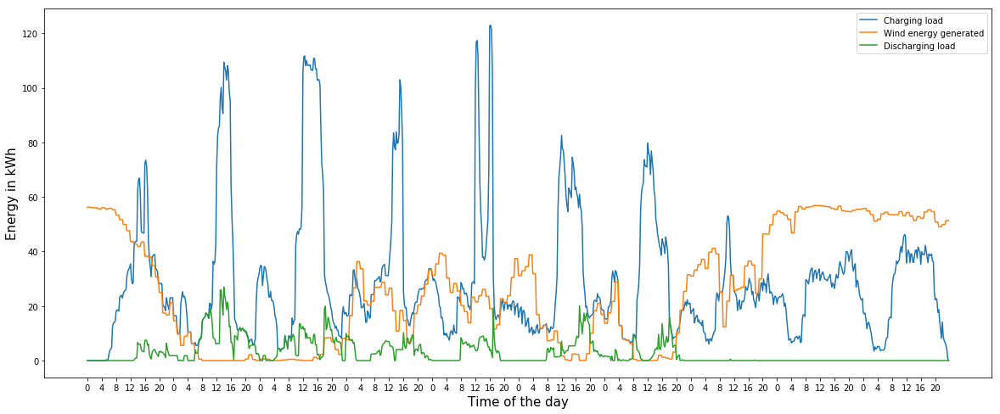

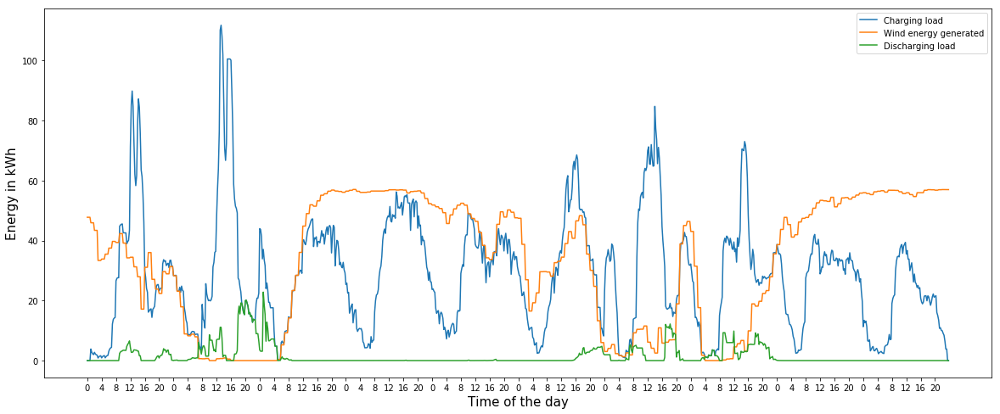

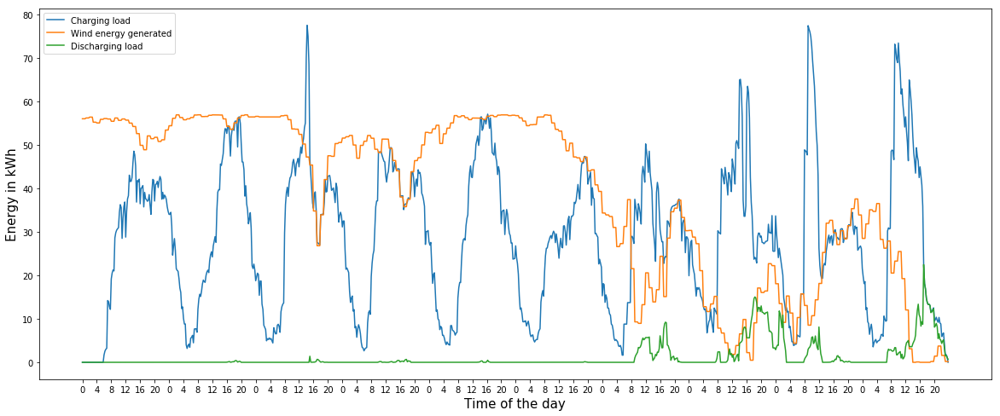

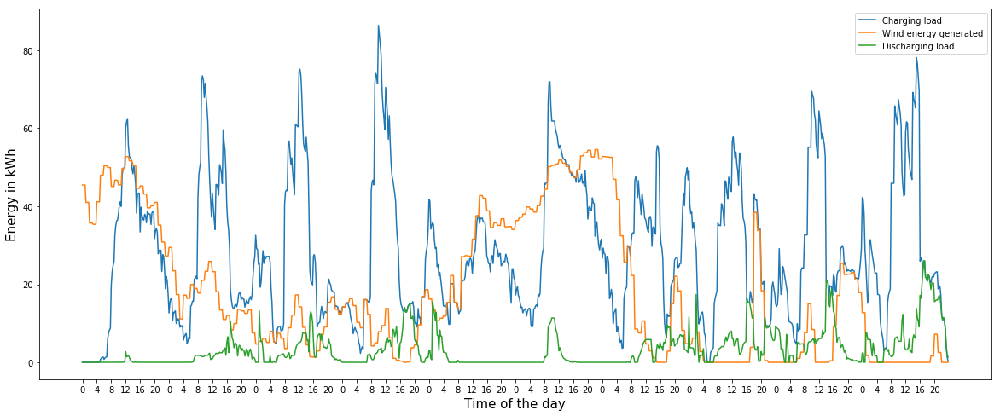

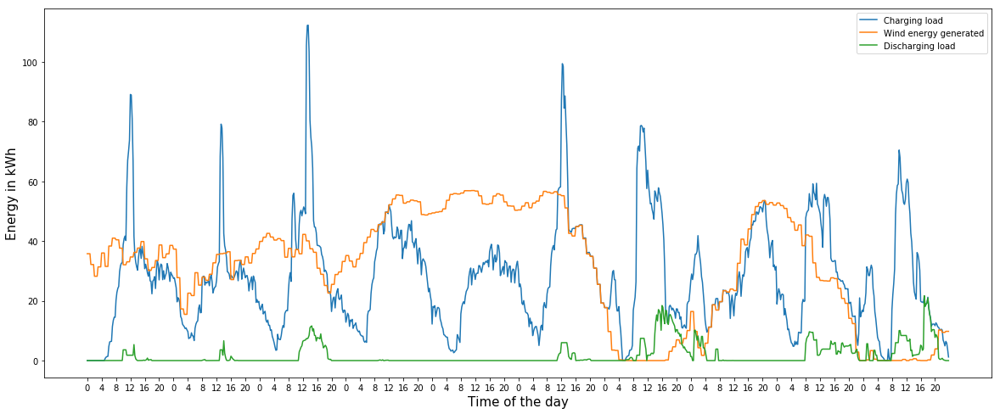

...

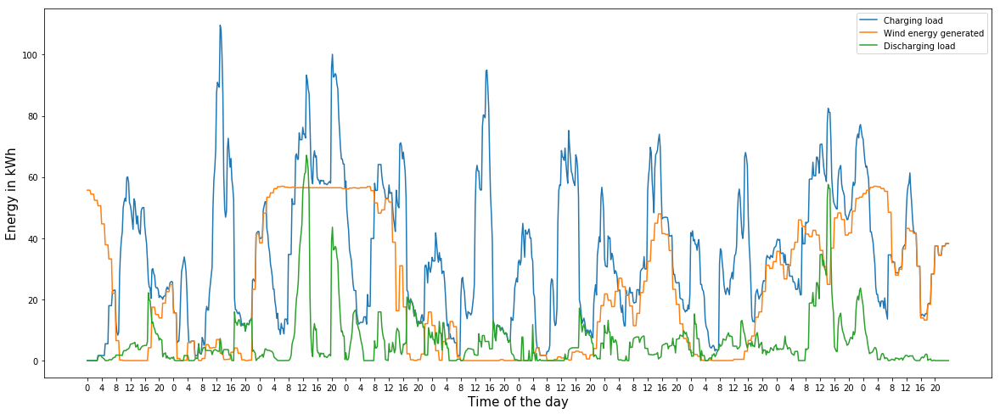

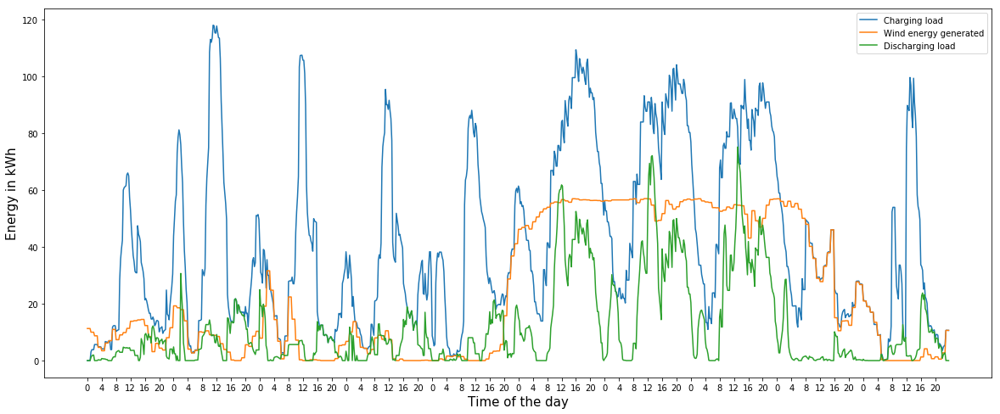

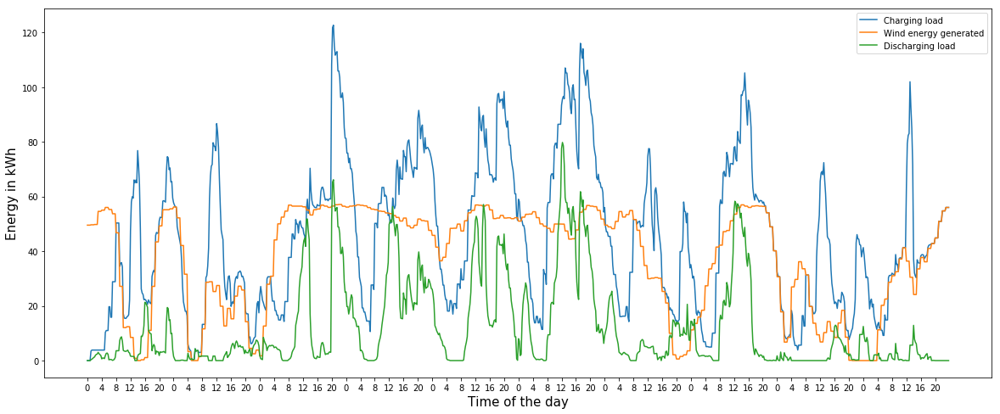

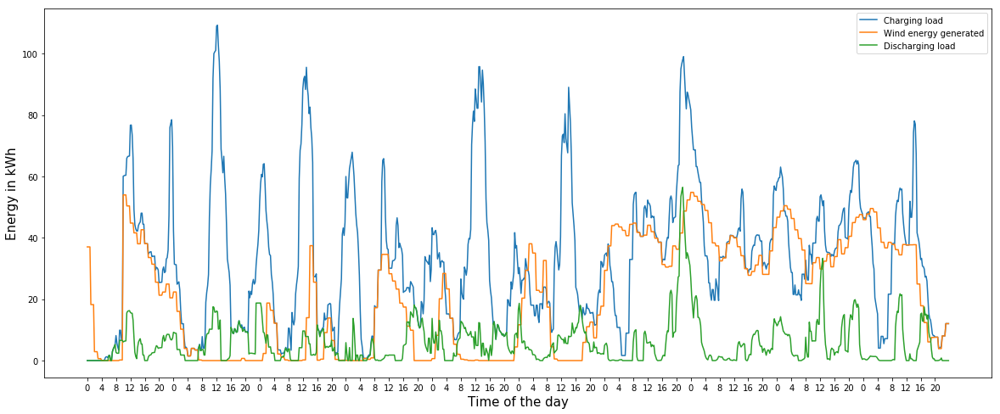

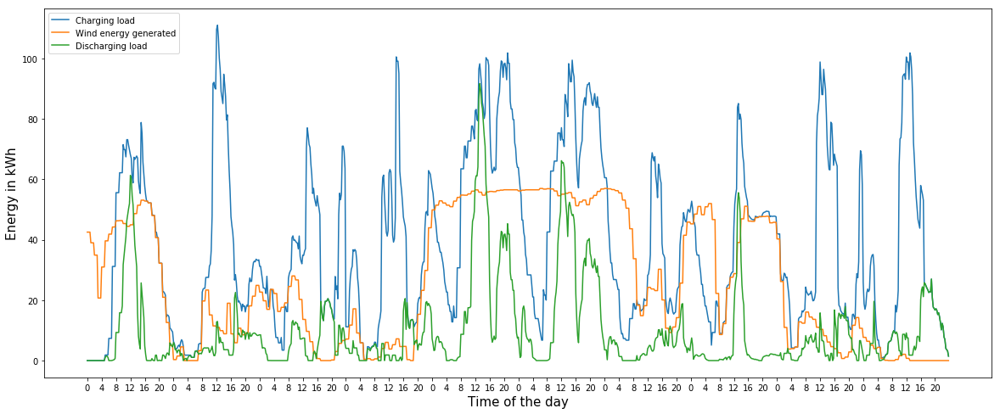

In [3]:
l=1
for delta in [0.0, 0.25, 0.5, 0.75, 1]:
    simulate_dynamic(S=10,low_Td=4, max_Td=12, eta_v=0.9, delta=delta, delta1=1, delta2=0, delta3=1, NumberOfDays=10, eta_DC_v=0.9,
                        Day_of_Month=15, p=1, Trans_P = 100, timelim =1000)
    l+=1

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5219

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4431

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4813

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4983

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5117

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5598

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5029

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4134

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2179

Solving problem at TIME 0_146
NumVar and NumConstr = 12

NumVar and NumConstr = 4433, 5447

Solving problem at TIME 1_20
NumVar and NumConstr = 3702, 4571

Solving problem at TIME 1_21
NumVar and NumConstr = 4025, 4957

Solving problem at TIME 1_22
NumVar and NumConstr = 3352, 4127

Solving problem at TIME 1_23
NumVar and NumConstr = 2916, 3600

Solving problem at TIME 1_24
NumVar and NumConstr = 2572, 3177

Solving problem at TIME 1_25
NumVar and NumConstr = 1872, 2322

Solving problem at TIME 1_26
NumVar and NumConstr = 1288, 1608

Solving problem at TIME 1_27
NumVar and NumConstr = 847, 1062

Solving problem at TIME 1_28
NumVar and NumConstr = 769, 969

Solving problem at TIME 1_29
NumVar and NumConstr = 643, 810

Solving problem at TIME 1_30
NumVar and NumConstr = 728, 909

Solving problem at TIME 1_31
NumVar and NumConstr = 1816, 2235

Solving problem at TIME 1_32
NumVar and NumConstr = 3677, 4508

Solving problem at TIME 1_33
NumVar and NumConstr = 4800, 5894

Solving problem at TIME 1_34
NumVar and NumConstr = 5364, 6567

Solving prob

NumVar and NumConstr = 5979, 7297

Solving problem at TIME 2_38
NumVar and NumConstr = 6804, 8304

Solving problem at TIME 2_39
NumVar and NumConstr = 7022, 8596

Solving problem at TIME 2_40
NumVar and NumConstr = 6463, 7945

Solving problem at TIME 2_41
NumVar and NumConstr = 6146, 7576

Solving problem at TIME 2_42
NumVar and NumConstr = 5864, 7242

Solving problem at TIME 2_43
NumVar and NumConstr = 5689, 7007

Solving problem at TIME 2_44
NumVar and NumConstr = 4746, 5847

Solving problem at TIME 2_45
NumVar and NumConstr = 3949, 4862

Solving problem at TIME 2_46
NumVar and NumConstr = 3068, 3783

Solving problem at TIME 2_47
NumVar and NumConstr = 2239, 2763

Solving problem at TIME 2_48
NumVar and NumConstr = 1867, 2313

Solving problem at TIME 2_49
NumVar and NumConstr = 1336, 1668

Solving problem at TIME 2_50
NumVar and NumConstr = 876, 1101

Solving problem at TIME 2_51
NumVar and NumConstr = 582, 735

Solving problem at TIME 2_52
NumVar and NumConstr = 377, 483

Solving pr

NumVar and NumConstr = 4152, 5127

Solving problem at TIME 2_166
NumVar and NumConstr = 3454, 4262

Solving problem at TIME 2_167
NumVar and NumConstr = 2908, 3594

Solving problem at TIME 2_168
NumVar and NumConstr = 2326, 2873

Solving problem at TIME 2_169
NumVar and NumConstr = 1698, 2104

Solving problem at TIME 2_170
NumVar and NumConstr = 1449, 1797

Solving problem at TIME 2_171
NumVar and NumConstr = 1070, 1338

Solving problem at TIME 2_172
NumVar and NumConstr = 742, 933

Solving problem at TIME 2_173
NumVar and NumConstr = 490, 621

Solving problem at TIME 2_174
NumVar and NumConstr = 561, 705

Solving problem at TIME 2_175
NumVar and NumConstr = 817, 1017

Solving problem at TIME 2_176
NumVar and NumConstr = 2200, 2698

Solving problem at TIME 2_177
NumVar and NumConstr = 3024, 3697

Solving problem at TIME 2_178
NumVar and NumConstr = 3216, 3935

Solving problem at TIME 2_179
NumVar and NumConstr = 3914, 4788

Solving problem at TIME 2_180
NumVar and NumConstr = 4271, 522

NumVar and NumConstr = 2889, 3564

Solving problem at TIME 3_57
NumVar and NumConstr = 3595, 4414

Solving problem at TIME 3_58
NumVar and NumConstr = 3828, 4696

Solving problem at TIME 3_59
NumVar and NumConstr = 4444, 5482

Solving problem at TIME 3_60
NumVar and NumConstr = 4351, 5362

Solving problem at TIME 3_61
NumVar and NumConstr = 4158, 5124

Solving problem at TIME 3_62
NumVar and NumConstr = 3398, 4193

Solving problem at TIME 3_63
NumVar and NumConstr = 2997, 3695

Solving problem at TIME 3_64
NumVar and NumConstr = 2799, 3450

Solving problem at TIME 3_65
NumVar and NumConstr = 2745, 3372

Solving problem at TIME 3_66
NumVar and NumConstr = 2830, 3480

Solving problem at TIME 3_67
NumVar and NumConstr = 2502, 3076

Solving problem at TIME 3_68
NumVar and NumConstr = 2678, 3306

Solving problem at TIME 3_69
NumVar and NumConstr = 2522, 3112

Solving problem at TIME 3_70
NumVar and NumConstr = 2114, 2616

Solving problem at TIME 3_71
NumVar and NumConstr = 1804, 2234

Solvi

NumVar and NumConstr = 4616, 5697

Solving problem at TIME 3_185
NumVar and NumConstr = 4324, 5334

Solving problem at TIME 3_186
NumVar and NumConstr = 3913, 4818

Solving problem at TIME 3_187
NumVar and NumConstr = 3478, 4278

Solving problem at TIME 3_188
NumVar and NumConstr = 3111, 3855

Solving problem at TIME 3_189
NumVar and NumConstr = 3334, 4158

Solving problem at TIME 3_190
NumVar and NumConstr = 2593, 3238

Solving problem at TIME 3_191
NumVar and NumConstr = 1989, 2496

Solving problem at TIME 3_192
NumVar and NumConstr = 1497, 1880

Solving problem at TIME 3_193
NumVar and NumConstr = 1049, 1348

Solving problem at TIME 3_194
NumVar and NumConstr = 703, 899

Solving problem at TIME 3_195
NumVar and NumConstr = 441, 566

Solving problem at TIME 3_196
NumVar and NumConstr = 269, 345

Solving problem at TIME 3_197
NumVar and NumConstr = 401, 516

Solving problem at TIME 3_198
NumVar and NumConstr = 1149, 1460

Solving problem at TIME 3_199
NumVar and NumConstr = 1657, 2082


Solving problem at TIME 4_77
NumVar and NumConstr = 473, 600

Solving problem at TIME 4_78
NumVar and NumConstr = 1152, 1442

Solving problem at TIME 4_79
NumVar and NumConstr = 2483, 3071

Solving problem at TIME 4_80
NumVar and NumConstr = 3391, 4170

Solving problem at TIME 4_81
NumVar and NumConstr = 4051, 4969

Solving problem at TIME 4_82
NumVar and NumConstr = 3739, 4587

Solving problem at TIME 4_83
NumVar and NumConstr = 3652, 4521

Solving problem at TIME 4_84
NumVar and NumConstr = 3933, 4858

Solving problem at TIME 4_85
NumVar and NumConstr = 3323, 4104

Solving problem at TIME 4_86
NumVar and NumConstr = 3420, 4212

Solving problem at TIME 4_87
NumVar and NumConstr = 3330, 4145

Solving problem at TIME 4_88
NumVar and NumConstr = 3698, 4595

Solving problem at TIME 4_89
NumVar and NumConstr = 4581, 5647

Solving problem at TIME 4_90
NumVar and NumConstr = 4231, 5209

Solving problem at TIME 4_91
NumVar and NumConstr = 3952, 4860

Solving problem at TIME 4_92
NumVar and N

NumVar and NumConstr = 3815, 4695

Solving problem at TIME 4_205
NumVar and NumConstr = 4454, 5471

Solving problem at TIME 4_206
NumVar and NumConstr = 4442, 5451

Solving problem at TIME 4_207
NumVar and NumConstr = 3878, 4790

Solving problem at TIME 4_208
NumVar and NumConstr = 3748, 4627

Solving problem at TIME 4_209
NumVar and NumConstr = 3529, 4359

Solving problem at TIME 4_210
NumVar and NumConstr = 3716, 4594

Solving problem at TIME 4_211
NumVar and NumConstr = 4115, 5067

Solving problem at TIME 4_212
NumVar and NumConstr = 3893, 4791

Solving problem at TIME 4_213
NumVar and NumConstr = 3462, 4262

Solving problem at TIME 4_214
NumVar and NumConstr = 2768, 3412

Solving problem at TIME 4_215
NumVar and NumConstr = 2247, 2788

Solving problem at TIME 4_216
NumVar and NumConstr = 1749, 2186

Solving problem at TIME 4_217
NumVar and NumConstr = 1290, 1623

Solving problem at TIME 4_218
NumVar and NumConstr = 883, 1120

Solving problem at TIME 4_219
NumVar and NumConstr = 535

NumVar and NumConstr = 3028, 3753

Solving problem at TIME 5_95
NumVar and NumConstr = 2465, 3054

Solving problem at TIME 5_96
NumVar and NumConstr = 1863, 2328

Solving problem at TIME 5_97
NumVar and NumConstr = 1326, 1674

Solving problem at TIME 5_98
NumVar and NumConstr = 897, 1133

Solving problem at TIME 5_99
NumVar and NumConstr = 551, 702

Solving problem at TIME 5_100
NumVar and NumConstr = 263, 339

Solving problem at TIME 5_101
NumVar and NumConstr = 229, 304

Solving problem at TIME 5_102
NumVar and NumConstr = 597, 750

Solving problem at TIME 5_103
NumVar and NumConstr = 1476, 1813

Solving problem at TIME 5_104
NumVar and NumConstr = 2495, 3067

Solving problem at TIME 5_105
NumVar and NumConstr = 3776, 4644

Solving problem at TIME 5_106
NumVar and NumConstr = 4215, 5167

Solving problem at TIME 5_107
NumVar and NumConstr = 4014, 4931

Solving problem at TIME 5_108
NumVar and NumConstr = 4577, 5616

Solving problem at TIME 5_109
NumVar and NumConstr = 4944, 6051

Solv

NumVar and NumConstr = 837, 1047

Solving problem at TIME 5_223
NumVar and NumConstr = 2248, 2759

Solving problem at TIME 5_224
NumVar and NumConstr = 3640, 4441

Solving problem at TIME 5_225
NumVar and NumConstr = 4720, 5757

Solving problem at TIME 5_226
NumVar and NumConstr = 4778, 5829

Solving problem at TIME 5_227
NumVar and NumConstr = 4108, 5042

Solving problem at TIME 5_228
NumVar and NumConstr = 4587, 5630

Solving problem at TIME 5_229
NumVar and NumConstr = 4148, 5094

Solving problem at TIME 5_230
NumVar and NumConstr = 4593, 5633

Solving problem at TIME 5_231
NumVar and NumConstr = 3766, 4627

Solving problem at TIME 5_232
NumVar and NumConstr = 3506, 4307

Solving problem at TIME 5_233
NumVar and NumConstr = 3842, 4716

Solving problem at TIME 5_234
NumVar and NumConstr = 3802, 4669

Solving problem at TIME 5_235
NumVar and NumConstr = 3071, 3773

Solving problem at TIME 5_236
NumVar and NumConstr = 2736, 3374

Solving problem at TIME 5_237
NumVar and NumConstr = 201

NumVar and NumConstr = 4220, 5192

Solving problem at TIME 6_112
NumVar and NumConstr = 4680, 5768

Solving problem at TIME 6_113
NumVar and NumConstr = 5599, 6887

Solving problem at TIME 6_114
NumVar and NumConstr = 5435, 6686

Solving problem at TIME 6_115
NumVar and NumConstr = 5429, 6679

Solving problem at TIME 6_116
NumVar and NumConstr = 4509, 5540

Solving problem at TIME 6_117
NumVar and NumConstr = 3652, 4491

Solving problem at TIME 6_118
NumVar and NumConstr = 3445, 4238

Solving problem at TIME 6_119
NumVar and NumConstr = 3041, 3745

Solving problem at TIME 6_120
NumVar and NumConstr = 2316, 2860

Solving problem at TIME 6_121
NumVar and NumConstr = 2018, 2495

Solving problem at TIME 6_122
NumVar and NumConstr = 1510, 1869

Solving problem at TIME 6_123
NumVar and NumConstr = 1108, 1377

Solving problem at TIME 6_124
NumVar and NumConstr = 786, 981

Solving problem at TIME 6_125
NumVar and NumConstr = 549, 687

Solving problem at TIME 6_126
NumVar and NumConstr = 581, 7

NumVar and NumConstr = 1234, 1545

Solving problem at TIME 6_239
NumVar and NumConstr = 646, 838
17829.809352308195 12107.96902964241 10676.227771513131

Solving problem at TIME 7_1
NumVar and NumConstr = 155, 201

Solving problem at TIME 7_2
NumVar and NumConstr = 127, 165

Solving problem at TIME 7_3
NumVar and NumConstr = 99, 129

Solving problem at TIME 7_4
NumVar and NumConstr = 71, 93

Solving problem at TIME 7_5
NumVar and NumConstr = 637, 798

Solving problem at TIME 7_6
NumVar and NumConstr = 1054, 1336

Solving problem at TIME 7_7
NumVar and NumConstr = 1807, 2241

Solving problem at TIME 7_8
NumVar and NumConstr = 3536, 4354

Solving problem at TIME 7_9
NumVar and NumConstr = 4671, 5722

Solving problem at TIME 7_10
NumVar and NumConstr = 4276, 5232

Solving problem at TIME 7_11
NumVar and NumConstr = 4470, 5474

Solving problem at TIME 7_12
NumVar and NumConstr = 3898, 4783

Solving problem at TIME 7_13
NumVar and NumConstr = 4557, 5584

Solving problem at TIME 7_14
NumVar 

NumVar and NumConstr = 2184, 2677

Solving problem at TIME 7_128
NumVar and NumConstr = 4149, 5057

Solving problem at TIME 7_129
NumVar and NumConstr = 4230, 5161

Solving problem at TIME 7_130
NumVar and NumConstr = 4763, 5810

Solving problem at TIME 7_131
NumVar and NumConstr = 4784, 5843

Solving problem at TIME 7_132
NumVar and NumConstr = 4779, 5844

Solving problem at TIME 7_133
NumVar and NumConstr = 5159, 6344

Solving problem at TIME 7_134
NumVar and NumConstr = 4861, 6001

Solving problem at TIME 7_135
NumVar and NumConstr = 4925, 6070

Solving problem at TIME 7_136
NumVar and NumConstr = 4908, 6036

Solving problem at TIME 7_137
NumVar and NumConstr = 4810, 5916

Solving problem at TIME 7_138
NumVar and NumConstr = 4781, 5929

Solving problem at TIME 7_139
NumVar and NumConstr = 4290, 5316

Solving problem at TIME 7_140
NumVar and NumConstr = 3967, 4908

Solving problem at TIME 7_141
NumVar and NumConstr = 3082, 3818

Solving problem at TIME 7_142
NumVar and NumConstr = 29

NumVar and NumConstr = 4590, 5642

Solving problem at TIME 8_18
NumVar and NumConstr = 4180, 5138

Solving problem at TIME 8_19
NumVar and NumConstr = 4064, 5018

Solving problem at TIME 8_20
NumVar and NumConstr = 3664, 4524

Solving problem at TIME 8_21
NumVar and NumConstr = 3886, 4826

Solving problem at TIME 8_22
NumVar and NumConstr = 3424, 4273

Solving problem at TIME 8_23
NumVar and NumConstr = 2531, 3175

Solving problem at TIME 8_24
NumVar and NumConstr = 1774, 2230

Solving problem at TIME 8_25
NumVar and NumConstr = 1206, 1516

Solving problem at TIME 8_26
NumVar and NumConstr = 798, 1006

Solving problem at TIME 8_27
NumVar and NumConstr = 501, 636

Solving problem at TIME 8_28
NumVar and NumConstr = 299, 384

Solving problem at TIME 8_29
NumVar and NumConstr = 171, 219

Solving problem at TIME 8_30
NumVar and NumConstr = 363, 465

Solving problem at TIME 8_31
NumVar and NumConstr = 1225, 1530

Solving problem at TIME 8_32
NumVar and NumConstr = 3418, 4186

Solving proble

NumVar and NumConstr = 4442, 5481

Solving problem at TIME 9_36
NumVar and NumConstr = 5310, 6527

Solving problem at TIME 9_37
NumVar and NumConstr = 5518, 6785

Solving problem at TIME 9_38
NumVar and NumConstr = 4990, 6136

Solving problem at TIME 9_39
NumVar and NumConstr = 5032, 6180

Solving problem at TIME 9_40
NumVar and NumConstr = 5620, 6887

Solving problem at TIME 9_41
NumVar and NumConstr = 5647, 6913

Solving problem at TIME 9_42
NumVar and NumConstr = 5091, 6232

Solving problem at TIME 9_43
NumVar and NumConstr = 5207, 6397

Solving problem at TIME 9_44
NumVar and NumConstr = 5024, 6187

Solving problem at TIME 9_45
NumVar and NumConstr = 4464, 5520

Solving problem at TIME 9_46
NumVar and NumConstr = 3799, 4718

Solving problem at TIME 9_47
NumVar and NumConstr = 3007, 3742

Solving problem at TIME 9_48
NumVar and NumConstr = 2192, 2733

Solving problem at TIME 9_49
NumVar and NumConstr = 1486, 1857

Solving problem at TIME 9_50
NumVar and NumConstr = 948, 1200

Solvin

NumVar and NumConstr = 4088, 5031

Solving problem at TIME 9_164
NumVar and NumConstr = 4062, 4990

Solving problem at TIME 9_165
NumVar and NumConstr = 3688, 4533

Solving problem at TIME 9_166
NumVar and NumConstr = 3018, 3720

Solving problem at TIME 9_167
NumVar and NumConstr = 2215, 2736

Solving problem at TIME 9_168
NumVar and NumConstr = 1614, 1998

Solving problem at TIME 9_169
NumVar and NumConstr = 1152, 1434

Solving problem at TIME 9_170
NumVar and NumConstr = 789, 987

Solving problem at TIME 9_171
NumVar and NumConstr = 502, 633

Solving problem at TIME 9_172
NumVar and NumConstr = 281, 360

Solving problem at TIME 9_173
NumVar and NumConstr = 343, 441

Solving problem at TIME 9_174
NumVar and NumConstr = 761, 949

Solving problem at TIME 9_175
NumVar and NumConstr = 1541, 1898

Solving problem at TIME 9_176
NumVar and NumConstr = 2541, 3110

Solving problem at TIME 9_177
NumVar and NumConstr = 3402, 4155

Solving problem at TIME 9_178
NumVar and NumConstr = 4044, 4959



C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5204

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4444

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4824

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4990

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5120

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5597

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5024

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4135

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2171

Solving problem at TIME 0_146
NumVar and NumConstr = 12

NumVar and NumConstr = 4433, 5445

Solving problem at TIME 1_20
NumVar and NumConstr = 3702, 4569

Solving problem at TIME 1_21
NumVar and NumConstr = 4025, 4954

Solving problem at TIME 1_22
NumVar and NumConstr = 3352, 4126

Solving problem at TIME 1_23
NumVar and NumConstr = 2916, 3599

Solving problem at TIME 1_24
NumVar and NumConstr = 2572, 3177

Solving problem at TIME 1_25
NumVar and NumConstr = 1872, 2322

Solving problem at TIME 1_26
NumVar and NumConstr = 1288, 1608

Solving problem at TIME 1_27
NumVar and NumConstr = 847, 1062

Solving problem at TIME 1_28
NumVar and NumConstr = 769, 969

Solving problem at TIME 1_29
NumVar and NumConstr = 643, 810

Solving problem at TIME 1_30
NumVar and NumConstr = 728, 909

Solving problem at TIME 1_31
NumVar and NumConstr = 1816, 2235

Solving problem at TIME 1_32
NumVar and NumConstr = 3677, 4510

Solving problem at TIME 1_33
NumVar and NumConstr = 4800, 5874

Solving problem at TIME 1_34
NumVar and NumConstr = 5364, 6558

Solving prob

NumVar and NumConstr = 436, 552

Solving problem at TIME 1_149
NumVar and NumConstr = 295, 375

Solving problem at TIME 1_150
NumVar and NumConstr = 733, 917

Solving problem at TIME 1_151
NumVar and NumConstr = 1804, 2232

Solving problem at TIME 1_152
NumVar and NumConstr = 3721, 4572

Solving problem at TIME 1_153
NumVar and NumConstr = 4740, 5800

Solving problem at TIME 1_154
NumVar and NumConstr = 4997, 6107

Solving problem at TIME 1_155
NumVar and NumConstr = 5348, 6536

Solving problem at TIME 1_156
NumVar and NumConstr = 5198, 6361

Solving problem at TIME 1_157
NumVar and NumConstr = 4762, 5830

Solving problem at TIME 1_158
NumVar and NumConstr = 4604, 5643

Solving problem at TIME 1_159
NumVar and NumConstr = 5212, 6379

Solving problem at TIME 1_160
NumVar and NumConstr = 4722, 5785

Solving problem at TIME 1_161
NumVar and NumConstr = 5186, 6354

Solving problem at TIME 1_162
NumVar and NumConstr = 5409, 6643

Solving problem at TIME 1_163
NumVar and NumConstr = 4686, 57


Solving problem at TIME 2_39
NumVar and NumConstr = 7022, 8596

Solving problem at TIME 2_40
NumVar and NumConstr = 6463, 7944

Solving problem at TIME 2_41
NumVar and NumConstr = 6146, 7574

Solving problem at TIME 2_42
NumVar and NumConstr = 5864, 7240

Solving problem at TIME 2_43
NumVar and NumConstr = 5689, 7005

Solving problem at TIME 2_44
NumVar and NumConstr = 4746, 5847

Solving problem at TIME 2_45
NumVar and NumConstr = 3949, 4862

Solving problem at TIME 2_46
NumVar and NumConstr = 3068, 3783

Solving problem at TIME 2_47
NumVar and NumConstr = 2239, 2763

Solving problem at TIME 2_48
NumVar and NumConstr = 1867, 2313

Solving problem at TIME 2_49
NumVar and NumConstr = 1336, 1668

Solving problem at TIME 2_50
NumVar and NumConstr = 876, 1101

Solving problem at TIME 2_51
NumVar and NumConstr = 582, 735

Solving problem at TIME 2_52
NumVar and NumConstr = 377, 483

Solving problem at TIME 2_53
NumVar and NumConstr = 296, 394

Solving problem at TIME 2_54
NumVar and NumCon

NumVar and NumConstr = 2908, 3593

Solving problem at TIME 2_168
NumVar and NumConstr = 2326, 2872

Solving problem at TIME 2_169
NumVar and NumConstr = 1698, 2103

Solving problem at TIME 2_170
NumVar and NumConstr = 1449, 1797

Solving problem at TIME 2_171
NumVar and NumConstr = 1070, 1338

Solving problem at TIME 2_172
NumVar and NumConstr = 742, 933

Solving problem at TIME 2_173
NumVar and NumConstr = 490, 621

Solving problem at TIME 2_174
NumVar and NumConstr = 561, 705

Solving problem at TIME 2_175
NumVar and NumConstr = 817, 1017

Solving problem at TIME 2_176
NumVar and NumConstr = 2200, 2698

Solving problem at TIME 2_177
NumVar and NumConstr = 3024, 3697

Solving problem at TIME 2_178
NumVar and NumConstr = 3216, 3935

Solving problem at TIME 2_179
NumVar and NumConstr = 3914, 4788

Solving problem at TIME 2_180
NumVar and NumConstr = 4271, 5222

Solving problem at TIME 2_181
NumVar and NumConstr = 5147, 6315

Solving problem at TIME 2_182
NumVar and NumConstr = 5470, 672

NumVar and NumConstr = 3828, 4696

Solving problem at TIME 3_59
NumVar and NumConstr = 4444, 5482

Solving problem at TIME 3_60
NumVar and NumConstr = 4351, 5360

Solving problem at TIME 3_61
NumVar and NumConstr = 4158, 5124

Solving problem at TIME 3_62
NumVar and NumConstr = 3398, 4193

Solving problem at TIME 3_63
NumVar and NumConstr = 2997, 3695

Solving problem at TIME 3_64
NumVar and NumConstr = 2799, 3447

Solving problem at TIME 3_65
NumVar and NumConstr = 2745, 3372

Solving problem at TIME 3_66
NumVar and NumConstr = 2830, 3480

Solving problem at TIME 3_67
NumVar and NumConstr = 2502, 3076

Solving problem at TIME 3_68
NumVar and NumConstr = 2678, 3306

Solving problem at TIME 3_69
NumVar and NumConstr = 2522, 3112

Solving problem at TIME 3_70
NumVar and NumConstr = 2114, 2616

Solving problem at TIME 3_71
NumVar and NumConstr = 1804, 2234

Solving problem at TIME 3_72
NumVar and NumConstr = 1482, 1836

Solving problem at TIME 3_73
NumVar and NumConstr = 1090, 1356

Solvi

Solving problem at TIME 3_186
NumVar and NumConstr = 3913, 4817

Solving problem at TIME 3_187
NumVar and NumConstr = 3478, 4278

Solving problem at TIME 3_188
NumVar and NumConstr = 3111, 3855

Solving problem at TIME 3_189
NumVar and NumConstr = 3334, 4158

Solving problem at TIME 3_190
NumVar and NumConstr = 2593, 3238

Solving problem at TIME 3_191
NumVar and NumConstr = 1989, 2488

Solving problem at TIME 3_192
NumVar and NumConstr = 1497, 1876

Solving problem at TIME 3_193
NumVar and NumConstr = 1049, 1324

Solving problem at TIME 3_194
NumVar and NumConstr = 703, 883

Solving problem at TIME 3_195
NumVar and NumConstr = 441, 561

Solving problem at TIME 3_196
NumVar and NumConstr = 269, 345

Solving problem at TIME 3_197
NumVar and NumConstr = 401, 516

Solving problem at TIME 3_198
NumVar and NumConstr = 1149, 1460

Solving problem at TIME 3_199
NumVar and NumConstr = 1657, 2082

Solving problem at TIME 3_200
NumVar and NumConstr = 2118, 2630

Solving problem at TIME 3_201
Num

NumVar and NumConstr = 422, 531

Solving problem at TIME 4_77
NumVar and NumConstr = 473, 600

Solving problem at TIME 4_78
NumVar and NumConstr = 1152, 1442

Solving problem at TIME 4_79
NumVar and NumConstr = 2483, 3071

Solving problem at TIME 4_80
NumVar and NumConstr = 3391, 4170

Solving problem at TIME 4_81
NumVar and NumConstr = 4051, 4969

Solving problem at TIME 4_82
NumVar and NumConstr = 3739, 4586

Solving problem at TIME 4_83
NumVar and NumConstr = 3652, 4518

Solving problem at TIME 4_84
NumVar and NumConstr = 3933, 4858

Solving problem at TIME 4_85
NumVar and NumConstr = 3323, 4104

Solving problem at TIME 4_86
NumVar and NumConstr = 3420, 4212

Solving problem at TIME 4_87
NumVar and NumConstr = 3330, 4144

Solving problem at TIME 4_88
NumVar and NumConstr = 3698, 4594

Solving problem at TIME 4_89
NumVar and NumConstr = 4581, 5647

Solving problem at TIME 4_90
NumVar and NumConstr = 4231, 5208

Solving problem at TIME 4_91
NumVar and NumConstr = 3952, 4860

Solving p

NumVar and NumConstr = 3467, 4256

Solving problem at TIME 4_204
NumVar and NumConstr = 3815, 4695

Solving problem at TIME 4_205
NumVar and NumConstr = 4454, 5471

Solving problem at TIME 4_206
NumVar and NumConstr = 4442, 5451

Solving problem at TIME 4_207
NumVar and NumConstr = 3878, 4790

Solving problem at TIME 4_208
NumVar and NumConstr = 3748, 4627

Solving problem at TIME 4_209
NumVar and NumConstr = 3529, 4359

Solving problem at TIME 4_210
NumVar and NumConstr = 3716, 4594

Solving problem at TIME 4_211
NumVar and NumConstr = 4115, 5067

Solving problem at TIME 4_212
NumVar and NumConstr = 3893, 4791

Solving problem at TIME 4_213
NumVar and NumConstr = 3462, 4262

Solving problem at TIME 4_214
NumVar and NumConstr = 2768, 3412

Solving problem at TIME 4_215
NumVar and NumConstr = 2247, 2769

Solving problem at TIME 4_216
NumVar and NumConstr = 1749, 2171

Solving problem at TIME 4_217
NumVar and NumConstr = 1290, 1619

Solving problem at TIME 4_218
NumVar and NumConstr = 88

Solving problem at TIME 5_93
NumVar and NumConstr = 3864, 4758

Solving problem at TIME 5_94
NumVar and NumConstr = 3028, 3733

Solving problem at TIME 5_95
NumVar and NumConstr = 2465, 3046

Solving problem at TIME 5_96
NumVar and NumConstr = 1863, 2308

Solving problem at TIME 5_97
NumVar and NumConstr = 1326, 1649

Solving problem at TIME 5_98
NumVar and NumConstr = 897, 1124

Solving problem at TIME 5_99
NumVar and NumConstr = 551, 701

Solving problem at TIME 5_100
NumVar and NumConstr = 263, 341

Solving problem at TIME 5_101
NumVar and NumConstr = 229, 297

Solving problem at TIME 5_102
NumVar and NumConstr = 597, 750

Solving problem at TIME 5_103
NumVar and NumConstr = 1476, 1813

Solving problem at TIME 5_104
NumVar and NumConstr = 2495, 3067

Solving problem at TIME 5_105
NumVar and NumConstr = 3776, 4644

Solving problem at TIME 5_106
NumVar and NumConstr = 4215, 5167

Solving problem at TIME 5_107
NumVar and NumConstr = 4014, 4918

Solving problem at TIME 5_108
NumVar and 

Solving problem at TIME 5_220
NumVar and NumConstr = 568, 714

Solving problem at TIME 5_221
NumVar and NumConstr = 563, 714

Solving problem at TIME 5_222
NumVar and NumConstr = 837, 1047

Solving problem at TIME 5_223
NumVar and NumConstr = 2248, 2759

Solving problem at TIME 5_224
NumVar and NumConstr = 3640, 4441

Solving problem at TIME 5_225
NumVar and NumConstr = 4720, 5757

Solving problem at TIME 5_226
NumVar and NumConstr = 4778, 5829

Solving problem at TIME 5_227
NumVar and NumConstr = 4108, 5042

Solving problem at TIME 5_228
NumVar and NumConstr = 4587, 5629

Solving problem at TIME 5_229
NumVar and NumConstr = 4148, 5093

Solving problem at TIME 5_230
NumVar and NumConstr = 4593, 5633

Solving problem at TIME 5_231
NumVar and NumConstr = 3766, 4626

Solving problem at TIME 5_232
NumVar and NumConstr = 3506, 4306

Solving problem at TIME 5_233
NumVar and NumConstr = 3842, 4713

Solving problem at TIME 5_234
NumVar and NumConstr = 3802, 4667

Solving problem at TIME 5_235


NumVar and NumConstr = 4863, 5950

Solving problem at TIME 6_110
NumVar and NumConstr = 4500, 5511

Solving problem at TIME 6_111
NumVar and NumConstr = 4220, 5192

Solving problem at TIME 6_112
NumVar and NumConstr = 4680, 5768

Solving problem at TIME 6_113
NumVar and NumConstr = 5599, 6887

Solving problem at TIME 6_114
NumVar and NumConstr = 5435, 6686

Solving problem at TIME 6_115
NumVar and NumConstr = 5429, 6679

Solving problem at TIME 6_116
NumVar and NumConstr = 4509, 5539

Solving problem at TIME 6_117
NumVar and NumConstr = 3652, 4491

Solving problem at TIME 6_118
NumVar and NumConstr = 3445, 4238

Solving problem at TIME 6_119
NumVar and NumConstr = 3041, 3744

Solving problem at TIME 6_120
NumVar and NumConstr = 2316, 2859

Solving problem at TIME 6_121
NumVar and NumConstr = 2018, 2490

Solving problem at TIME 6_122
NumVar and NumConstr = 1510, 1869

Solving problem at TIME 6_123
NumVar and NumConstr = 1108, 1377

Solving problem at TIME 6_124
NumVar and NumConstr = 78

NumVar and NumConstr = 2656, 3276

Solving problem at TIME 6_237
NumVar and NumConstr = 1866, 2313

Solving problem at TIME 6_238
NumVar and NumConstr = 1234, 1545

Solving problem at TIME 6_239
NumVar and NumConstr = 646, 838
17825.054111430276 10993.364071060623 11325.119553179587

Solving problem at TIME 7_1
NumVar and NumConstr = 155, 201

Solving problem at TIME 7_2
NumVar and NumConstr = 127, 165

Solving problem at TIME 7_3
NumVar and NumConstr = 99, 129

Solving problem at TIME 7_4
NumVar and NumConstr = 71, 93

Solving problem at TIME 7_5
NumVar and NumConstr = 637, 798

Solving problem at TIME 7_6
NumVar and NumConstr = 1054, 1336

Solving problem at TIME 7_7
NumVar and NumConstr = 1807, 2241

Solving problem at TIME 7_8
NumVar and NumConstr = 3536, 4354

Solving problem at TIME 7_9
NumVar and NumConstr = 4671, 5722

Solving problem at TIME 7_10
NumVar and NumConstr = 4276, 5232

Solving problem at TIME 7_11
NumVar and NumConstr = 4470, 5474

Solving problem at TIME 7_12
NumV

NumVar and NumConstr = 592, 747

Solving problem at TIME 7_127
NumVar and NumConstr = 2184, 2677

Solving problem at TIME 7_128
NumVar and NumConstr = 4149, 5057

Solving problem at TIME 7_129
NumVar and NumConstr = 4230, 5161

Solving problem at TIME 7_130
NumVar and NumConstr = 4763, 5809

Solving problem at TIME 7_131
NumVar and NumConstr = 4784, 5842

Solving problem at TIME 7_132
NumVar and NumConstr = 4779, 5844

Solving problem at TIME 7_133
NumVar and NumConstr = 5159, 6344

Solving problem at TIME 7_134
NumVar and NumConstr = 4861, 6000

Solving problem at TIME 7_135
NumVar and NumConstr = 4925, 6067

Solving problem at TIME 7_136
NumVar and NumConstr = 4908, 6035

Solving problem at TIME 7_137
NumVar and NumConstr = 4810, 5915

Solving problem at TIME 7_138
NumVar and NumConstr = 4781, 5929

Solving problem at TIME 7_139
NumVar and NumConstr = 4290, 5316

Solving problem at TIME 7_140
NumVar and NumConstr = 3967, 4909

Solving problem at TIME 7_141
NumVar and NumConstr = 3082

NumVar and NumConstr = 4578, 5604

Solving problem at TIME 8_17
NumVar and NumConstr = 4590, 5642

Solving problem at TIME 8_18
NumVar and NumConstr = 4180, 5138

Solving problem at TIME 8_19
NumVar and NumConstr = 4064, 5018

Solving problem at TIME 8_20
NumVar and NumConstr = 3664, 4524

Solving problem at TIME 8_21
NumVar and NumConstr = 3886, 4826

Solving problem at TIME 8_22
NumVar and NumConstr = 3424, 4273

Solving problem at TIME 8_23
NumVar and NumConstr = 2531, 3173

Solving problem at TIME 8_24
NumVar and NumConstr = 1774, 2230

Solving problem at TIME 8_25
NumVar and NumConstr = 1206, 1514

Solving problem at TIME 8_26
NumVar and NumConstr = 798, 1006

Solving problem at TIME 8_27
NumVar and NumConstr = 501, 636

Solving problem at TIME 8_28
NumVar and NumConstr = 299, 384

Solving problem at TIME 8_29
NumVar and NumConstr = 171, 219

Solving problem at TIME 8_30
NumVar and NumConstr = 363, 465

Solving problem at TIME 8_31
NumVar and NumConstr = 1225, 1530

Solving proble


Solving problem at TIME 8_145
NumVar and NumConstr = 666, 882

Solving problem at TIME 8_146
NumVar and NumConstr = 372, 491

Solving problem at TIME 8_147
NumVar and NumConstr = 180, 237

Solving problem at TIME 8_148
NumVar and NumConstr = 321, 419

Solving problem at TIME 8_149
NumVar and NumConstr = 239, 309

Solving problem at TIME 8_150
NumVar and NumConstr = 628, 787

Solving problem at TIME 8_151
NumVar and NumConstr = 2584, 3159

Solving problem at TIME 8_152
NumVar and NumConstr = 3814, 4669

Solving problem at TIME 8_153
NumVar and NumConstr = 5213, 6362

Solving problem at TIME 8_154
NumVar and NumConstr = 4980, 6081

Solving problem at TIME 8_155
NumVar and NumConstr = 5928, 7265

Solving problem at TIME 8_156
NumVar and NumConstr = 5979, 7322

Solving problem at TIME 8_157
NumVar and NumConstr = 5824, 7129

Solving problem at TIME 8_158
NumVar and NumConstr = 4993, 6123

Solving problem at TIME 8_159
NumVar and NumConstr = 4672, 5730

Solving problem at TIME 8_160
NumVar

NumVar and NumConstr = 4442, 5471

Solving problem at TIME 9_36
NumVar and NumConstr = 5310, 6525

Solving problem at TIME 9_37
NumVar and NumConstr = 5518, 6783

Solving problem at TIME 9_38
NumVar and NumConstr = 4990, 6136

Solving problem at TIME 9_39
NumVar and NumConstr = 5032, 6180

Solving problem at TIME 9_40
NumVar and NumConstr = 5620, 6887

Solving problem at TIME 9_41
NumVar and NumConstr = 5647, 6913

Solving problem at TIME 9_42
NumVar and NumConstr = 5091, 6232

Solving problem at TIME 9_43
NumVar and NumConstr = 5207, 6391

Solving problem at TIME 9_44
NumVar and NumConstr = 5024, 6184

Solving problem at TIME 9_45
NumVar and NumConstr = 4464, 5520

Solving problem at TIME 9_46
NumVar and NumConstr = 3799, 4717

Solving problem at TIME 9_47
NumVar and NumConstr = 3007, 3741

Solving problem at TIME 9_48
NumVar and NumConstr = 2192, 2732

Solving problem at TIME 9_49
NumVar and NumConstr = 1486, 1857

Solving problem at TIME 9_50
NumVar and NumConstr = 948, 1194

Solvin

C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5204

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4444

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4824

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4990

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5120

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5597

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5024

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4135

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2171

Solving problem at TIME 0_146
NumVar and NumConstr = 12

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


18742.343573986607 6420.555873569932 10423.020984725059

Solving problem at TIME 1_1
NumVar and NumConstr = 281, 364

Solving problem at TIME 1_2
NumVar and NumConstr = 253, 327

Solving problem at TIME 1_3
NumVar and NumConstr = 225, 291

Solving problem at TIME 1_4
NumVar and NumConstr = 197, 255

Solving problem at TIME 1_5
NumVar and NumConstr = 169, 219

Solving problem at TIME 1_6
NumVar and NumConstr = 577, 724

Solving problem at TIME 1_7
NumVar and NumConstr = 1500, 1841

Solving problem at TIME 1_8
NumVar and NumConstr = 2861, 3529

Solving problem at TIME 1_9
NumVar and NumConstr = 4602, 5630

Solving problem at TIME 1_10
NumVar and NumConstr = 5610, 6850

Solving problem at TIME 1_11
NumVar and NumConstr = 6100, 7471

Solving problem at TIME 1_12
NumVar and NumConstr = 5675, 6951

Solving problem at TIME 1_13
NumVar and NumConstr = 5499, 6735

Solving problem at TIME 1_14
NumVar and NumConstr = 5412, 6630

Solving problem at TIME 1_15
NumVar and NumConstr = 5086, 6226

Solv

Solving problem at TIME 1_129
NumVar and NumConstr = 4486, 5466

Solving problem at TIME 1_130
NumVar and NumConstr = 4480, 5460

Solving problem at TIME 1_131
NumVar and NumConstr = 4739, 5780

Solving problem at TIME 1_132
NumVar and NumConstr = 4655, 5703

Solving problem at TIME 1_133
NumVar and NumConstr = 5266, 6450

Solving problem at TIME 1_134
NumVar and NumConstr = 4600, 5646

Solving problem at TIME 1_135
NumVar and NumConstr = 4073, 5014

Solving problem at TIME 1_136
NumVar and NumConstr = 4429, 5447

Solving problem at TIME 1_137
NumVar and NumConstr = 4218, 5187

Solving problem at TIME 1_138
NumVar and NumConstr = 5163, 6350

Solving problem at TIME 1_139
NumVar and NumConstr = 4793, 5892

Solving problem at TIME 1_140
NumVar and NumConstr = 4383, 5413

Solving problem at TIME 1_141
NumVar and NumConstr = 3772, 4662

Solving problem at TIME 1_142
NumVar and NumConstr = 3155, 3905

Solving problem at TIME 1_143
NumVar and NumConstr = 2597, 3215

Solving problem at TIME 1


Solving problem at TIME 2_19
NumVar and NumConstr = 4551, 5570

Solving problem at TIME 2_20
NumVar and NumConstr = 4184, 5127

Solving problem at TIME 2_21
NumVar and NumConstr = 3850, 4725

Solving problem at TIME 2_22
NumVar and NumConstr = 3335, 4102

Solving problem at TIME 2_23
NumVar and NumConstr = 2612, 3222

Solving problem at TIME 2_24
NumVar and NumConstr = 2229, 2755

Solving problem at TIME 2_25
NumVar and NumConstr = 1622, 2016

Solving problem at TIME 2_26
NumVar and NumConstr = 1109, 1389

Solving problem at TIME 2_27
NumVar and NumConstr = 715, 903

Solving problem at TIME 2_28
NumVar and NumConstr = 430, 546

Solving problem at TIME 2_29
NumVar and NumConstr = 268, 342

Solving problem at TIME 2_30
NumVar and NumConstr = 861, 1072

Solving problem at TIME 2_31
NumVar and NumConstr = 1596, 1964

Solving problem at TIME 2_32
NumVar and NumConstr = 3215, 3923

Solving problem at TIME 2_33
NumVar and NumConstr = 3918, 4776

Solving problem at TIME 2_34
NumVar and NumCon

NumVar and NumConstr = 898, 1113

Solving problem at TIME 2_151
NumVar and NumConstr = 1178, 1452

Solving problem at TIME 2_152
NumVar and NumConstr = 2086, 2558

Solving problem at TIME 2_153
NumVar and NumConstr = 2875, 3529

Solving problem at TIME 2_154
NumVar and NumConstr = 2886, 3559

Solving problem at TIME 2_155
NumVar and NumConstr = 3206, 3952

Solving problem at TIME 2_156
NumVar and NumConstr = 3321, 4086

Solving problem at TIME 2_157
NumVar and NumConstr = 3288, 4039

Solving problem at TIME 2_158
NumVar and NumConstr = 3198, 3928

Solving problem at TIME 2_159
NumVar and NumConstr = 4191, 5139

Solving problem at TIME 2_160
NumVar and NumConstr = 5408, 6638

Solving problem at TIME 2_161
NumVar and NumConstr = 5514, 6791

Solving problem at TIME 2_162
NumVar and NumConstr = 5315, 6538

Solving problem at TIME 2_163
NumVar and NumConstr = 4898, 6023

Solving problem at TIME 2_164
NumVar and NumConstr = 4462, 5508

Solving problem at TIME 2_165
NumVar and NumConstr = 415

NumVar and NumConstr = 4658, 5709

Solving problem at TIME 3_41
NumVar and NumConstr = 4373, 5359

Solving problem at TIME 3_42
NumVar and NumConstr = 4201, 5148

Solving problem at TIME 3_43
NumVar and NumConstr = 4166, 5110

Solving problem at TIME 3_44
NumVar and NumConstr = 3972, 4873

Solving problem at TIME 3_45
NumVar and NumConstr = 3891, 4772

Solving problem at TIME 3_46
NumVar and NumConstr = 3418, 4201

Solving problem at TIME 3_47
NumVar and NumConstr = 2862, 3519

Solving problem at TIME 3_48
NumVar and NumConstr = 2210, 2727

Solving problem at TIME 3_49
NumVar and NumConstr = 1666, 2073

Solving problem at TIME 3_50
NumVar and NumConstr = 1248, 1548

Solving problem at TIME 3_51
NumVar and NumConstr = 926, 1152

Solving problem at TIME 3_52
NumVar and NumConstr = 638, 805

Solving problem at TIME 3_53
NumVar and NumConstr = 395, 501

Solving problem at TIME 3_54
NumVar and NumConstr = 900, 1142

Solving problem at TIME 3_55
NumVar and NumConstr = 1305, 1617

Solving pro

NumVar and NumConstr = 1358, 1751

Solving problem at TIME 3_169
NumVar and NumConstr = 890, 1148

Solving problem at TIME 3_170
NumVar and NumConstr = 923, 1170

Solving problem at TIME 3_171
NumVar and NumConstr = 663, 838

Solving problem at TIME 3_172
NumVar and NumConstr = 474, 602

Solving problem at TIME 3_173
NumVar and NumConstr = 338, 429

Solving problem at TIME 3_174
NumVar and NumConstr = 760, 952

Solving problem at TIME 3_175
NumVar and NumConstr = 1712, 2121

Solving problem at TIME 3_176
NumVar and NumConstr = 2339, 2890

Solving problem at TIME 3_177
NumVar and NumConstr = 2433, 3012

Solving problem at TIME 3_178
NumVar and NumConstr = 3503, 4336

Solving problem at TIME 3_179
NumVar and NumConstr = 3803, 4683

Solving problem at TIME 3_180
NumVar and NumConstr = 4786, 5857

Solving problem at TIME 3_181
NumVar and NumConstr = 5183, 6382

Solving problem at TIME 3_182
NumVar and NumConstr = 4583, 5661

Solving problem at TIME 3_183
NumVar and NumConstr = 4771, 5884



NumVar and NumConstr = 4515, 5514

Solving problem at TIME 4_59
NumVar and NumConstr = 4478, 5525

Solving problem at TIME 4_60
NumVar and NumConstr = 4561, 5644

Solving problem at TIME 4_61
NumVar and NumConstr = 5355, 6634

Solving problem at TIME 4_62
NumVar and NumConstr = 4976, 6150

Solving problem at TIME 4_63
NumVar and NumConstr = 4498, 5543

Solving problem at TIME 4_64
NumVar and NumConstr = 4678, 5761

Solving problem at TIME 4_65
NumVar and NumConstr = 4466, 5492

Solving problem at TIME 4_66
NumVar and NumConstr = 3907, 4818

Solving problem at TIME 4_67
NumVar and NumConstr = 3230, 3984

Solving problem at TIME 4_68
NumVar and NumConstr = 3094, 3812

Solving problem at TIME 4_69
NumVar and NumConstr = 3105, 3821

Solving problem at TIME 4_70
NumVar and NumConstr = 2818, 3471

Solving problem at TIME 4_71
NumVar and NumConstr = 2178, 2688

Solving problem at TIME 4_72
NumVar and NumConstr = 1673, 2067

Solving problem at TIME 4_73
NumVar and NumConstr = 1281, 1587

Solvi


Solving problem at TIME 4_186
NumVar and NumConstr = 4977, 6116

Solving problem at TIME 4_187
NumVar and NumConstr = 4976, 6113

Solving problem at TIME 4_188
NumVar and NumConstr = 4723, 5817

Solving problem at TIME 4_189
NumVar and NumConstr = 3929, 4846

Solving problem at TIME 4_190
NumVar and NumConstr = 3089, 3815

Solving problem at TIME 4_191
NumVar and NumConstr = 2668, 3303

Solving problem at TIME 4_192
NumVar and NumConstr = 1964, 2429

Solving problem at TIME 4_193
NumVar and NumConstr = 1403, 1746

Solving problem at TIME 4_194
NumVar and NumConstr = 899, 1128

Solving problem at TIME 4_195
NumVar and NumConstr = 539, 681

Solving problem at TIME 4_196
NumVar and NumConstr = 301, 384

Solving problem at TIME 4_197
NumVar and NumConstr = 424, 546

Solving problem at TIME 4_198
NumVar and NumConstr = 585, 735

Solving problem at TIME 4_199
NumVar and NumConstr = 1399, 1738

Solving problem at TIME 4_200
NumVar and NumConstr = 3205, 3965

Solving problem at TIME 4_201
Num

NumVar and NumConstr = 477, 603

Solving problem at TIME 5_76
NumVar and NumConstr = 372, 471

Solving problem at TIME 5_77
NumVar and NumConstr = 529, 669

Solving problem at TIME 5_78
NumVar and NumConstr = 1084, 1338

Solving problem at TIME 5_79
NumVar and NumConstr = 2502, 3059

Solving problem at TIME 5_80
NumVar and NumConstr = 3336, 4077

Solving problem at TIME 5_81
NumVar and NumConstr = 3452, 4222

Solving problem at TIME 5_82
NumVar and NumConstr = 4167, 5094

Solving problem at TIME 5_83
NumVar and NumConstr = 4210, 5154

Solving problem at TIME 5_84
NumVar and NumConstr = 4413, 5402

Solving problem at TIME 5_85
NumVar and NumConstr = 3887, 4787

Solving problem at TIME 5_86
NumVar and NumConstr = 4722, 5809

Solving problem at TIME 5_87
NumVar and NumConstr = 4827, 5946

Solving problem at TIME 5_88
NumVar and NumConstr = 4418, 5457

Solving problem at TIME 5_89
NumVar and NumConstr = 4045, 4996

Solving problem at TIME 5_90
NumVar and NumConstr = 4405, 5430

Solving pro

NumVar and NumConstr = 3108, 3822

Solving problem at TIME 5_203
NumVar and NumConstr = 3191, 3916

Solving problem at TIME 5_204
NumVar and NumConstr = 3159, 3874

Solving problem at TIME 5_205
NumVar and NumConstr = 3610, 4423

Solving problem at TIME 5_206
NumVar and NumConstr = 3484, 4272

Solving problem at TIME 5_207
NumVar and NumConstr = 3666, 4517

Solving problem at TIME 5_208
NumVar and NumConstr = 3980, 4898

Solving problem at TIME 5_209
NumVar and NumConstr = 4967, 6085

Solving problem at TIME 5_210
NumVar and NumConstr = 4814, 5920

Solving problem at TIME 5_211
NumVar and NumConstr = 4621, 5679

Solving problem at TIME 5_212
NumVar and NumConstr = 4623, 5672

Solving problem at TIME 5_213
NumVar and NumConstr = 4213, 5169

Solving problem at TIME 5_214
NumVar and NumConstr = 3459, 4248

Solving problem at TIME 5_215
NumVar and NumConstr = 3226, 3966

Solving problem at TIME 5_216
NumVar and NumConstr = 2454, 3030

Solving problem at TIME 5_217
NumVar and NumConstr = 18

Solving problem at TIME 6_91
NumVar and NumConstr = 3854, 4756

Solving problem at TIME 6_92
NumVar and NumConstr = 3153, 3890

Solving problem at TIME 6_93
NumVar and NumConstr = 2616, 3228

Solving problem at TIME 6_94
NumVar and NumConstr = 2494, 3084

Solving problem at TIME 6_95
NumVar and NumConstr = 2181, 2684

Solving problem at TIME 6_96
NumVar and NumConstr = 1852, 2280

Solving problem at TIME 6_97
NumVar and NumConstr = 1432, 1770

Solving problem at TIME 6_98
NumVar and NumConstr = 1061, 1317

Solving problem at TIME 6_99
NumVar and NumConstr = 878, 1099

Solving problem at TIME 6_100
NumVar and NumConstr = 586, 738

Solving problem at TIME 6_101
NumVar and NumConstr = 359, 456

Solving problem at TIME 6_102
NumVar and NumConstr = 1169, 1447

Solving problem at TIME 6_103
NumVar and NumConstr = 1949, 2392

Solving problem at TIME 6_104
NumVar and NumConstr = 3344, 4086

Solving problem at TIME 6_105
NumVar and NumConstr = 4532, 5529

Solving problem at TIME 6_106
NumVar an

NumVar and NumConstr = 484, 612

Solving problem at TIME 6_220
NumVar and NumConstr = 355, 453

Solving problem at TIME 6_221
NumVar and NumConstr = 482, 613

Solving problem at TIME 6_222
NumVar and NumConstr = 597, 747

Solving problem at TIME 6_223
NumVar and NumConstr = 2210, 2749

Solving problem at TIME 6_224
NumVar and NumConstr = 3995, 4904

Solving problem at TIME 6_225
NumVar and NumConstr = 4092, 5019

Solving problem at TIME 6_226
NumVar and NumConstr = 5103, 6244

Solving problem at TIME 6_227
NumVar and NumConstr = 4746, 5812

Solving problem at TIME 6_228
NumVar and NumConstr = 4981, 6098

Solving problem at TIME 6_229
NumVar and NumConstr = 4775, 5850

Solving problem at TIME 6_230
NumVar and NumConstr = 5041, 6195

Solving problem at TIME 6_231
NumVar and NumConstr = 4295, 5282

Solving problem at TIME 6_232
NumVar and NumConstr = 4373, 5373

Solving problem at TIME 6_233
NumVar and NumConstr = 4323, 5311

Solving problem at TIME 6_234
NumVar and NumConstr = 3993, 4897

NumVar and NumConstr = 3472, 4284

Solving problem at TIME 7_109
NumVar and NumConstr = 5116, 6290

Solving problem at TIME 7_110
NumVar and NumConstr = 4508, 5540

Solving problem at TIME 7_111
NumVar and NumConstr = 4783, 5866

Solving problem at TIME 7_112
NumVar and NumConstr = 4482, 5498

Solving problem at TIME 7_113
NumVar and NumConstr = 4078, 5012

Solving problem at TIME 7_114
NumVar and NumConstr = 4543, 5571

Solving problem at TIME 7_115
NumVar and NumConstr = 3884, 4765

Solving problem at TIME 7_116
NumVar and NumConstr = 3756, 4618

Solving problem at TIME 7_117
NumVar and NumConstr = 3264, 4018

Solving problem at TIME 7_118
NumVar and NumConstr = 2653, 3267

Solving problem at TIME 7_119
NumVar and NumConstr = 1993, 2460

Solving problem at TIME 7_120
NumVar and NumConstr = 1813, 2253

Solving problem at TIME 7_121
NumVar and NumConstr = 1330, 1658

Solving problem at TIME 7_122
NumVar and NumConstr = 919, 1153

Solving problem at TIME 7_123
NumVar and NumConstr = 581

NumVar and NumConstr = 3849, 4728

Solving problem at TIME 7_236
NumVar and NumConstr = 3357, 4138

Solving problem at TIME 7_237
NumVar and NumConstr = 2354, 2913

Solving problem at TIME 7_238
NumVar and NumConstr = 1536, 1921

Solving problem at TIME 7_239
NumVar and NumConstr = 787, 1017
27110.41612804717 9931.385526713642 4489.471464195801

Solving problem at TIME 8_1

Solving problem at TIME 8_2

Solving problem at TIME 8_3

Solving problem at TIME 8_4

Solving problem at TIME 8_5
NumVar and NumConstr = 595, 744

Solving problem at TIME 8_6
NumVar and NumConstr = 919, 1138

Solving problem at TIME 8_7
NumVar and NumConstr = 1879, 2302

Solving problem at TIME 8_8
NumVar and NumConstr = 4367, 5338

Solving problem at TIME 8_9
NumVar and NumConstr = 5359, 6572

Solving problem at TIME 8_10
NumVar and NumConstr = 4757, 5835

Solving problem at TIME 8_11
NumVar and NumConstr = 4386, 5429

Solving problem at TIME 8_12
NumVar and NumConstr = 4126, 5108

Solving problem at TIME 8_13
Num

NumVar and NumConstr = 880, 1092

Solving problem at TIME 8_127
NumVar and NumConstr = 1225, 1509

Solving problem at TIME 8_128
NumVar and NumConstr = 2601, 3188

Solving problem at TIME 8_129
NumVar and NumConstr = 3501, 4296

Solving problem at TIME 8_130
NumVar and NumConstr = 4543, 5583

Solving problem at TIME 8_131
NumVar and NumConstr = 3865, 4774

Solving problem at TIME 8_132
NumVar and NumConstr = 3624, 4487

Solving problem at TIME 8_133
NumVar and NumConstr = 4312, 5315

Solving problem at TIME 8_134
NumVar and NumConstr = 4626, 5696

Solving problem at TIME 8_135
NumVar and NumConstr = 4729, 5819

Solving problem at TIME 8_136
NumVar and NumConstr = 3871, 4765

Solving problem at TIME 8_137
NumVar and NumConstr = 3759, 4622

Solving problem at TIME 8_138
NumVar and NumConstr = 4322, 5310

Solving problem at TIME 8_139
NumVar and NumConstr = 3855, 4738

Solving problem at TIME 8_140
NumVar and NumConstr = 3237, 3979

Solving problem at TIME 8_141
NumVar and NumConstr = 273

NumVar and NumConstr = 3234, 3969

Solving problem at TIME 9_17
NumVar and NumConstr = 3484, 4271

Solving problem at TIME 9_18
NumVar and NumConstr = 3449, 4228

Solving problem at TIME 9_19
NumVar and NumConstr = 3239, 3973

Solving problem at TIME 9_20
NumVar and NumConstr = 2559, 3150

Solving problem at TIME 9_21
NumVar and NumConstr = 2294, 2832

Solving problem at TIME 9_22
NumVar and NumConstr = 2145, 2649

Solving problem at TIME 9_23
NumVar and NumConstr = 1630, 2016

Solving problem at TIME 9_24
NumVar and NumConstr = 1234, 1533

Solving problem at TIME 9_25
NumVar and NumConstr = 1137, 1411

Solving problem at TIME 9_26
NumVar and NumConstr = 873, 1089

Solving problem at TIME 9_27
NumVar and NumConstr = 651, 813

Solving problem at TIME 9_28
NumVar and NumConstr = 487, 612

Solving problem at TIME 9_29
NumVar and NumConstr = 346, 435

Solving problem at TIME 9_30
NumVar and NumConstr = 788, 996

Solving problem at TIME 9_31
NumVar and NumConstr = 2185, 2689

Solving proble

NumVar and NumConstr = 1669, 2070

Solving problem at TIME 9_145
NumVar and NumConstr = 1165, 1452

Solving problem at TIME 9_146
NumVar and NumConstr = 827, 1035

Solving problem at TIME 9_147
NumVar and NumConstr = 562, 711

Solving problem at TIME 9_148
NumVar and NumConstr = 327, 423

Solving problem at TIME 9_149
NumVar and NumConstr = 259, 330

Solving problem at TIME 9_150
NumVar and NumConstr = 440, 561

Solving problem at TIME 9_151
NumVar and NumConstr = 810, 1008

Solving problem at TIME 9_152
NumVar and NumConstr = 1174, 1456

Solving problem at TIME 9_153
NumVar and NumConstr = 2099, 2579

Solving problem at TIME 9_154
NumVar and NumConstr = 2821, 3473

Solving problem at TIME 9_155
NumVar and NumConstr = 2883, 3545

Solving problem at TIME 9_156
NumVar and NumConstr = 2827, 3508

Solving problem at TIME 9_157
NumVar and NumConstr = 3631, 4477

Solving problem at TIME 9_158
NumVar and NumConstr = 3616, 4467

Solving problem at TIME 9_159
NumVar and NumConstr = 4435, 5468



C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5204

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4441

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4824

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4990

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5120

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5597

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5024

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4134

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2171

Solving problem at TIME 0_146
NumVar and NumConstr = 12

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


18428.44628303524 5049.603597226077 10578.55475772254

Solving problem at TIME 1_1
NumVar and NumConstr = 281, 364

Solving problem at TIME 1_2
NumVar and NumConstr = 253, 327

Solving problem at TIME 1_3
NumVar and NumConstr = 225, 291

Solving problem at TIME 1_4
NumVar and NumConstr = 197, 255

Solving problem at TIME 1_5
NumVar and NumConstr = 169, 219

Solving problem at TIME 1_6
NumVar and NumConstr = 577, 724

Solving problem at TIME 1_7
NumVar and NumConstr = 1500, 1841

Solving problem at TIME 1_8
NumVar and NumConstr = 2861, 3529

Solving problem at TIME 1_9
NumVar and NumConstr = 4602, 5630

Solving problem at TIME 1_10
NumVar and NumConstr = 5610, 6850

Solving problem at TIME 1_11
NumVar and NumConstr = 6100, 7471

Solving problem at TIME 1_12
NumVar and NumConstr = 5675, 6950

Solving problem at TIME 1_13
NumVar and NumConstr = 5499, 6735

Solving problem at TIME 1_14
NumVar and NumConstr = 5412, 6630

Solving problem at TIME 1_15
NumVar and NumConstr = 5086, 6226

Solvin

NumVar and NumConstr = 4486, 5466

Solving problem at TIME 1_130
NumVar and NumConstr = 4480, 5460

Solving problem at TIME 1_131
NumVar and NumConstr = 4739, 5780

Solving problem at TIME 1_132
NumVar and NumConstr = 4655, 5703

Solving problem at TIME 1_133
NumVar and NumConstr = 5266, 6450

Solving problem at TIME 1_134
NumVar and NumConstr = 4600, 5646

Solving problem at TIME 1_135
NumVar and NumConstr = 4073, 5014

Solving problem at TIME 1_136
NumVar and NumConstr = 4429, 5447

Solving problem at TIME 1_137
NumVar and NumConstr = 4218, 5187

Solving problem at TIME 1_138
NumVar and NumConstr = 5163, 6350

Solving problem at TIME 1_139
NumVar and NumConstr = 4793, 5892

Solving problem at TIME 1_140
NumVar and NumConstr = 4383, 5413

Solving problem at TIME 1_141
NumVar and NumConstr = 3772, 4662

Solving problem at TIME 1_142
NumVar and NumConstr = 3155, 3905

Solving problem at TIME 1_143
NumVar and NumConstr = 2597, 3215

Solving problem at TIME 1_144
NumVar and NumConstr = 20

NumVar and NumConstr = 4551, 5570

Solving problem at TIME 2_20
NumVar and NumConstr = 4184, 5127

Solving problem at TIME 2_21
NumVar and NumConstr = 3850, 4725

Solving problem at TIME 2_22
NumVar and NumConstr = 3335, 4102

Solving problem at TIME 2_23
NumVar and NumConstr = 2612, 3222

Solving problem at TIME 2_24
NumVar and NumConstr = 2229, 2755

Solving problem at TIME 2_25
NumVar and NumConstr = 1622, 2016

Solving problem at TIME 2_26
NumVar and NumConstr = 1109, 1389

Solving problem at TIME 2_27
NumVar and NumConstr = 715, 903

Solving problem at TIME 2_28
NumVar and NumConstr = 430, 546

Solving problem at TIME 2_29
NumVar and NumConstr = 268, 342

Solving problem at TIME 2_30
NumVar and NumConstr = 861, 1072

Solving problem at TIME 2_31
NumVar and NumConstr = 1596, 1964

Solving problem at TIME 2_32
NumVar and NumConstr = 3215, 3923

Solving problem at TIME 2_33
NumVar and NumConstr = 3918, 4776

Solving problem at TIME 2_34
NumVar and NumConstr = 4073, 4965

Solving prob

NumVar and NumConstr = 898, 1113

Solving problem at TIME 2_151
NumVar and NumConstr = 1178, 1452

Solving problem at TIME 2_152
NumVar and NumConstr = 2086, 2558

Solving problem at TIME 2_153
NumVar and NumConstr = 2875, 3529

Solving problem at TIME 2_154
NumVar and NumConstr = 2886, 3559

Solving problem at TIME 2_155
NumVar and NumConstr = 3206, 3952

Solving problem at TIME 2_156
NumVar and NumConstr = 3321, 4086

Solving problem at TIME 2_157
NumVar and NumConstr = 3288, 4039

Solving problem at TIME 2_158
NumVar and NumConstr = 3198, 3928

Solving problem at TIME 2_159
NumVar and NumConstr = 4191, 5139

Solving problem at TIME 2_160
NumVar and NumConstr = 5408, 6638

Solving problem at TIME 2_161
NumVar and NumConstr = 5514, 6791

Solving problem at TIME 2_162
NumVar and NumConstr = 5315, 6538

Solving problem at TIME 2_163
NumVar and NumConstr = 4898, 6023

Solving problem at TIME 2_164
NumVar and NumConstr = 4462, 5508

Solving problem at TIME 2_165
NumVar and NumConstr = 415

NumVar and NumConstr = 4658, 5709

Solving problem at TIME 3_41
NumVar and NumConstr = 4373, 5359

Solving problem at TIME 3_42
NumVar and NumConstr = 4201, 5148

Solving problem at TIME 3_43
NumVar and NumConstr = 4166, 5110

Solving problem at TIME 3_44
NumVar and NumConstr = 3972, 4873

Solving problem at TIME 3_45
NumVar and NumConstr = 3891, 4772

Solving problem at TIME 3_46
NumVar and NumConstr = 3418, 4201

Solving problem at TIME 3_47
NumVar and NumConstr = 2862, 3519

Solving problem at TIME 3_48
NumVar and NumConstr = 2210, 2727

Solving problem at TIME 3_49
NumVar and NumConstr = 1666, 2073

Solving problem at TIME 3_50
NumVar and NumConstr = 1248, 1550

Solving problem at TIME 3_51
NumVar and NumConstr = 926, 1152

Solving problem at TIME 3_52
NumVar and NumConstr = 638, 805

Solving problem at TIME 3_53
NumVar and NumConstr = 395, 501

Solving problem at TIME 3_54
NumVar and NumConstr = 900, 1142

Solving problem at TIME 3_55
NumVar and NumConstr = 1305, 1617

Solving pro

NumVar and NumConstr = 1358, 1702

Solving problem at TIME 3_169
NumVar and NumConstr = 890, 1120

Solving problem at TIME 3_170
NumVar and NumConstr = 923, 1163

Solving problem at TIME 3_171
NumVar and NumConstr = 663, 834

Solving problem at TIME 3_172
NumVar and NumConstr = 474, 600

Solving problem at TIME 3_173
NumVar and NumConstr = 338, 429

Solving problem at TIME 3_174
NumVar and NumConstr = 760, 952

Solving problem at TIME 3_175
NumVar and NumConstr = 1712, 2121

Solving problem at TIME 3_176
NumVar and NumConstr = 2339, 2890

Solving problem at TIME 3_177
NumVar and NumConstr = 2433, 3012

Solving problem at TIME 3_178
NumVar and NumConstr = 3503, 4336

Solving problem at TIME 3_179
NumVar and NumConstr = 3803, 4683

Solving problem at TIME 3_180
NumVar and NumConstr = 4786, 5857

Solving problem at TIME 3_181
NumVar and NumConstr = 5183, 6382

Solving problem at TIME 3_182
NumVar and NumConstr = 4583, 5661

Solving problem at TIME 3_183
NumVar and NumConstr = 4771, 5884



NumVar and NumConstr = 4515, 5514

Solving problem at TIME 4_59
NumVar and NumConstr = 4478, 5525

Solving problem at TIME 4_60
NumVar and NumConstr = 4561, 5644

Solving problem at TIME 4_61
NumVar and NumConstr = 5355, 6634

Solving problem at TIME 4_62
NumVar and NumConstr = 4976, 6150

Solving problem at TIME 4_63
NumVar and NumConstr = 4498, 5543

Solving problem at TIME 4_64
NumVar and NumConstr = 4678, 5761

Solving problem at TIME 4_65
NumVar and NumConstr = 4466, 5492

Solving problem at TIME 4_66
NumVar and NumConstr = 3907, 4818

Solving problem at TIME 4_67
NumVar and NumConstr = 3230, 3984

Solving problem at TIME 4_68
NumVar and NumConstr = 3094, 3812

Solving problem at TIME 4_69
NumVar and NumConstr = 3105, 3821

Solving problem at TIME 4_70
NumVar and NumConstr = 2818, 3471

Solving problem at TIME 4_71
NumVar and NumConstr = 2178, 2688

Solving problem at TIME 4_72
NumVar and NumConstr = 1673, 2067

Solving problem at TIME 4_73
NumVar and NumConstr = 1281, 1587

Solvi

NumVar and NumConstr = 4977, 6116

Solving problem at TIME 4_187
NumVar and NumConstr = 4976, 6113

Solving problem at TIME 4_188
NumVar and NumConstr = 4723, 5817

Solving problem at TIME 4_189
NumVar and NumConstr = 3929, 4846

Solving problem at TIME 4_190
NumVar and NumConstr = 3089, 3815

Solving problem at TIME 4_191
NumVar and NumConstr = 2668, 3303

Solving problem at TIME 4_192
NumVar and NumConstr = 1964, 2429

Solving problem at TIME 4_193
NumVar and NumConstr = 1403, 1746

Solving problem at TIME 4_194
NumVar and NumConstr = 899, 1128

Solving problem at TIME 4_195
NumVar and NumConstr = 539, 681

Solving problem at TIME 4_196
NumVar and NumConstr = 301, 384

Solving problem at TIME 4_197
NumVar and NumConstr = 424, 546

Solving problem at TIME 4_198
NumVar and NumConstr = 585, 735

Solving problem at TIME 4_199
NumVar and NumConstr = 1399, 1738

Solving problem at TIME 4_200
NumVar and NumConstr = 3205, 3965

Solving problem at TIME 4_201
NumVar and NumConstr = 3613, 4446


Solving problem at TIME 5_77
NumVar and NumConstr = 529, 669

Solving problem at TIME 5_78
NumVar and NumConstr = 1084, 1338

Solving problem at TIME 5_79
NumVar and NumConstr = 2502, 3059

Solving problem at TIME 5_80
NumVar and NumConstr = 3336, 4077

Solving problem at TIME 5_81
NumVar and NumConstr = 3452, 4222

Solving problem at TIME 5_82
NumVar and NumConstr = 4167, 5094

Solving problem at TIME 5_83
NumVar and NumConstr = 4210, 5154

Solving problem at TIME 5_84
NumVar and NumConstr = 4413, 5402

Solving problem at TIME 5_85
NumVar and NumConstr = 3887, 4787

Solving problem at TIME 5_86
NumVar and NumConstr = 4722, 5809

Solving problem at TIME 5_87
NumVar and NumConstr = 4827, 5946

Solving problem at TIME 5_88
NumVar and NumConstr = 4418, 5457

Solving problem at TIME 5_89
NumVar and NumConstr = 4045, 4996

Solving problem at TIME 5_90
NumVar and NumConstr = 4405, 5430

Solving problem at TIME 5_91
NumVar and NumConstr = 4351, 5351

Solving problem at TIME 5_92
NumVar and Nu

NumVar and NumConstr = 3159, 3874

Solving problem at TIME 5_205
NumVar and NumConstr = 3610, 4423

Solving problem at TIME 5_206
NumVar and NumConstr = 3484, 4272

Solving problem at TIME 5_207
NumVar and NumConstr = 3666, 4517

Solving problem at TIME 5_208
NumVar and NumConstr = 3980, 4898

Solving problem at TIME 5_209
NumVar and NumConstr = 4967, 6085

Solving problem at TIME 5_210
NumVar and NumConstr = 4814, 5920

Solving problem at TIME 5_211
NumVar and NumConstr = 4621, 5679

Solving problem at TIME 5_212
NumVar and NumConstr = 4623, 5672

Solving problem at TIME 5_213
NumVar and NumConstr = 4213, 5169

Solving problem at TIME 5_214
NumVar and NumConstr = 3459, 4248

Solving problem at TIME 5_215
NumVar and NumConstr = 3226, 3966

Solving problem at TIME 5_216
NumVar and NumConstr = 2454, 3030

Solving problem at TIME 5_217
NumVar and NumConstr = 1810, 2244

Solving problem at TIME 5_218
NumVar and NumConstr = 1253, 1557

Solving problem at TIME 5_219
NumVar and NumConstr = 85

NumVar and NumConstr = 2616, 3228

Solving problem at TIME 6_94
NumVar and NumConstr = 2494, 3084

Solving problem at TIME 6_95
NumVar and NumConstr = 2181, 2684

Solving problem at TIME 6_96
NumVar and NumConstr = 1852, 2281

Solving problem at TIME 6_97
NumVar and NumConstr = 1432, 1773

Solving problem at TIME 6_98
NumVar and NumConstr = 1061, 1326

Solving problem at TIME 6_99
NumVar and NumConstr = 878, 1099

Solving problem at TIME 6_100
NumVar and NumConstr = 586, 741

Solving problem at TIME 6_101
NumVar and NumConstr = 359, 456

Solving problem at TIME 6_102
NumVar and NumConstr = 1169, 1447

Solving problem at TIME 6_103
NumVar and NumConstr = 1949, 2392

Solving problem at TIME 6_104
NumVar and NumConstr = 3344, 4086

Solving problem at TIME 6_105
NumVar and NumConstr = 4532, 5529

Solving problem at TIME 6_106
NumVar and NumConstr = 4763, 5823

Solving problem at TIME 6_107
NumVar and NumConstr = 4473, 5471

Solving problem at TIME 6_108
NumVar and NumConstr = 3928, 4810

S

NumVar and NumConstr = 597, 747

Solving problem at TIME 6_223
NumVar and NumConstr = 2210, 2749

Solving problem at TIME 6_224
NumVar and NumConstr = 3995, 4904

Solving problem at TIME 6_225
NumVar and NumConstr = 4092, 5019

Solving problem at TIME 6_226
NumVar and NumConstr = 5103, 6244

Solving problem at TIME 6_227
NumVar and NumConstr = 4746, 5812

Solving problem at TIME 6_228
NumVar and NumConstr = 4981, 6098

Solving problem at TIME 6_229
NumVar and NumConstr = 4775, 5850

Solving problem at TIME 6_230
NumVar and NumConstr = 5041, 6195

Solving problem at TIME 6_231
NumVar and NumConstr = 4295, 5282

Solving problem at TIME 6_232
NumVar and NumConstr = 4373, 5373

Solving problem at TIME 6_233
NumVar and NumConstr = 4323, 5311

Solving problem at TIME 6_234
NumVar and NumConstr = 3993, 4897

Solving problem at TIME 6_235
NumVar and NumConstr = 3517, 4318

Solving problem at TIME 6_236
NumVar and NumConstr = 2656, 3276

Solving problem at TIME 6_237
NumVar and NumConstr = 1866

NumVar and NumConstr = 4783, 5866

Solving problem at TIME 7_112
NumVar and NumConstr = 4482, 5497

Solving problem at TIME 7_113
NumVar and NumConstr = 4078, 5012

Solving problem at TIME 7_114
NumVar and NumConstr = 4543, 5571

Solving problem at TIME 7_115
NumVar and NumConstr = 3884, 4765

Solving problem at TIME 7_116
NumVar and NumConstr = 3756, 4618

Solving problem at TIME 7_117
NumVar and NumConstr = 3264, 4018

Solving problem at TIME 7_118
NumVar and NumConstr = 2653, 3267

Solving problem at TIME 7_119
NumVar and NumConstr = 1993, 2460

Solving problem at TIME 7_120
NumVar and NumConstr = 1813, 2253

Solving problem at TIME 7_121
NumVar and NumConstr = 1330, 1658

Solving problem at TIME 7_122
NumVar and NumConstr = 919, 1153

Solving problem at TIME 7_123
NumVar and NumConstr = 581, 732

Solving problem at TIME 7_124
NumVar and NumConstr = 344, 438

Solving problem at TIME 7_125
NumVar and NumConstr = 512, 649

Solving problem at TIME 7_126
NumVar and NumConstr = 592, 747


NumVar and NumConstr = 1536, 1921

Solving problem at TIME 7_239
NumVar and NumConstr = 787, 1019
26727.06767429846 8340.110752672232 4433.910050288871

Solving problem at TIME 8_1

Solving problem at TIME 8_2

Solving problem at TIME 8_3

Solving problem at TIME 8_4

Solving problem at TIME 8_5
NumVar and NumConstr = 595, 744

Solving problem at TIME 8_6
NumVar and NumConstr = 919, 1138

Solving problem at TIME 8_7
NumVar and NumConstr = 1879, 2302

Solving problem at TIME 8_8
NumVar and NumConstr = 4367, 5338

Solving problem at TIME 8_9
NumVar and NumConstr = 5359, 6572

Solving problem at TIME 8_10
NumVar and NumConstr = 4757, 5835

Solving problem at TIME 8_11
NumVar and NumConstr = 4386, 5447

Solving problem at TIME 8_12
NumVar and NumConstr = 4126, 5119

Solving problem at TIME 8_13
NumVar and NumConstr = 3476, 4308

Solving problem at TIME 8_14
NumVar and NumConstr = 3294, 4073

Solving problem at TIME 8_15
NumVar and NumConstr = 3661, 4507

Solving problem at TIME 8_16
NumVar

NumVar and NumConstr = 3501, 4296

Solving problem at TIME 8_130
NumVar and NumConstr = 4543, 5583

Solving problem at TIME 8_131
NumVar and NumConstr = 3865, 4774

Solving problem at TIME 8_132
NumVar and NumConstr = 3624, 4489

Solving problem at TIME 8_133
NumVar and NumConstr = 4312, 5315

Solving problem at TIME 8_134
NumVar and NumConstr = 4626, 5696

Solving problem at TIME 8_135
NumVar and NumConstr = 4729, 5819

Solving problem at TIME 8_136
NumVar and NumConstr = 3871, 4765

Solving problem at TIME 8_137
NumVar and NumConstr = 3759, 4622

Solving problem at TIME 8_138
NumVar and NumConstr = 4322, 5310

Solving problem at TIME 8_139
NumVar and NumConstr = 3855, 4738

Solving problem at TIME 8_140
NumVar and NumConstr = 3237, 3979

Solving problem at TIME 8_141
NumVar and NumConstr = 2735, 3387

Solving problem at TIME 8_142
NumVar and NumConstr = 2151, 2669

Solving problem at TIME 8_143
NumVar and NumConstr = 1552, 1933

Solving problem at TIME 8_144
NumVar and NumConstr = 10

NumVar and NumConstr = 3239, 3973

Solving problem at TIME 9_20
NumVar and NumConstr = 2559, 3150

Solving problem at TIME 9_21
NumVar and NumConstr = 2294, 2832

Solving problem at TIME 9_22
NumVar and NumConstr = 2145, 2649

Solving problem at TIME 9_23
NumVar and NumConstr = 1630, 2016

Solving problem at TIME 9_24
NumVar and NumConstr = 1234, 1533

Solving problem at TIME 9_25
NumVar and NumConstr = 1137, 1411

Solving problem at TIME 9_26
NumVar and NumConstr = 873, 1089

Solving problem at TIME 9_27
NumVar and NumConstr = 651, 813

Solving problem at TIME 9_28
NumVar and NumConstr = 487, 612

Solving problem at TIME 9_29
NumVar and NumConstr = 346, 435

Solving problem at TIME 9_30
NumVar and NumConstr = 788, 996

Solving problem at TIME 9_31
NumVar and NumConstr = 2185, 2689

Solving problem at TIME 9_32
NumVar and NumConstr = 3972, 4879

Solving problem at TIME 9_33
NumVar and NumConstr = 4680, 5735

Solving problem at TIME 9_34
NumVar and NumConstr = 4869, 5996

Solving proble

NumVar and NumConstr = 562, 711

Solving problem at TIME 9_148
NumVar and NumConstr = 327, 423

Solving problem at TIME 9_149
NumVar and NumConstr = 259, 330

Solving problem at TIME 9_150
NumVar and NumConstr = 440, 561

Solving problem at TIME 9_151
NumVar and NumConstr = 810, 1008

Solving problem at TIME 9_152
NumVar and NumConstr = 1174, 1456

Solving problem at TIME 9_153
NumVar and NumConstr = 2099, 2579

Solving problem at TIME 9_154
NumVar and NumConstr = 2821, 3473

Solving problem at TIME 9_155
NumVar and NumConstr = 2883, 3545

Solving problem at TIME 9_156
NumVar and NumConstr = 2827, 3508

Solving problem at TIME 9_157
NumVar and NumConstr = 3631, 4477

Solving problem at TIME 9_158
NumVar and NumConstr = 3616, 4467

Solving problem at TIME 9_159
NumVar and NumConstr = 4435, 5468

Solving problem at TIME 9_160
NumVar and NumConstr = 3780, 4658

Solving problem at TIME 9_161
NumVar and NumConstr = 4001, 4920

Solving problem at TIME 9_162
NumVar and NumConstr = 4315, 5315


C:\tools\Anaconda3\lib\site-packages\pandas\core\frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]



Solving problem at TIME 0_1

Solving problem at TIME 0_2

Solving problem at TIME 0_3

Solving problem at TIME 0_4

Solving problem at TIME 0_5
NumVar and NumConstr = 288, 372

Solving problem at TIME 0_6
NumVar and NumConstr = 750, 930

Solving problem at TIME 0_7
NumVar and NumConstr = 1682, 2082

Solving problem at TIME 0_8
NumVar and NumConstr = 2101, 2591

Solving problem at TIME 0_9
NumVar and NumConstr = 2849, 3503

Solving problem at TIME 0_10
NumVar and NumConstr = 2815, 3477

Solving problem at TIME 0_11
NumVar and NumConstr = 3144, 3916

Solving problem at TIME 0_12
NumVar and NumConstr = 3285, 4073

Solving problem at TIME 0_13
NumVar and NumConstr = 3787, 4683

Solving problem at TIME 0_14
NumVar and NumConstr = 4260, 5241

Solving problem at TIME 0_15
NumVar and NumConstr = 4248, 5216

Solving problem at TIME 0_16
NumVar and NumConstr = 4598, 5649

Solving problem at TIME 0_17
NumVar and NumConstr = 4122, 5068

Solving problem at TIME 0_18
NumVar and NumConstr = 4287, 52

NumVar and NumConstr = 4231, 5204

Solving problem at TIME 0_132
NumVar and NumConstr = 3592, 4441

Solving problem at TIME 0_133
NumVar and NumConstr = 3915, 4824

Solving problem at TIME 0_134
NumVar and NumConstr = 4041, 4990

Solving problem at TIME 0_135
NumVar and NumConstr = 4154, 5120

Solving problem at TIME 0_136
NumVar and NumConstr = 4343, 5345

Solving problem at TIME 0_137
NumVar and NumConstr = 4150, 5115

Solving problem at TIME 0_138
NumVar and NumConstr = 4711, 5789

Solving problem at TIME 0_139
NumVar and NumConstr = 4557, 5597

Solving problem at TIME 0_140
NumVar and NumConstr = 4091, 5024

Solving problem at TIME 0_141
NumVar and NumConstr = 3888, 4775

Solving problem at TIME 0_142
NumVar and NumConstr = 3352, 4134

Solving problem at TIME 0_143
NumVar and NumConstr = 3078, 3794

Solving problem at TIME 0_144
NumVar and NumConstr = 2371, 2931

Solving problem at TIME 0_145
NumVar and NumConstr = 1752, 2171

Solving problem at TIME 0_146
NumVar and NumConstr = 12

C:\tools\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


18220.698967258875 4286.985964199382 10489.348946679875

Solving problem at TIME 1_1
NumVar and NumConstr = 281, 364

Solving problem at TIME 1_2
NumVar and NumConstr = 253, 327

Solving problem at TIME 1_3
NumVar and NumConstr = 225, 291

Solving problem at TIME 1_4
NumVar and NumConstr = 197, 255

Solving problem at TIME 1_5
NumVar and NumConstr = 169, 219

Solving problem at TIME 1_6
NumVar and NumConstr = 577, 724

Solving problem at TIME 1_7
NumVar and NumConstr = 1500, 1841

Solving problem at TIME 1_8
NumVar and NumConstr = 2861, 3529

Solving problem at TIME 1_9
NumVar and NumConstr = 4602, 5630

Solving problem at TIME 1_10
NumVar and NumConstr = 5610, 6850

Solving problem at TIME 1_11
NumVar and NumConstr = 6100, 7471

Solving problem at TIME 1_12
NumVar and NumConstr = 5675, 6950

Solving problem at TIME 1_13
NumVar and NumConstr = 5499, 6735

Solving problem at TIME 1_14
NumVar and NumConstr = 5412, 6630

Solving problem at TIME 1_15
NumVar and NumConstr = 5086, 6226

Solv

NumVar and NumConstr = 4486, 5466

Solving problem at TIME 1_130
NumVar and NumConstr = 4480, 5460

Solving problem at TIME 1_131
NumVar and NumConstr = 4739, 5780

Solving problem at TIME 1_132
NumVar and NumConstr = 4655, 5703

Solving problem at TIME 1_133
NumVar and NumConstr = 5266, 6450

Solving problem at TIME 1_134
NumVar and NumConstr = 4600, 5646

Solving problem at TIME 1_135
NumVar and NumConstr = 4073, 5014

Solving problem at TIME 1_136
NumVar and NumConstr = 4429, 5447

Solving problem at TIME 1_137
NumVar and NumConstr = 4218, 5187

Solving problem at TIME 1_138
NumVar and NumConstr = 5163, 6350

Solving problem at TIME 1_139
NumVar and NumConstr = 4793, 5892

Solving problem at TIME 1_140
NumVar and NumConstr = 4383, 5413

Solving problem at TIME 1_141
NumVar and NumConstr = 3772, 4662

Solving problem at TIME 1_142
NumVar and NumConstr = 3155, 3905

Solving problem at TIME 1_143
NumVar and NumConstr = 2597, 3215

Solving problem at TIME 1_144
NumVar and NumConstr = 20

NumVar and NumConstr = 4551, 5570

Solving problem at TIME 2_20
NumVar and NumConstr = 4184, 5127

Solving problem at TIME 2_21
NumVar and NumConstr = 3850, 4725

Solving problem at TIME 2_22
NumVar and NumConstr = 3335, 4102

Solving problem at TIME 2_23
NumVar and NumConstr = 2612, 3222

Solving problem at TIME 2_24
NumVar and NumConstr = 2229, 2755

Solving problem at TIME 2_25
NumVar and NumConstr = 1622, 2016

Solving problem at TIME 2_26
NumVar and NumConstr = 1109, 1389

Solving problem at TIME 2_27
NumVar and NumConstr = 715, 903

Solving problem at TIME 2_28
NumVar and NumConstr = 430, 546

Solving problem at TIME 2_29
NumVar and NumConstr = 268, 342

Solving problem at TIME 2_30
NumVar and NumConstr = 861, 1072

Solving problem at TIME 2_31
NumVar and NumConstr = 1596, 1964

Solving problem at TIME 2_32
NumVar and NumConstr = 3215, 3923

Solving problem at TIME 2_33
NumVar and NumConstr = 3918, 4776

Solving problem at TIME 2_34
NumVar and NumConstr = 4073, 4965

Solving prob

Solving problem at TIME 2_150
NumVar and NumConstr = 898, 1113

Solving problem at TIME 2_151
NumVar and NumConstr = 1178, 1452

Solving problem at TIME 2_152
NumVar and NumConstr = 2086, 2558

Solving problem at TIME 2_153
NumVar and NumConstr = 2875, 3529

Solving problem at TIME 2_154
NumVar and NumConstr = 2886, 3559

Solving problem at TIME 2_155
NumVar and NumConstr = 3206, 3952

Solving problem at TIME 2_156
NumVar and NumConstr = 3321, 4086

Solving problem at TIME 2_157
NumVar and NumConstr = 3288, 4039

Solving problem at TIME 2_158
NumVar and NumConstr = 3198, 3928

Solving problem at TIME 2_159
NumVar and NumConstr = 4191, 5139

Solving problem at TIME 2_160
NumVar and NumConstr = 5408, 6638

Solving problem at TIME 2_161
NumVar and NumConstr = 5514, 6791

Solving problem at TIME 2_162
NumVar and NumConstr = 5315, 6538

Solving problem at TIME 2_163
NumVar and NumConstr = 4898, 6023

Solving problem at TIME 2_164
NumVar and NumConstr = 4462, 5508

Solving problem at TIME 2_

NumVar and NumConstr = 4658, 5709

Solving problem at TIME 3_41
NumVar and NumConstr = 4373, 5359

Solving problem at TIME 3_42
NumVar and NumConstr = 4201, 5148

Solving problem at TIME 3_43
NumVar and NumConstr = 4166, 5110

Solving problem at TIME 3_44
NumVar and NumConstr = 3972, 4873

Solving problem at TIME 3_45
NumVar and NumConstr = 3891, 4772

Solving problem at TIME 3_46
NumVar and NumConstr = 3418, 4201

Solving problem at TIME 3_47
NumVar and NumConstr = 2862, 3519

Solving problem at TIME 3_48
NumVar and NumConstr = 2210, 2727

Solving problem at TIME 3_49
NumVar and NumConstr = 1666, 2073

Solving problem at TIME 3_50
NumVar and NumConstr = 1248, 1550

Solving problem at TIME 3_51
NumVar and NumConstr = 926, 1156

Solving problem at TIME 3_52
NumVar and NumConstr = 638, 806

Solving problem at TIME 3_53
NumVar and NumConstr = 395, 501

Solving problem at TIME 3_54
NumVar and NumConstr = 900, 1142

Solving problem at TIME 3_55
NumVar and NumConstr = 1305, 1617

Solving pro

NumVar and NumConstr = 1358, 1702

Solving problem at TIME 3_169
NumVar and NumConstr = 890, 1116

Solving problem at TIME 3_170
NumVar and NumConstr = 923, 1163

Solving problem at TIME 3_171
NumVar and NumConstr = 663, 834

Solving problem at TIME 3_172
NumVar and NumConstr = 474, 600

Solving problem at TIME 3_173
NumVar and NumConstr = 338, 429

Solving problem at TIME 3_174
NumVar and NumConstr = 760, 952

Solving problem at TIME 3_175
NumVar and NumConstr = 1712, 2121

Solving problem at TIME 3_176
NumVar and NumConstr = 2339, 2890

Solving problem at TIME 3_177
NumVar and NumConstr = 2433, 3012

Solving problem at TIME 3_178
NumVar and NumConstr = 3503, 4336

Solving problem at TIME 3_179
NumVar and NumConstr = 3803, 4683

Solving problem at TIME 3_180
NumVar and NumConstr = 4786, 5857

Solving problem at TIME 3_181
NumVar and NumConstr = 5183, 6382

Solving problem at TIME 3_182
NumVar and NumConstr = 4583, 5661

Solving problem at TIME 3_183
NumVar and NumConstr = 4771, 5884



NumVar and NumConstr = 4515, 5514

Solving problem at TIME 4_59
NumVar and NumConstr = 4478, 5525

Solving problem at TIME 4_60
NumVar and NumConstr = 4561, 5644

Solving problem at TIME 4_61
NumVar and NumConstr = 5355, 6634

Solving problem at TIME 4_62
NumVar and NumConstr = 4976, 6150

Solving problem at TIME 4_63
NumVar and NumConstr = 4498, 5543

Solving problem at TIME 4_64
NumVar and NumConstr = 4678, 5761

Solving problem at TIME 4_65
NumVar and NumConstr = 4466, 5492

Solving problem at TIME 4_66
NumVar and NumConstr = 3907, 4818

Solving problem at TIME 4_67
NumVar and NumConstr = 3230, 3984

Solving problem at TIME 4_68
NumVar and NumConstr = 3094, 3812

Solving problem at TIME 4_69
NumVar and NumConstr = 3105, 3821

Solving problem at TIME 4_70
NumVar and NumConstr = 2818, 3471

Solving problem at TIME 4_71
NumVar and NumConstr = 2178, 2688

Solving problem at TIME 4_72
NumVar and NumConstr = 1673, 2067

Solving problem at TIME 4_73
NumVar and NumConstr = 1281, 1587

Solvi

NumVar and NumConstr = 4977, 6116

Solving problem at TIME 4_187
NumVar and NumConstr = 4976, 6113

Solving problem at TIME 4_188
NumVar and NumConstr = 4723, 5817

Solving problem at TIME 4_189
NumVar and NumConstr = 3929, 4846

Solving problem at TIME 4_190
NumVar and NumConstr = 3089, 3815

Solving problem at TIME 4_191
NumVar and NumConstr = 2668, 3303

Solving problem at TIME 4_192
NumVar and NumConstr = 1964, 2429

Solving problem at TIME 4_193
NumVar and NumConstr = 1403, 1746

Solving problem at TIME 4_194
NumVar and NumConstr = 899, 1128

Solving problem at TIME 4_195
NumVar and NumConstr = 539, 681

Solving problem at TIME 4_196
NumVar and NumConstr = 301, 384

Solving problem at TIME 4_197
NumVar and NumConstr = 424, 546

Solving problem at TIME 4_198
NumVar and NumConstr = 585, 735

Solving problem at TIME 4_199
NumVar and NumConstr = 1399, 1738

Solving problem at TIME 4_200
NumVar and NumConstr = 3205, 3965

Solving problem at TIME 4_201
NumVar and NumConstr = 3613, 4446


NumVar and NumConstr = 529, 669

Solving problem at TIME 5_78
NumVar and NumConstr = 1084, 1338

Solving problem at TIME 5_79
NumVar and NumConstr = 2502, 3059

Solving problem at TIME 5_80
NumVar and NumConstr = 3336, 4077

Solving problem at TIME 5_81
NumVar and NumConstr = 3452, 4222

Solving problem at TIME 5_82
NumVar and NumConstr = 4167, 5094

Solving problem at TIME 5_83
NumVar and NumConstr = 4210, 5154

Solving problem at TIME 5_84
NumVar and NumConstr = 4413, 5402

Solving problem at TIME 5_85
NumVar and NumConstr = 3887, 4787

Solving problem at TIME 5_86
NumVar and NumConstr = 4722, 5809

Solving problem at TIME 5_87
NumVar and NumConstr = 4827, 5946

Solving problem at TIME 5_88
NumVar and NumConstr = 4418, 5457

Solving problem at TIME 5_89
NumVar and NumConstr = 4045, 4996

Solving problem at TIME 5_90
NumVar and NumConstr = 4405, 5430

Solving problem at TIME 5_91
NumVar and NumConstr = 4351, 5351

Solving problem at TIME 5_92
NumVar and NumConstr = 3888, 4779

Solving

NumVar and NumConstr = 3159, 3874

Solving problem at TIME 5_205
NumVar and NumConstr = 3610, 4423

Solving problem at TIME 5_206
NumVar and NumConstr = 3484, 4272

Solving problem at TIME 5_207
NumVar and NumConstr = 3666, 4517

Solving problem at TIME 5_208
NumVar and NumConstr = 3980, 4898

Solving problem at TIME 5_209
NumVar and NumConstr = 4967, 6085

Solving problem at TIME 5_210
NumVar and NumConstr = 4814, 5920

Solving problem at TIME 5_211
NumVar and NumConstr = 4621, 5679

Solving problem at TIME 5_212
NumVar and NumConstr = 4623, 5672

Solving problem at TIME 5_213
NumVar and NumConstr = 4213, 5169

Solving problem at TIME 5_214
NumVar and NumConstr = 3459, 4248

Solving problem at TIME 5_215
NumVar and NumConstr = 3226, 3966

Solving problem at TIME 5_216
NumVar and NumConstr = 2454, 3030

Solving problem at TIME 5_217
NumVar and NumConstr = 1810, 2244

Solving problem at TIME 5_218
NumVar and NumConstr = 1253, 1557

Solving problem at TIME 5_219
NumVar and NumConstr = 85

NumVar and NumConstr = 2616, 3228

Solving problem at TIME 6_94
NumVar and NumConstr = 2494, 3084

Solving problem at TIME 6_95
NumVar and NumConstr = 2181, 2684

Solving problem at TIME 6_96
NumVar and NumConstr = 1852, 2280

Solving problem at TIME 6_97
NumVar and NumConstr = 1432, 1770

Solving problem at TIME 6_98
NumVar and NumConstr = 1061, 1317

Solving problem at TIME 6_99
NumVar and NumConstr = 878, 1099

Solving problem at TIME 6_100
NumVar and NumConstr = 586, 738

Solving problem at TIME 6_101
NumVar and NumConstr = 359, 456

Solving problem at TIME 6_102
NumVar and NumConstr = 1169, 1447

Solving problem at TIME 6_103
NumVar and NumConstr = 1949, 2392

Solving problem at TIME 6_104
NumVar and NumConstr = 3344, 4086

Solving problem at TIME 6_105
NumVar and NumConstr = 4532, 5529

Solving problem at TIME 6_106
NumVar and NumConstr = 4763, 5835

Solving problem at TIME 6_107
NumVar and NumConstr = 4473, 5479

Solving problem at TIME 6_108
NumVar and NumConstr = 3928, 4810

S

Solving problem at TIME 6_221
NumVar and NumConstr = 482, 613

Solving problem at TIME 6_222
NumVar and NumConstr = 597, 747

Solving problem at TIME 6_223
NumVar and NumConstr = 2210, 2749

Solving problem at TIME 6_224
NumVar and NumConstr = 3995, 4904

Solving problem at TIME 6_225
NumVar and NumConstr = 4092, 5019

Solving problem at TIME 6_226
NumVar and NumConstr = 5103, 6244

Solving problem at TIME 6_227
NumVar and NumConstr = 4746, 5812

Solving problem at TIME 6_228
NumVar and NumConstr = 4981, 6098

Solving problem at TIME 6_229
NumVar and NumConstr = 4775, 5850

Solving problem at TIME 6_230
NumVar and NumConstr = 5041, 6195

Solving problem at TIME 6_231
NumVar and NumConstr = 4295, 5282

Solving problem at TIME 6_232
NumVar and NumConstr = 4373, 5373

Solving problem at TIME 6_233
NumVar and NumConstr = 4323, 5311

Solving problem at TIME 6_234
NumVar and NumConstr = 3993, 4897

Solving problem at TIME 6_235
NumVar and NumConstr = 3517, 4318

Solving problem at TIME 6_236


Solving problem at TIME 7_110
NumVar and NumConstr = 4508, 5540

Solving problem at TIME 7_111
NumVar and NumConstr = 4783, 5866

Solving problem at TIME 7_112
NumVar and NumConstr = 4482, 5496

Solving problem at TIME 7_113
NumVar and NumConstr = 4078, 5012

Solving problem at TIME 7_114
NumVar and NumConstr = 4543, 5571

Solving problem at TIME 7_115
NumVar and NumConstr = 3884, 4765

Solving problem at TIME 7_116
NumVar and NumConstr = 3756, 4618

Solving problem at TIME 7_117
NumVar and NumConstr = 3264, 4018

Solving problem at TIME 7_118
NumVar and NumConstr = 2653, 3267

Solving problem at TIME 7_119
NumVar and NumConstr = 1993, 2460

Solving problem at TIME 7_120
NumVar and NumConstr = 1813, 2253

Solving problem at TIME 7_121
NumVar and NumConstr = 1330, 1658

Solving problem at TIME 7_122
NumVar and NumConstr = 919, 1153

Solving problem at TIME 7_123
NumVar and NumConstr = 581, 732

Solving problem at TIME 7_124
NumVar and NumConstr = 344, 438

Solving problem at TIME 7_125

NumVar and NumConstr = 2354, 2913

Solving problem at TIME 7_238
NumVar and NumConstr = 1536, 1921

Solving problem at TIME 7_239
NumVar and NumConstr = 787, 1019
26321.46495300914 6585.395032864936 4470.527483406005

Solving problem at TIME 8_1

Solving problem at TIME 8_2

Solving problem at TIME 8_3

Solving problem at TIME 8_4

Solving problem at TIME 8_5
NumVar and NumConstr = 595, 744

Solving problem at TIME 8_6
NumVar and NumConstr = 919, 1138

Solving problem at TIME 8_7
NumVar and NumConstr = 1879, 2302

Solving problem at TIME 8_8
NumVar and NumConstr = 4367, 5338

Solving problem at TIME 8_9
NumVar and NumConstr = 5359, 6572

Solving problem at TIME 8_10
NumVar and NumConstr = 4757, 5835

Solving problem at TIME 8_11
NumVar and NumConstr = 4386, 5447

Solving problem at TIME 8_12
NumVar and NumConstr = 4126, 5119

Solving problem at TIME 8_13
NumVar and NumConstr = 3476, 4308

Solving problem at TIME 8_14
NumVar and NumConstr = 3294, 4073

Solving problem at TIME 8_15
NumVa

NumVar and NumConstr = 2601, 3188

Solving problem at TIME 8_129
NumVar and NumConstr = 3501, 4296

Solving problem at TIME 8_130
NumVar and NumConstr = 4543, 5584

Solving problem at TIME 8_131
NumVar and NumConstr = 3865, 4780

Solving problem at TIME 8_132
NumVar and NumConstr = 3624, 4489

Solving problem at TIME 8_133
NumVar and NumConstr = 4312, 5315

Solving problem at TIME 8_134
NumVar and NumConstr = 4626, 5696

Solving problem at TIME 8_135
NumVar and NumConstr = 4729, 5819

Solving problem at TIME 8_136
NumVar and NumConstr = 3871, 4765

Solving problem at TIME 8_137
NumVar and NumConstr = 3759, 4622

Solving problem at TIME 8_138
NumVar and NumConstr = 4322, 5310

Solving problem at TIME 8_139
NumVar and NumConstr = 3855, 4738

Solving problem at TIME 8_140
NumVar and NumConstr = 3237, 3979

Solving problem at TIME 8_141
NumVar and NumConstr = 2735, 3387

Solving problem at TIME 8_142
NumVar and NumConstr = 2151, 2669

Solving problem at TIME 8_143
NumVar and NumConstr = 15


Solving problem at TIME 9_18
NumVar and NumConstr = 3449, 4228

Solving problem at TIME 9_19
NumVar and NumConstr = 3239, 3973

Solving problem at TIME 9_20
NumVar and NumConstr = 2559, 3150

Solving problem at TIME 9_21
NumVar and NumConstr = 2294, 2832

Solving problem at TIME 9_22
NumVar and NumConstr = 2145, 2649

Solving problem at TIME 9_23
NumVar and NumConstr = 1630, 2016

Solving problem at TIME 9_24
NumVar and NumConstr = 1234, 1533

Solving problem at TIME 9_25
NumVar and NumConstr = 1137, 1411

Solving problem at TIME 9_26
NumVar and NumConstr = 873, 1089

Solving problem at TIME 9_27
NumVar and NumConstr = 651, 813

Solving problem at TIME 9_28
NumVar and NumConstr = 487, 612

Solving problem at TIME 9_29
NumVar and NumConstr = 346, 435

Solving problem at TIME 9_30
NumVar and NumConstr = 788, 996

Solving problem at TIME 9_31
NumVar and NumConstr = 2185, 2689

Solving problem at TIME 9_32
NumVar and NumConstr = 3972, 4879

Solving problem at TIME 9_33
NumVar and NumConst

NumVar and NumConstr = 562, 711

Solving problem at TIME 9_148
NumVar and NumConstr = 327, 423

Solving problem at TIME 9_149
NumVar and NumConstr = 259, 330

Solving problem at TIME 9_150
NumVar and NumConstr = 440, 561

Solving problem at TIME 9_151
NumVar and NumConstr = 810, 1008

Solving problem at TIME 9_152
NumVar and NumConstr = 1174, 1456

Solving problem at TIME 9_153
NumVar and NumConstr = 2099, 2579

Solving problem at TIME 9_154
NumVar and NumConstr = 2821, 3473

Solving problem at TIME 9_155
NumVar and NumConstr = 2883, 3545

Solving problem at TIME 9_156
NumVar and NumConstr = 2827, 3508

Solving problem at TIME 9_157
NumVar and NumConstr = 3631, 4477

Solving problem at TIME 9_158
NumVar and NumConstr = 3616, 4467

Solving problem at TIME 9_159
NumVar and NumConstr = 4435, 5468

Solving problem at TIME 9_160
NumVar and NumConstr = 3780, 4658

Solving problem at TIME 9_161
NumVar and NumConstr = 4001, 4920

Solving problem at TIME 9_162
NumVar and NumConstr = 4315, 5315


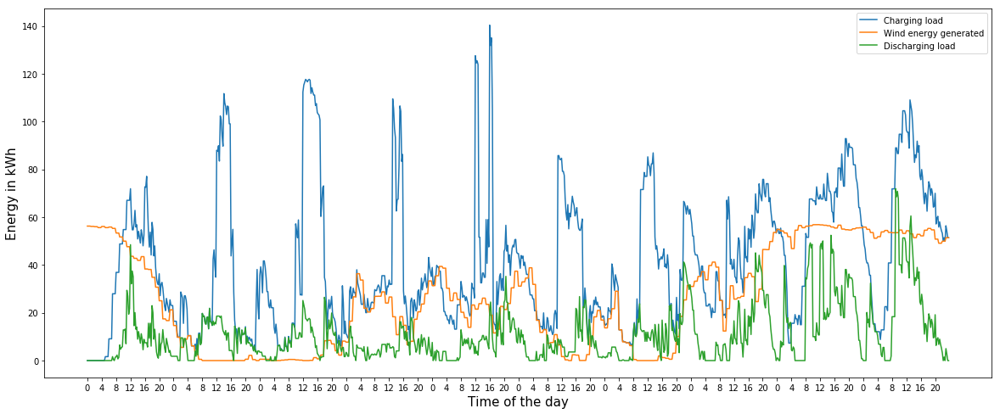

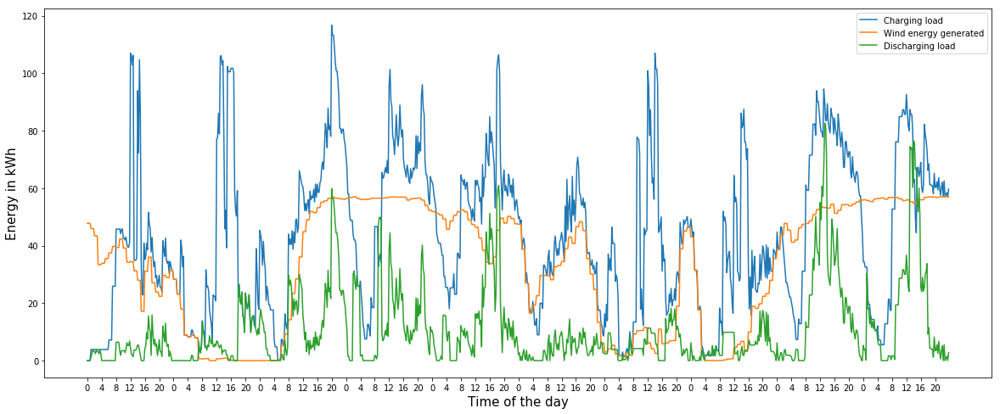

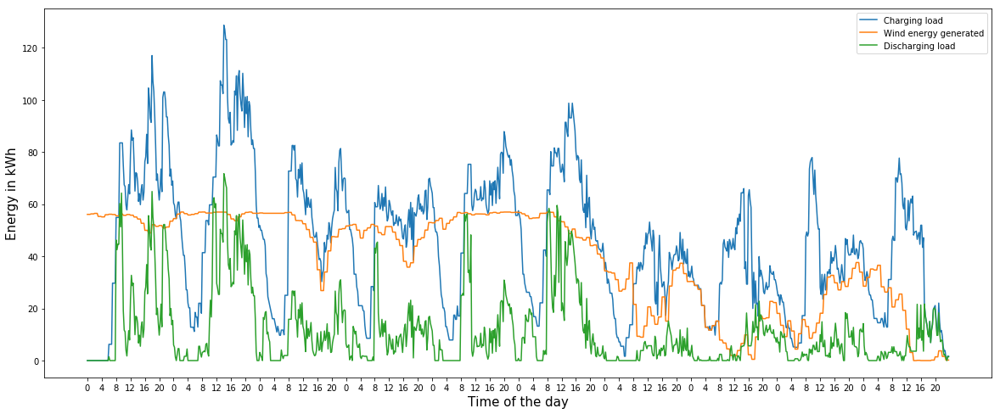

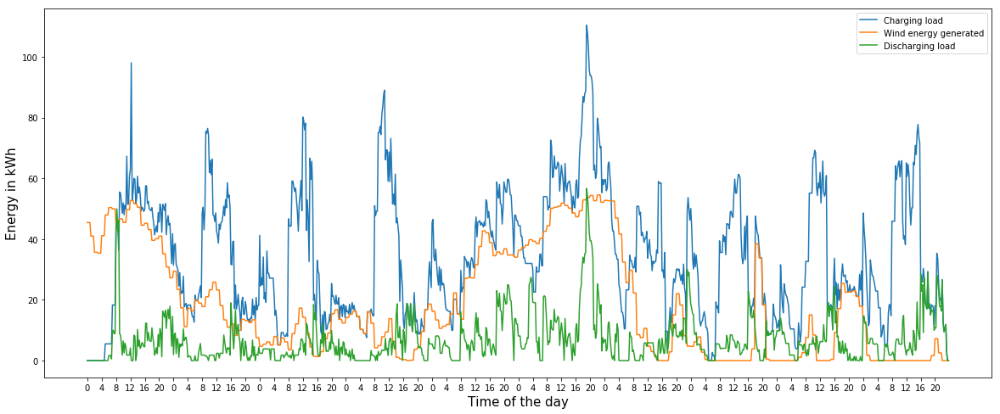

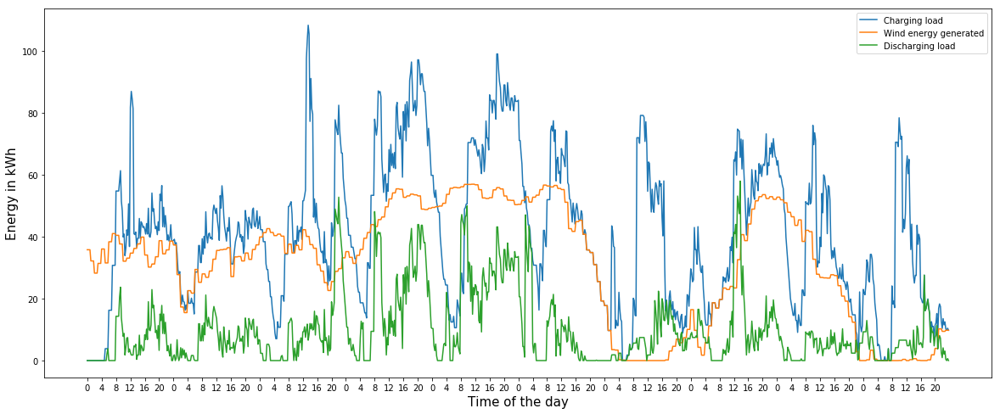

...

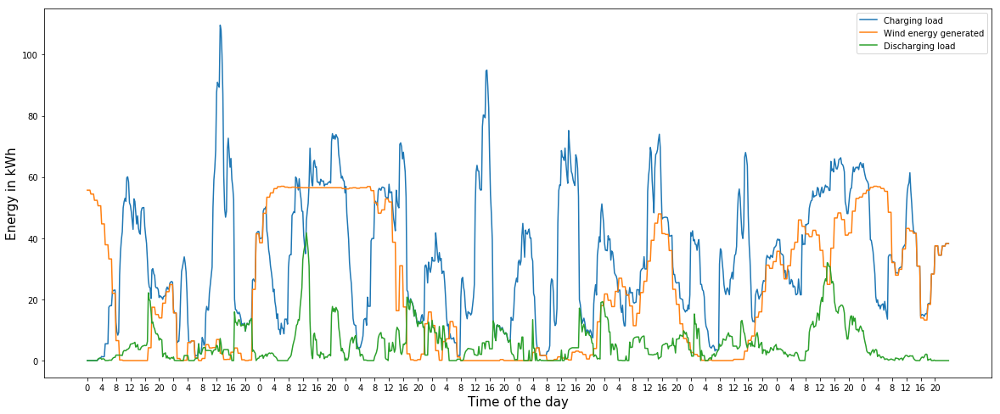

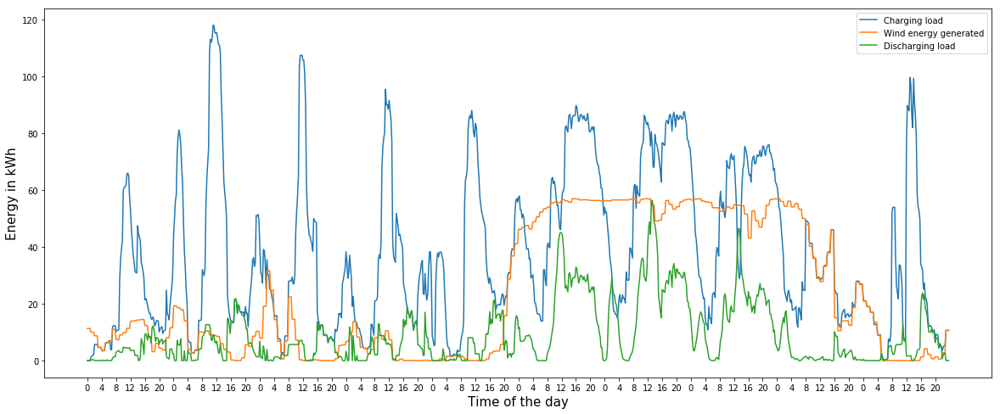

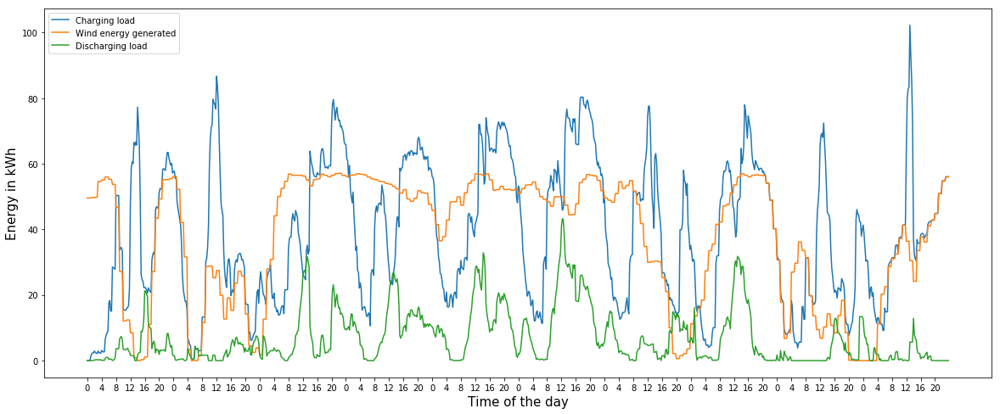

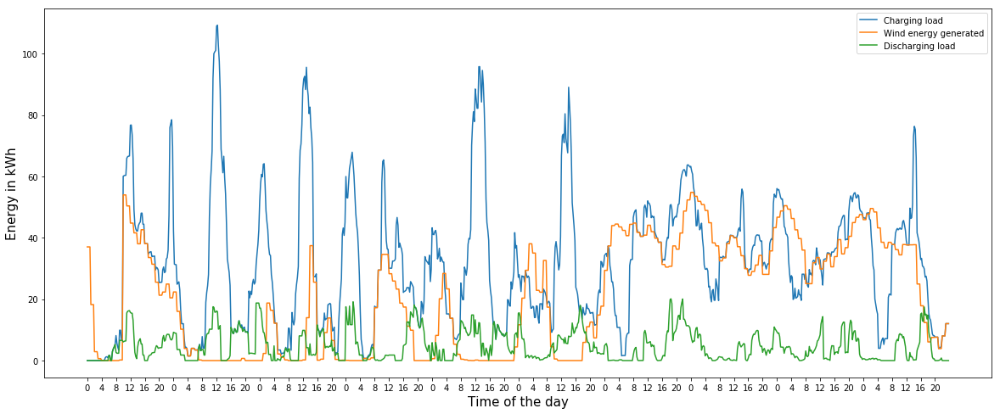

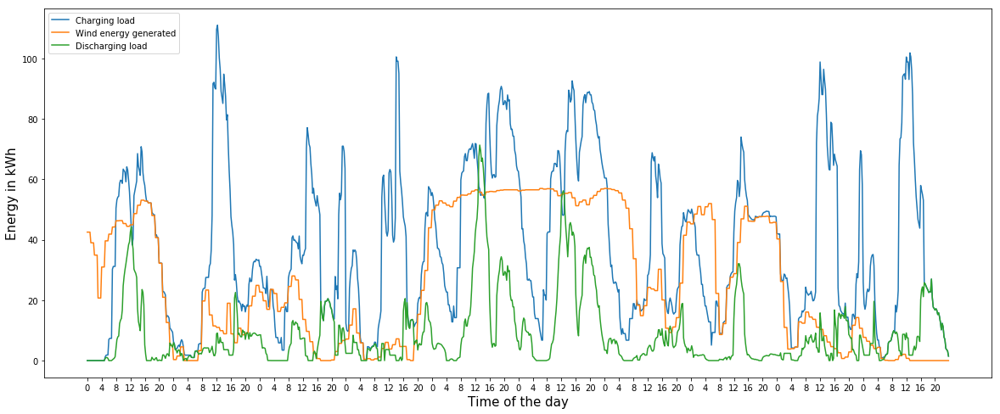

In [5]:
for delta3 in [0.0, 0.25, 0.5, 0.75, 1]:
    simulate_dynamic(S=10,low_Td=4, max_Td=12, eta_v=0.9, delta=0.25, delta1=1, delta2=0, delta3=delta3, NumberOfDays=10, eta_DC_v=0.9,
                Day_of_Month=15, p=1, Trans_P = 100, timelim =1000)
    l+=1